# Pendahuluan

Terdapat 4 csv yang disediakan.

Tujuan utama dari notebook ini adalah:
1. Mengembangkan model machine learning yang akurat dalam memprediksi curah hujan
2. Menganalisis pola yang muncul dalam data cuaca serta memahami faktor-faktor yang memengaruhi curah hujan.

# Preparation

## Import Library

In [ ]:
!pip install catboost lightgbm optuna mlxtend

In [ ]:
from tqdm import tqdm # Library untuk bar progrss
import time
import warnings # Library untuk handle warning
# warnings.filterwarnings('ignore') # Untuk mengignore beberapa warning yang ga penting, silahkan dihapus kalau mau ga diignore

# Library pemrosesan data
import pandas as pd
import numpy as np

# Library untuk visualisasi data
import matplotlib.pyplot as plt
import seaborn as sns

# Library untuk metrik dan model selection
from sklearn.metrics import mean_squared_error as mse
from sklearn.model_selection import (
    KFold,
    cross_val_predict as cvp,
    cross_val_score as cvs
)

# Library-library untuk model prediksi
from sklearn import linear_model
from sklearn import ensemble
import xgboost as xgb
import lightgbm as lgbm
import catboost as cb

# Library untuk melakukan Hyperparameter Tuning
import optuna

# Library untuk menyimpan model
import pickle

from statsmodels.graphics.tsaplots import plot_pacf

pd.set_option('display.max_columns', None)

# Stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

from mlxtend.regressor import StackingCVRegressor

import shap

from catboost import Pool
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


## Initialize some variable

In [ ]:
LABEL = 'rain_sum (mm)' # Target label di kompetisi ini
SEED = 4 # Set random seed
directory = '/content/'

# Processing dan EDA

In [ ]:
# https://drive.google.com/file/d/1wxZOLghiFSa6jyUmnRrhF217asMjxAAU/view?usp=drive_link
# https://drive.google.com/file/d/18zPI4E__FiiCBCT5By_e6yJyCnJVONrQ/view?usp=sharing
# https://drive.google.com/file/d/1eZAEVW6alZSWqLDF4OlRa9tQMjqlr_3c/view?usp=sharing
# https://drive.google.com/file/d/1pgZfQEcDbuoCn2y--fm4RLx4BYQ8I9Dj/view?usp=sharing
# https://drive.google.com/file/d/1v-i5njUEdmUUiGL4d4p5V4w2PPjZ9_te/view?usp=sharing
# https://drive.google.com/file/d/1aelKurXNTyUEJclEjXsZh9U3PzA8iNjj/view?usp=sharing

!gdown 1wxZOLghiFSa6jyUmnRrhF217asMjxAAU
!gdown 18zPI4E__FiiCBCT5By_e6yJyCnJVONrQ
!gdown 1eZAEVW6alZSWqLDF4OlRa9tQMjqlr_3c
!gdown 1pgZfQEcDbuoCn2y--fm4RLx4BYQ8I9Dj
!gdown 1v-i5njUEdmUUiGL4d4p5V4w2PPjZ9_te
!gdown 1aelKurXNTyUEJclEjXsZh9U3PzA8iNjj

Downloading...
From: https://drive.google.com/uc?id=1wxZOLghiFSa6jyUmnRrhF217asMjxAAU
To: /content/daily_test.csv
100% 805k/805k [00:00<00:00, 36.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=18zPI4E__FiiCBCT5By_e6yJyCnJVONrQ
To: /content/daily_train.csv
100% 2.77M/2.77M [00:00<00:00, 48.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1eZAEVW6alZSWqLDF4OlRa9tQMjqlr_3c
To: /content/hourly_test.csv
100% 25.3M/25.3M [00:00<00:00, 62.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1pgZfQEcDbuoCn2y--fm4RLx4BYQ8I9Dj
To: /content/hourly_train.csv
100% 84.6M/84.6M [00:01<00:00, 59.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1v-i5njUEdmUUiGL4d4p5V4w2PPjZ9_te
To: /content/location.csv
100% 576/576 [00:00<00:00, 1.63MB/s]
Downloading...
From: https://drive.google.com/uc?id=1aelKurXNTyUEJclEjXsZh9U3PzA8iNjj
To: /content/sample_submission.csv
100% 102k/102k [00:00<00:00, 46.1MB/s]


## Read dataset

In [ ]:
daily_train = pd.read_csv(f'{directory}/daily_train.csv')
daily_test = pd.read_csv(f'{directory}/daily_test.csv')
hourly_train = pd.read_csv(f'{directory}/hourly_train.csv')
hourly_test = pd.read_csv(f'{directory}/hourly_test.csv')
location = pd.read_csv(f'{directory}/location.csv')

Terdapat 5 dataset yang diberikan.

## Koreksi Tipe Data

In [ ]:
daily_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19704 entries, 0 to 19703
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ID                               19704 non-null  object 
 1   location_id                      19704 non-null  int64  
 2   time                             19704 non-null  object 
 3   temperature_2m_max (°C)          19704 non-null  float64
 4   temperature_2m_min (°C)          19704 non-null  float64
 5   temperature_2m_mean (°C)         19704 non-null  float64
 6   apparent_temperature_max (°C)    19704 non-null  float64
 7   apparent_temperature_min (°C)    19704 non-null  float64
 8   apparent_temperature_mean (°C)   19704 non-null  float64
 9   sunrise (iso8601)                19704 non-null  object 
 10  sunset (iso8601)                 19704 non-null  object 
 11  daylight_duration (s)            19704 non-null  float64
 12  sunshine_duration 

In [ ]:
daily_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5892 entries, 0 to 5891
Data columns (total 18 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ID                               5892 non-null   object 
 1   location_id                      5892 non-null   int64  
 2   time                             5892 non-null   object 
 3   temperature_2m_max (°C)          5892 non-null   float64
 4   temperature_2m_min (°C)          5892 non-null   float64
 5   temperature_2m_mean (°C)         5892 non-null   float64
 6   apparent_temperature_max (°C)    5892 non-null   float64
 7   apparent_temperature_min (°C)    5892 non-null   float64
 8   apparent_temperature_mean (°C)   5892 non-null   float64
 9   sunrise (iso8601)                5892 non-null   object 
 10  sunset (iso8601)                 5892 non-null   object 
 11  daylight_duration (s)            5892 non-null   float64
 12  sunshine_duration (s

In [ ]:
hourly_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 472896 entries, 0 to 472895
Data columns (total 32 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   location_id                              472896 non-null  int64  
 1   time                                     472896 non-null  object 
 2   temperature_2m (°C)                      472896 non-null  float64
 3   relative_humidity_2m (%)                 472896 non-null  float64
 4   dew_point_2m (°C)                        472896 non-null  float64
 5   apparent_temperature (°C)                472896 non-null  float64
 6   pressure_msl (hPa)                       472896 non-null  float64
 7   surface_pressure (hPa)                   472896 non-null  float64
 8   cloud_cover (%)                          472896 non-null  float64
 9   cloud_cover_low (%)                      472896 non-null  float64
 10  cloud_cover_mid (%)             

In [ ]:
hourly_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141408 entries, 0 to 141407
Data columns (total 32 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   location_id                              141408 non-null  int64  
 1   time                                     141408 non-null  object 
 2   temperature_2m (°C)                      141408 non-null  float64
 3   relative_humidity_2m (%)                 141408 non-null  float64
 4   dew_point_2m (°C)                        141408 non-null  float64
 5   apparent_temperature (°C)                141408 non-null  float64
 6   pressure_msl (hPa)                       141408 non-null  float64
 7   surface_pressure (hPa)                   141408 non-null  float64
 8   cloud_cover (%)                          141408 non-null  float64
 9   cloud_cover_low (%)                      141408 non-null  float64
 10  cloud_cover_mid (%)             

In [ ]:
location.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   location_id  12 non-null     int64  
 1   x            12 non-null     float64
 2   y            12 non-null     float64
 3   elevation    12 non-null     float64
dtypes: float64(3), int64(1)
memory usage: 512.0 bytes


Semua fitur pada dataset kebanyakan sudah dalam format angka. Namun ada beberapa kolom yang tidak sesuai:
1. location_id: int64 akan diganti menjadi object
2. time: object akan diganti menjadi datetime
3. sunrise (iso8601) dan sunset (iso8601): object akan diganti menjadi datetime

In [ ]:
# Koreksi Tipe Data

# location_id
daily_train['location_id'] = daily_train['location_id'].astype('object')
daily_test['location_id'] = daily_test['location_id'].astype('object')
hourly_train['location_id'] = hourly_train['location_id'].astype('object')
hourly_test['location_id'] = hourly_test['location_id'].astype('object')
location['location_id'] = location['location_id'].astype('object')

# Mengubah kolom 'time' menjadi datetime
daily_train['time'] = pd.to_datetime(daily_train['time'], errors='coerce')
daily_test['time'] = pd.to_datetime(daily_test['time'], errors='coerce')
hourly_train['time'] = pd.to_datetime(hourly_train['time'], errors='coerce')
hourly_test['time'] = pd.to_datetime(hourly_test['time'], errors='coerce')

#sunrise (iso8601) dan sunset (iso8601)
from dateutil import parser
daily_train['sunrise (iso8601)'] = daily_train['sunrise (iso8601)'].apply(parser.parse)
daily_test['sunrise (iso8601)'] = daily_test['sunrise (iso8601)'].apply(parser.parse)
daily_train['sunset (iso8601)'] = daily_train['sunset (iso8601)'].apply(parser.parse)
daily_test['sunset (iso8601)'] = daily_test['sunset (iso8601)'].apply(parser.parse)

## Checking Duplicates

Cek duplikasi pada data train

In [ ]:
# Cek duplikasi untuk 3 DataFrame dengan mengecualikan kolom location_id
dataframes = {
    "daily_train": daily_train,
    "hourly_train": hourly_train,
    "location": location
}

for name, df in dataframes.items():
    df_excluded = df.drop(columns=['location_id'], errors='ignore')

    duplicates = df_excluded[df_excluded.duplicated()]
    num_duplicates = len(duplicates)

    print(f"Jumlah duplikasi pada dataset {name} (tanpa location_id): {num_duplicates}")
    if num_duplicates > 0:
        print(f"Baris duplikat pada dataset {name}:\n{duplicates}\n")


Jumlah duplikasi pada dataset daily_train (tanpa location_id): 0
Jumlah duplikasi pada dataset hourly_train (tanpa location_id): 0
Jumlah duplikasi pada dataset location (tanpa location_id): 0


Tidak ada duplikasi

## Checking Missing Value

About missing value

In [ ]:
dataframes = {
    "daily_train": daily_train,
    "daily_test": daily_test,
    "hourly_train": hourly_train,
    "hourly_test": hourly_test,
    "location": location
}

for name, df in dataframes.items():
    print(f"\nMissing Values in {name}:")
    missing_values = df.isnull().sum()
    missing_percentage = (df.isnull().sum() / len(df)) * 100
    missing_info = pd.DataFrame({
        'Missing Values': missing_values,
        'Percentage': missing_percentage
    })
    print(missing_info)


Missing Values in daily_train:
                                 Missing Values  Percentage
ID                                            0         0.0
location_id                                   0         0.0
time                                          0         0.0
temperature_2m_max (°C)                       0         0.0
temperature_2m_min (°C)                       0         0.0
temperature_2m_mean (°C)                      0         0.0
apparent_temperature_max (°C)                 0         0.0
apparent_temperature_min (°C)                 0         0.0
apparent_temperature_mean (°C)                0         0.0
sunrise (iso8601)                             0         0.0
sunset (iso8601)                              0         0.0
daylight_duration (s)                         0         0.0
sunshine_duration (s)                         0         0.0
rain_sum (mm)                                 0         0.0
wind_speed_10m_max (km/h)                     0         0.0
wind_gus

Terdapat missing value pada data test:


*   daily_test: sunshine_duration (s), shortwave_radiation_sum (MJ/m²), et0_fao_evapotranspiration (mm)
*   hourly_test: et0_fao_evapotranspiration (mm), shortwave_radiation_instant (W/m²), direct_radiation_instant (W/m²), diffuse_radiation_instant (W/m²), direct_normal_irradiance_instant (W/m²)


Tetapi missing value tergolong tidak terlalu banyak. Selanjutkan akan dilakukan eksplorasi untuk missing value ini.

## Handling Missing Value pada Data Test

In [ ]:
# Menampilkan baris dengan missing value
missing_values = daily_test[daily_test.isnull().any(axis=1)]
missing_values

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
1469,loc3_20241030,3,2024-10-30,31.3,22.8,25.9,201.4,26.0,37.3,2024-10-30 05:10:00,2024-10-30 17:33:00,44547.82,NaN,17.8,38.2,267.0,NaN,NaN
4906,loc10_20241030,10,2024-10-30,33.3,23.6,27.1,180.8,27.2,44.7,2024-10-30 04:57:00,2024-10-30 17:20:00,44599.56,NaN,12.3,29.2,256.0,NaN,NaN


In [ ]:
# Menampilkan baris dengan missing value
missing_values = hourly_test[hourly_test.isnull().any(axis=1)]
missing_values

,location_id,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),et0_fao_evapotranspiration (mm),vapour_pressure_deficit (kPa),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),soil_temperature_0_to_7cm (°C),soil_temperature_7_to_28cm (°C),soil_temperature_28_to_100cm (°C),soil_temperature_100_to_255cm (°C),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³),shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
35263,3,2024-10-30 07:00:00,26.5,81.0,22.9,31.1,1012.8,999.5,25.0,25.0,0.0,0.0,NaN,0.67,5.7,7.2,288.0,292.0,15.5,25.8,27.9,27.9,27.4,0.124,0.083,0.103,0.205,NaN,NaN,NaN,NaN,597.8
35264,3,2024-10-30 08:00:00,28.2,73.0,22.9,33.0,1013.4,1000.2,60.0,17.0,1.0,51.0,NaN,1.04,4.6,5.4,231.0,236.0,16.2,27.6,27.9,27.9,27.4,0.125,0.084,0.104,0.205,NaN,NaN,NaN,NaN,893.4
35265,3,2024-10-30 09:00:00,29.5,66.0,22.5,34.0,1012.8,999.6,48.0,13.0,8.0,39.0,NaN,1.41,5.0,6.1,178.0,177.0,16.9,29.7,28.0,27.9,27.4,0.124,0.084,0.104,0.205,NaN,NaN,NaN,NaN,1131.1
35266,3,2024-10-30 10:00:00,30.6,61.0,22.2,34.5,1012.3,999.2,21.0,14.0,13.0,0.0,NaN,1.71,7.2,9.1,162.0,162.0,20.2,31.5,28.1,27.9,27.4,0.123,0.083,0.104,0.205,NaN,NaN,NaN,NaN,1294.8
35267,3,2024-10-30 11:00:00,31.3,57.0,21.8,34.8,1011.2,998.1,37.0,12.0,21.0,11.0,NaN,1.97,9.2,11.4,177.0,175.0,24.5,33.1,28.3,27.9,27.4,0.122,0.083,0.104,0.205,NaN,NaN,NaN,NaN,1373.3
35268,3,2024-10-30 12:00:00,29.7,60.0,21.1,31.5,1010.7,997.6,80.0,60.0,60.0,13.0,NaN,1.66,17.8,23.0,153.0,154.0,38.2,34.0,28.6,27.9,27.4,0.122,0.083,0.103,0.205,NaN,NaN,NaN,NaN,1361.3
35269,3,2024-10-30 13:00:00,28.9,70.0,22.9,33.5,1009.7,996.6,37.0,13.0,20.0,16.0,NaN,1.19,5.1,6.3,197.0,195.0,38.2,32.7,28.8,27.9,27.4,0.132,0.082,0.103,0.205,NaN,NaN,NaN,NaN,1259.6
35270,3,2024-10-30 14:00:00,31.0,62.0,23.0,35.1,1008.4,995.4,100.0,100.0,12.0,83.0,NaN,1.69,9.2,11.3,182.0,182.0,22.0,33.5,29.0,27.9,27.4,0.131,0.082,0.103,0.205,NaN,NaN,NaN,NaN,1075.1
35271,3,2024-10-30 15:00:00,26.9,78.0,22.7,31.4,1009.1,995.9,100.0,22.0,77.0,98.0,NaN,0.78,5.4,7.5,132.0,138.0,31.0,31.3,29.1,27.9,27.4,0.144,0.082,0.103,0.205,NaN,NaN,NaN,NaN,820.5
35272,3,2024-10-30 16:00:00,27.5,76.0,23.0,32.7,1009.2,996.0,99.0,77.0,41.0,96.0,NaN,0.86,1.8,2.2,246.0,228.0,14.8,30.2,29.2,27.9,27.4,0.145,0.082,0.103,0.205,NaN,NaN,NaN,NaN,513.1


Terdapat missing value pada data test:

* daily_test:
  * sunshine_duration (s),
  * shortwave_radiation_sum (MJ/m²),
  * et0_fao_evapotranspiration (mm)
* hourly_test:
  * et0_fao_evapotranspiration (mm),
  * shortwave_radiation_instant (W/m²),
  * direct_radiation_instant (W/m²),
  * diffuse_radiation_instant (W/m²),
  * direct_normal_irradiance_instant (W/m²)

Fakta unik:
1. Missing value pada daily_test terjadi pada:
  * location_id = 3, time: 2024-10-30
  * location_id = 10, time: 2024-10-30
2. Missing value pada hourly_test terjadi pada:
  * location_id = 3, time: 2024-10-30 07:00:00 hingga 2024-10-30 17:00:00
  * location_id = 10, time: 2024-10-30 07:00:00 hingga 2024-10-30 16:00:00

Akan dibuat beberapa visualisasi untuk diteliti secara lebih lanjut mengenai missing value tersebut.



#### daily_test

* Visualisasi 4 minggu sebelum dan sesudah data daily_test:
  * Baris: (Data hanya tersedia hingga 2024-11-1)
    * location_id = 3, time: 2024-10-30
    * location_id = 10, time: 2024-10-30
  * Kolom:   
    * sunshine_duration (s),
    * shortwave_radiation_sum (MJ/m²),
    * et0_fao_evapotranspiration (mm)

  

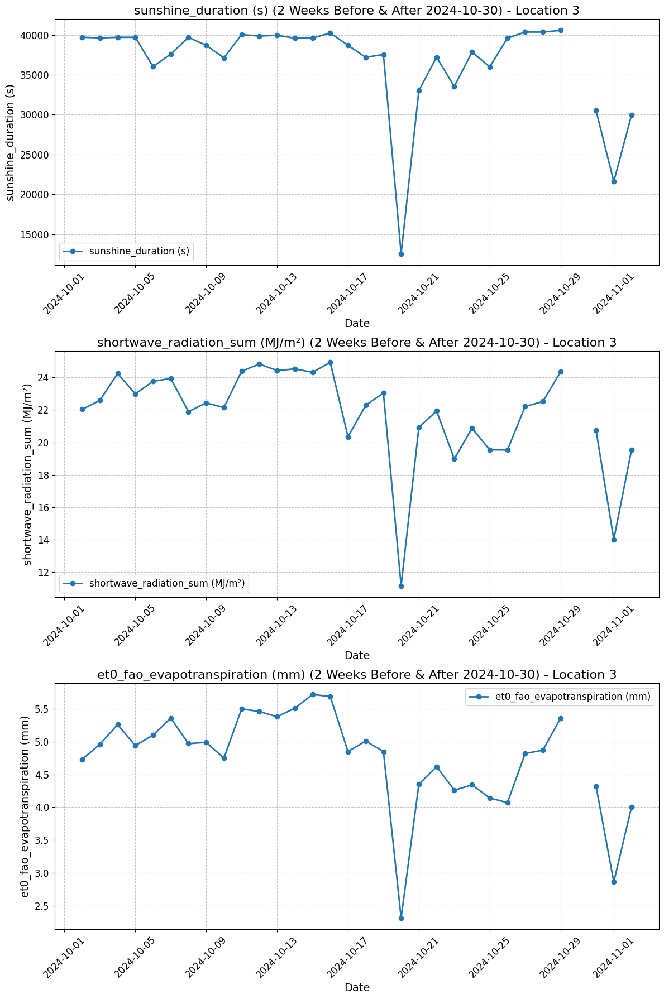

In [ ]:
# daily_test, location_id = 3, time: 2024-10-30

df_eda = daily_test.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

location_id = 3
center_date = "2024-10-30"

center_date = pd.to_datetime(center_date)
start_date = center_date - pd.Timedelta(weeks=4)
end_date = center_date + pd.Timedelta(weeks=4)

location_data = df_eda[
    (df_eda['location_id'] == location_id) &
    (df_eda['time'] >= start_date) &
    (df_eda['time'] <= end_date)
]

columns_to_plot = [
    'sunshine_duration (s)',
    'shortwave_radiation_sum (MJ/m²)',
    'et0_fao_evapotranspiration (mm)'
]

plt.figure(figsize=(12, 6 * len(columns_to_plot)))

for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(len(columns_to_plot), 1, i)
    daily_data = location_data.groupby('time')[col].mean().reset_index()
    plt.plot(daily_data['time'], daily_data[col], marker='o', linewidth=2, label=col)
    plt.title(f"{col} (2 Weeks Before & After {center_date.date()}) - Location {location_id}", fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel(col, fontsize=14)
    plt.xticks(fontsize=12, rotation=45)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)

plt.tight_layout()
plt.show()

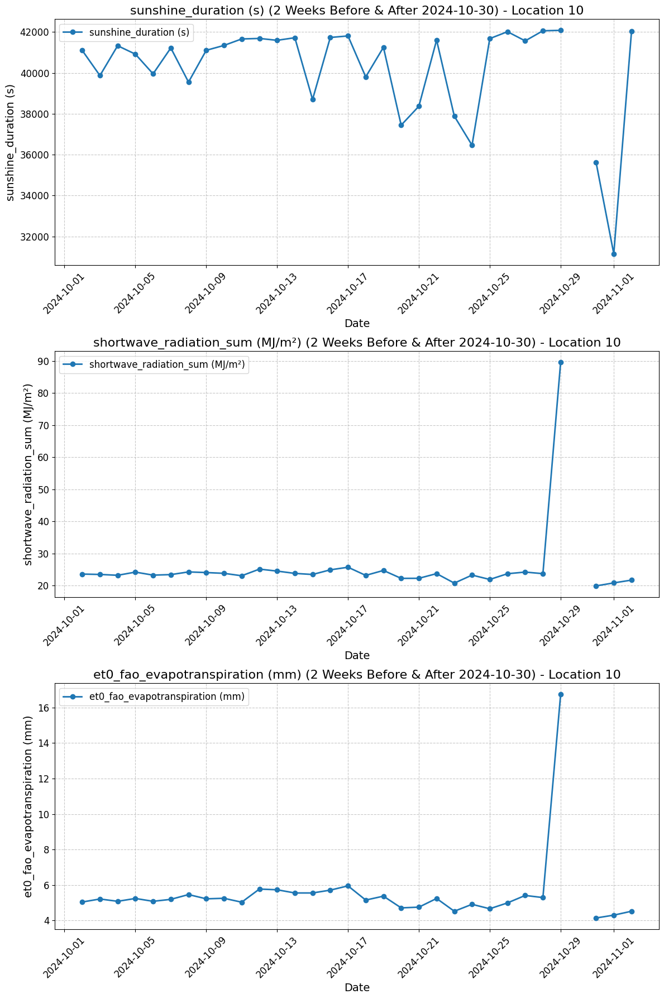

In [ ]:
# daily_test, location_id = 10, time: 2024-10-30

df_eda = daily_test.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

location_id = 10
center_date = "2024-10-30"

center_date = pd.to_datetime(center_date)
start_date = center_date - pd.Timedelta(weeks=4)
end_date = center_date + pd.Timedelta(weeks=4)


location_data = df_eda[
    (df_eda['location_id'] == location_id) &
    (df_eda['time'] >= start_date) &
    (df_eda['time'] <= end_date)
]


columns_to_plot = [
    'sunshine_duration (s)',
    'shortwave_radiation_sum (MJ/m²)',
    'et0_fao_evapotranspiration (mm)'
]


plt.figure(figsize=(12, 6 * len(columns_to_plot)))

for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(len(columns_to_plot), 1, i)
    daily_data = location_data.groupby('time')[col].mean().reset_index()
    plt.plot(daily_data['time'], daily_data[col], marker='o', linewidth=2, label=col)
    plt.title(f"{col} (2 Weeks Before & After {center_date.date()}) - Location {location_id}", fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel(col, fontsize=14)
    plt.xticks(fontsize=12, rotation=45)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)

plt.tight_layout()
plt.show()

#### Handling

Ide imputasi:
Komponen meteorologi sangat tergantung dengan lokasi dan waktu kapan terjadinya fenomena. Selain itu, cuaca pada hari sebelumnya akan cenderung memiliki karakteristik yang sama dengan hari setelahnya. Oleh karena itu akan digunakan ide imputasi missing value sebagai berikut:
1. daily_test: Pada lokasi yang sama, akan dimasukan rata-rata dari nilai 2 hari sebelum dan 2 hari sesudah.
2. hourly_test: Pada lokasi dan jam yang sama, akan dimasukan rata-rata dari nilai 2 hari sebelum dan 2 hari sesudah.

In [ ]:
# daily_test
columns_to_impute = ['sunshine_duration (s)', 'shortwave_radiation_sum (MJ/m²)', 'et0_fao_evapotranspiration (mm)']

# Fungsi untuk imputasi rata-rata 2 hari sebelum dan 2 hari sesudah
def impute_missing_values(df, columns):
    for col in columns:

        df = df.sort_values(by=['location_id', 'time'])

        df[f'{col}_imputed'] = df.groupby('location_id')[col].transform(
            lambda x: x.fillna(
                x.rolling(window=5, center=True, min_periods=1).mean()
            )
        )

        df[col] = df[f'{col}_imputed'].where(df[col].isnull(), df[col])
        df.drop(columns=[f'{col}_imputed'], inplace=True)
    return df

daily_test = impute_missing_values(daily_test, columns_to_impute)
print(daily_test[columns_to_impute].isnull().sum())

sunshine_duration (s)              0
shortwave_radiation_sum (MJ/m²)    0
et0_fao_evapotranspiration (mm)    0
dtype: int64


In [ ]:
# hourly_test
columns_to_impute = [
    'et0_fao_evapotranspiration (mm)',
    'shortwave_radiation_instant (W/m²)',
    'direct_radiation_instant (W/m²)',
    'diffuse_radiation_instant (W/m²)',
    'direct_normal_irradiance_instant (W/m²)'
]

# Fungsi untuk imputasi rata-rata 2 hari sebelum dan 2 hari sesudah
def impute_hourly_missing_values(df, columns):
    for col in columns:
        df = df.sort_values(by=['location_id', 'time'])

        df['hour'] = df['time'].dt.hour

        df[f'{col}_imputed'] = (
            df.groupby(['location_id', 'hour'])[col]
            .transform(lambda x: x.fillna(
                x.rolling(window=5, center=True, min_periods=1).mean()
            ))
        )

        df[col] = df[f'{col}_imputed'].where(df[col].isnull(), df[col])
        df.drop(columns=[f'{col}_imputed'], inplace=True)

    df.drop(columns=['hour'], inplace=True)
    return df

hourly_test = impute_hourly_missing_values(hourly_test, columns_to_impute)
print(hourly_test[columns_to_impute].isnull().sum())

et0_fao_evapotranspiration (mm)            0
shortwave_radiation_instant (W/m²)         0
direct_radiation_instant (W/m²)            0
diffuse_radiation_instant (W/m²)           0
direct_normal_irradiance_instant (W/m²)    0
dtype: int64


## Checking Outlier Data Train (secara umum)

### Kategorik

In [ ]:
# Dictionary DataFrame
category = {
    "daily_train": daily_train,
    "daily_test": daily_test,
    "hourly_train": hourly_train,
    "hourly_test": hourly_test,
    "location": location
}

# Loop untuk setiap DataFrame
for name, df in category.items():
    print(f"--- Nilai unik untuk dataset {name} ---")
    for col in df.select_dtypes(include=['object', 'category']).columns:
        print(f"Kolom {col}")
        print(df[col].unique())
        print('')
    print('---------------------------------------\n')

--- Nilai unik untuk dataset daily_train ---
Kolom ID
['loc1_20190101' 'loc1_20190102' 'loc1_20190103' ... 'loc12_20230628'
 'loc12_20230629' 'loc12_20230630']

Kolom location_id
[1 2 3 4 5 6 7 8 9 10 11 12]

---------------------------------------

--- Nilai unik untuk dataset daily_test ---
Kolom ID
['loc1_20230701' 'loc1_20230702' 'loc1_20230703' ... 'loc12_20241031'
 'loc12_20241101' 'loc12_20241102']

Kolom location_id
[1 2 3 4 5 6 7 8 9 10 11 12]

---------------------------------------

--- Nilai unik untuk dataset hourly_train ---
Kolom location_id
[1 2 3 4 5 6 7 8 9 10 11 12]

---------------------------------------

--- Nilai unik untuk dataset hourly_test ---
Kolom location_id
[1 2 3 4 5 6 7 8 9 10 11 12]

---------------------------------------

--- Nilai unik untuk dataset location ---
Kolom location_id
[1 2 3 4 5 6 7 8 9 10 11 12]

---------------------------------------



Terdapat 12 lokasi untuk dataset ini. Akan dilihat berapa jumlah baris data untuk setiap lokasi.

In [ ]:
# daily_train
daily_train_counts = daily_train['location_id'].value_counts()
print("Jumlah baris per nilai unik di 'daily_train':")
print(daily_train_counts)

# hourly_train
hourly_train_counts = hourly_train['location_id'].value_counts()
print("\nJumlah baris per nilai unik di 'hourly_train':")
print(hourly_train_counts)

Jumlah baris per nilai unik di 'daily_train':
location_id
1     1642
2     1642
3     1642
4     1642
5     1642
6     1642
7     1642
8     1642
9     1642
10    1642
11    1642
12    1642
Name: count, dtype: int64

Jumlah baris per nilai unik di 'hourly_train':
location_id
1     39408
2     39408
3     39408
4     39408
5     39408
6     39408
7     39408
8     39408
9     39408
10    39408
11    39408
12    39408
Name: count, dtype: int64


Jumlah baris data untuk setiap lokasi seimbang.

### Numerik

In [ ]:
daily_train.describe()

,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
count,19704,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704,19704,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000
mean,2021-03-31 11:59:59.999999744,30.180994,23.028350,26.120676,35.139444,26.752345,30.288474,2021-03-31 17:34:28.434835712,2021-04-01 05:40:47.186358272,43579.269557,33191.281265,6.998518,13.862099,31.932049,182.538063,18.556157,4.007216
min,2019-01-01 00:00:00,21.800000,13.800000,20.700000,23.900000,13.800000,20.600000,2019-01-01 05:10:00,2019-01-01 17:45:00,41924.220000,0.000000,0.000000,4.200000,10.800000,0.000000,2.260000,0.620000
25%,2020-02-15 00:00:00,28.600000,22.200000,25.200000,33.500000,25.500000,29.200000,2020-02-15 05:40:45,2020-02-15 18:01:45,42551.497500,28800.000000,0.400000,10.200000,25.600000,112.000000,16.270000,3.320000
50%,2021-03-31 12:00:00,30.100000,23.400000,26.300000,35.500000,27.400000,30.800000,2021-03-31 17:41:30,2021-04-01 05:43:30,43532.530000,37276.065000,2.900000,13.000000,30.600000,190.000000,19.030000,3.930000
75%,2022-05-16 00:00:00,31.500000,24.300000,27.300000,37.000000,28.700000,32.000000,2022-05-16 05:40:00,2022-05-16 17:26:15,44599.775000,39469.267500,9.600000,16.700000,37.100000,259.000000,21.220000,4.612500
max,2023-06-30 00:00:00,39.900000,27.900000,31.300000,43.100000,33.100000,35.800000,2023-06-30 06:03:00,2023-06-30 17:49:00,45358.290000,42429.950000,343.800000,38.000000,74.500000,360.000000,28.450000,8.560000
std,NaN,2.247493,1.904473,1.739846,2.558647,2.862154,2.325849,NaN,NaN,1061.953764,8766.887690,11.103593,4.837510,8.361036,86.825075,3.871296,1.067831


In [ ]:
# Untuk Variabel Numerik
dataframes = {
    "daily_train": daily_train,
    "daily_test": daily_test,
    "hourly_train": hourly_train,
    "hourly_test": hourly_test,
    "location": location
}

for name, df in dataframes.items():
    print(f"\nOutlier Analysis for {name}:")
    df_unfiltered = df
    df_num_features = df.select_dtypes(include=np.number)

    # Menghitung IQR
    Q1 = df_num_features.quantile(0.25)  # Kuantil 0.25
    Q3 = df_num_features.quantile(0.75)  # Kuantil 0.75
    IQR = Q3 - Q1  # Interquartile Range

    # Mengidentifikasi outlier
    outlier = (df_num_features < (Q1 - 1.5 * IQR)) | (df_num_features > (Q3 + 1.5 * IQR))

    for col in outlier.columns:
        total_outliers = outlier[col].sum()
        print(f"  Total number of outliers in column '{col}': {total_outliers}")


Outlier Analysis for daily_train:
  Total number of outliers in column 'temperature_2m_max (°C)': 294
  Total number of outliers in column 'temperature_2m_min (°C)': 1040
  Total number of outliers in column 'temperature_2m_mean (°C)': 340
  Total number of outliers in column 'apparent_temperature_max (°C)': 164
  Total number of outliers in column 'apparent_temperature_min (°C)': 1024
  Total number of outliers in column 'apparent_temperature_mean (°C)': 682
  Total number of outliers in column 'daylight_duration (s)': 0
  Total number of outliers in column 'sunshine_duration (s)': 828
  Total number of outliers in column 'rain_sum (mm)': 1242
  Total number of outliers in column 'wind_speed_10m_max (km/h)': 323
  Total number of outliers in column 'wind_gusts_10m_max (km/h)': 261
  Total number of outliers in column 'wind_direction_10m_dominant (°)': 0
  Total number of outliers in column 'shortwave_radiation_sum (MJ/m²)': 362
  Total number of outliers in column 'et0_fao_evapotrans

Generating boxplot for daily_train...


<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` a

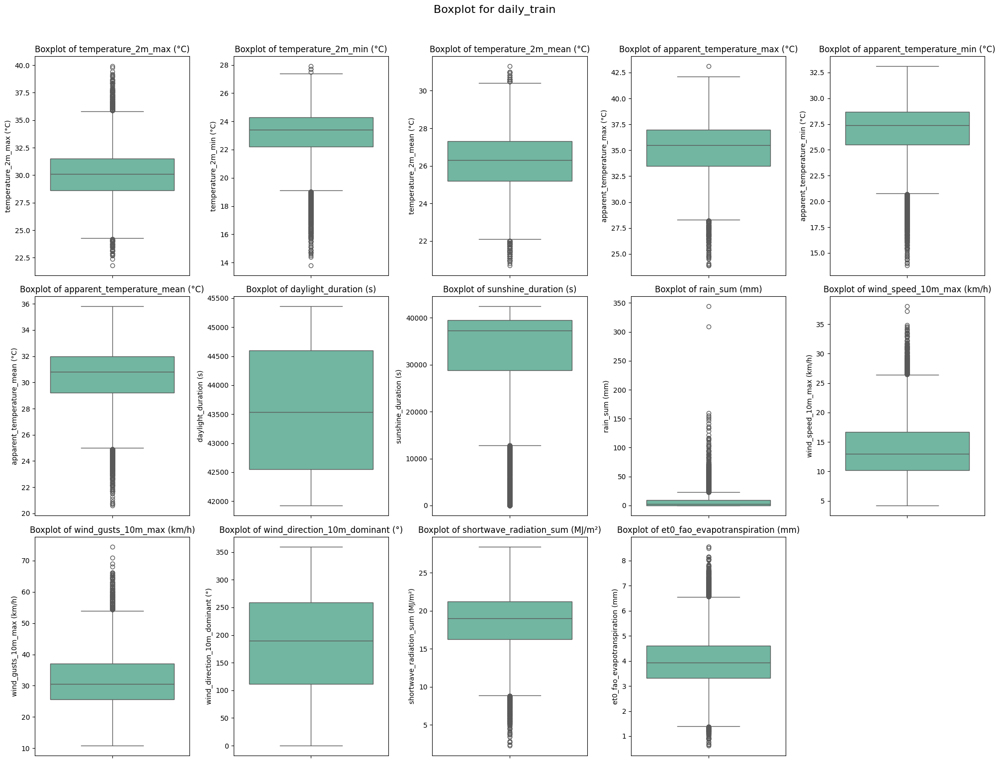

Generating boxplot for daily_test...


<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` a

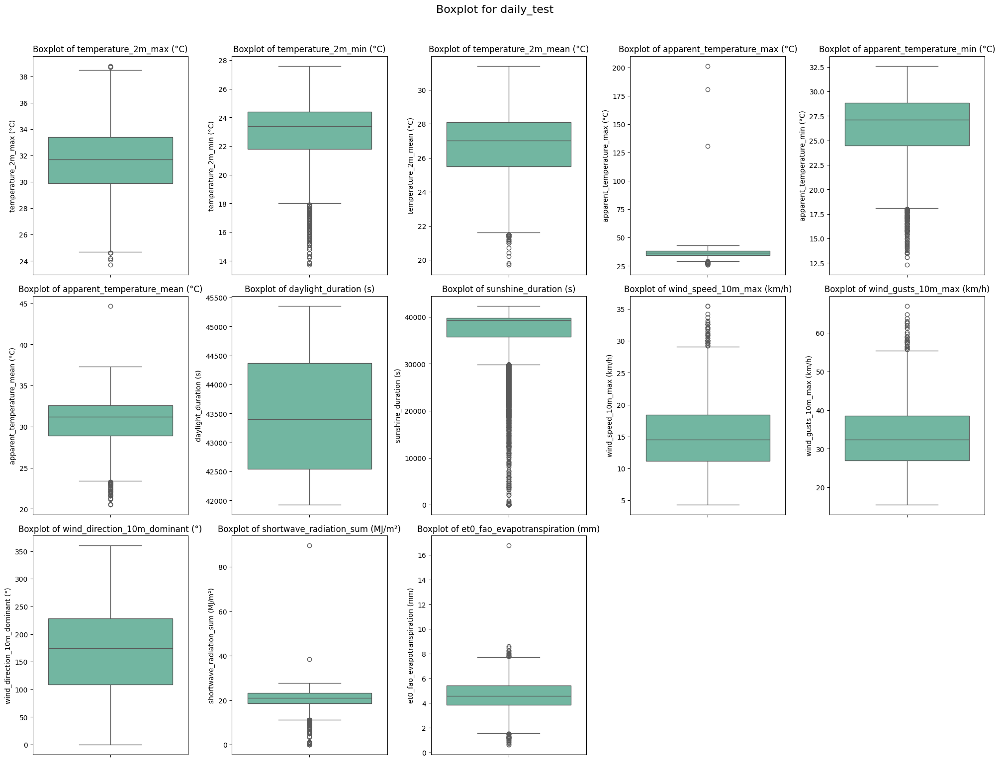

Generating boxplot for hourly_train...


<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` a

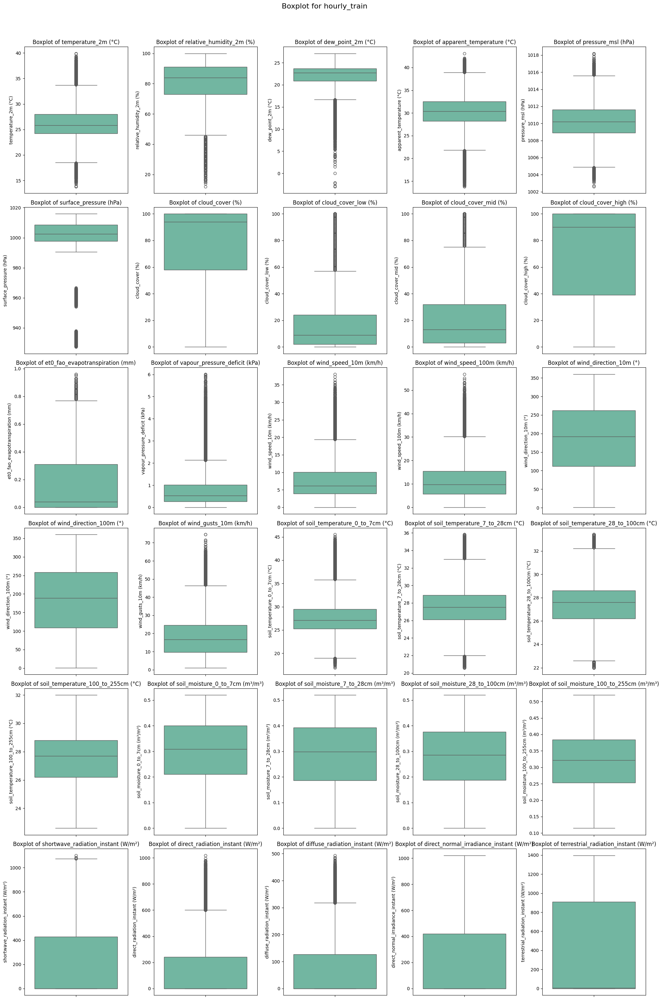

Generating boxplot for hourly_test...


<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
<ipython-input-24-3f785c14b7b4>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` a

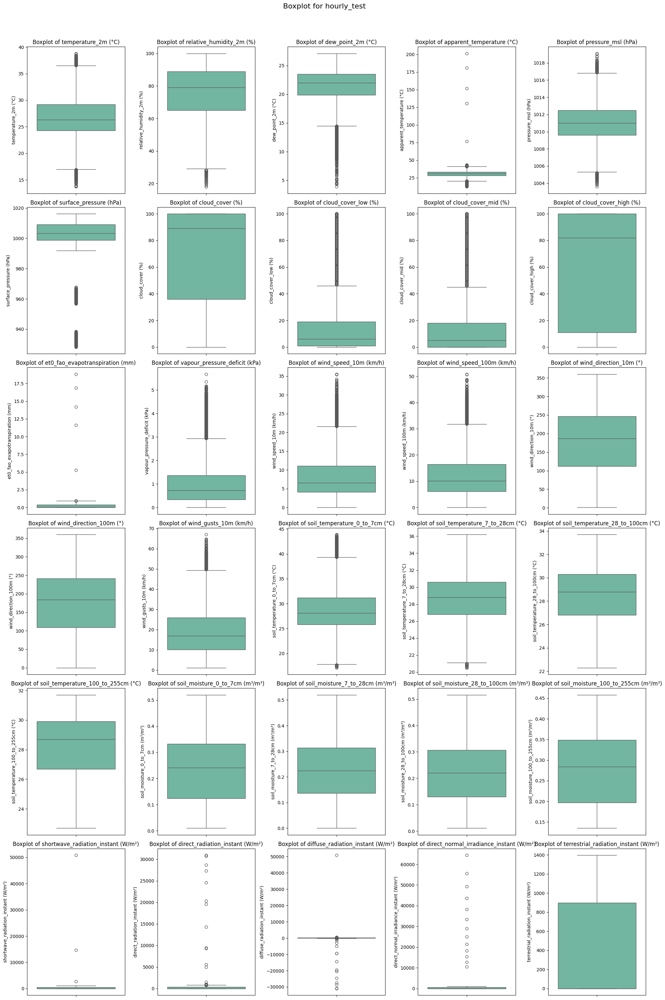

In [ ]:
def boxplot_features(df, title, ncols=5):
    numeric_cols = df.select_dtypes(include=['int64', 'int32', 'float64', 'timedelta64[ns]']).columns
    n = len(numeric_cols)
    nrows = int(np.ceil(n / ncols))

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 4, nrows * 5))
    axs = axs.flatten()

    for ax, column in zip(axs, numeric_cols):
        sns.boxplot(data=df, y=column, ax=ax, palette='Set2')
        ax.set_title(f'Boxplot of {column}')

    for i in range(len(numeric_cols), len(axs)):
        fig.delaxes(axs[i])

    plt.suptitle(title, fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

dataframes = {
    "daily_train": daily_train,
    "daily_test": daily_test,
    "hourly_train": hourly_train,
    "hourly_test": hourly_test
}

for name, df in dataframes.items():
    print(f"Generating boxplot for {name}...")
    boxplot_features(df, title=f"Boxplot for {name}", ncols=5)

Terdapat banyak outlier pada setiap dataframe jika menggunakan metode IQR. Akan dilakukan EDA dan analisis lain sebelum melakukan tindakan pada outlier tersebut.

##EDA dan Feature Eng dari setiap Dataframe

Kita memiliki 5 dataframe:
* daily_train
* daily_test
* hourly_train
* hourly_test
* location

### daily_test

In [ ]:
daily_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5892 entries, 0 to 5891
Data columns (total 18 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   ID                               5892 non-null   object        
 1   location_id                      5892 non-null   object        
 2   time                             5892 non-null   datetime64[ns]
 3   temperature_2m_max (°C)          5892 non-null   float64       
 4   temperature_2m_min (°C)          5892 non-null   float64       
 5   temperature_2m_mean (°C)         5892 non-null   float64       
 6   apparent_temperature_max (°C)    5892 non-null   float64       
 7   apparent_temperature_min (°C)    5892 non-null   float64       
 8   apparent_temperature_mean (°C)   5892 non-null   float64       
 9   sunrise (iso8601)                5892 non-null   datetime64[ns]
 10  sunset (iso8601)                 5892 non-null   datetime64[

In [ ]:
daily_test.describe()

,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
count,5892,5892.000000,5892.000000,5892.000000,5892.000000,5892.000000,5892.000000,5892,5892,5892.000000,5892.000000,5892.000000,5892.000000,5892.000000,5892.000000,5892.000000
mean,2024-03-02 00:00:00,31.672794,22.863764,26.731908,36.321572,26.360149,30.564596,2024-03-02 05:34:03.054989824,2024-03-02 17:38:51.670061056,43489.217838,36355.857083,15.022115,33.129209,172.792261,20.555978,4.637805
min,2023-07-01 00:00:00,23.700000,13.700000,19.700000,25.900000,12.300000,20.500000,2023-07-01 05:39:00,2023-07-01 17:18:00,41924.060000,0.000000,4.300000,15.500000,0.000000,0.000000,0.630000
25%,2023-10-31 00:00:00,29.900000,21.800000,25.500000,34.500000,24.500000,28.900000,2023-10-31 05:18:00,2023-10-31 17:38:30,42539.502500,35788.752500,11.200000,27.000000,109.000000,18.490000,3.860000
50%,2024-03-02 00:00:00,31.700000,23.400000,27.000000,36.600000,27.100000,31.200000,2024-03-02 05:42:00,2024-03-02 17:56:30,43400.035000,39283.095000,14.500000,32.400000,174.000000,21.050000,4.580000
75%,2024-07-03 00:00:00,33.400000,24.400000,28.100000,38.200000,28.825000,32.600000,2024-07-03 05:42:15,2024-07-03 17:24:00,44372.960000,39739.757500,18.400000,38.500000,228.000000,23.310000,5.400000
max,2024-11-02 00:00:00,38.800000,27.600000,31.400000,201.400000,32.600000,44.700000,2024-11-02 05:26:00,2024-11-02 17:46:00,45358.520000,42360.760000,35.500000,67.000000,360.000000,89.530000,16.740000
std,NaN,2.526868,2.203253,2.023901,4.153023,3.309636,2.677379,NaN,NaN,1010.700076,6661.038307,5.036290,8.034490,81.713324,3.855191,1.152624


Data test mulai dari 1 Juli 2024 hingga 2 November 2024

* Boxplot

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


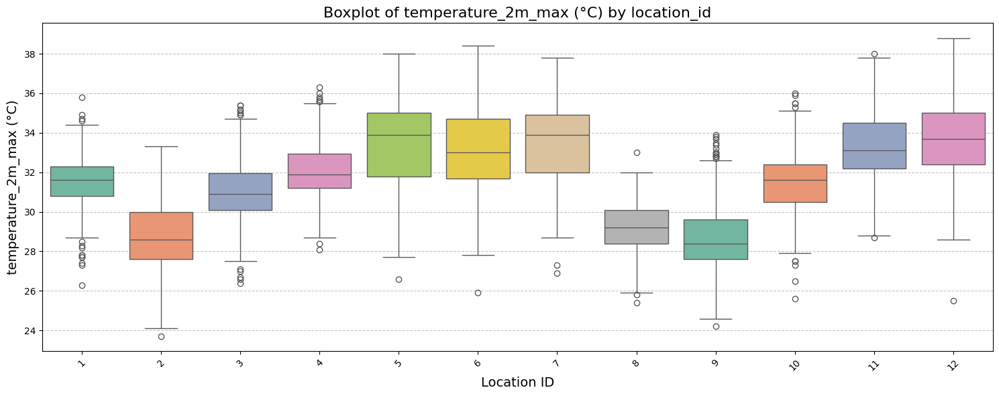

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


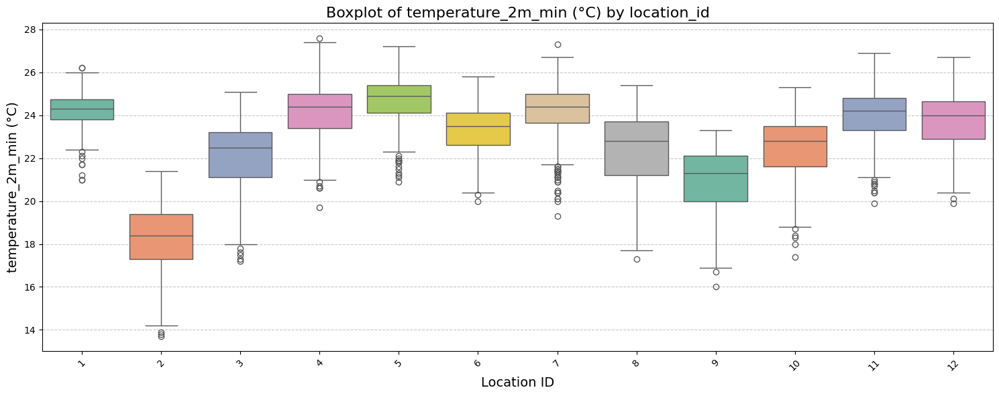

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


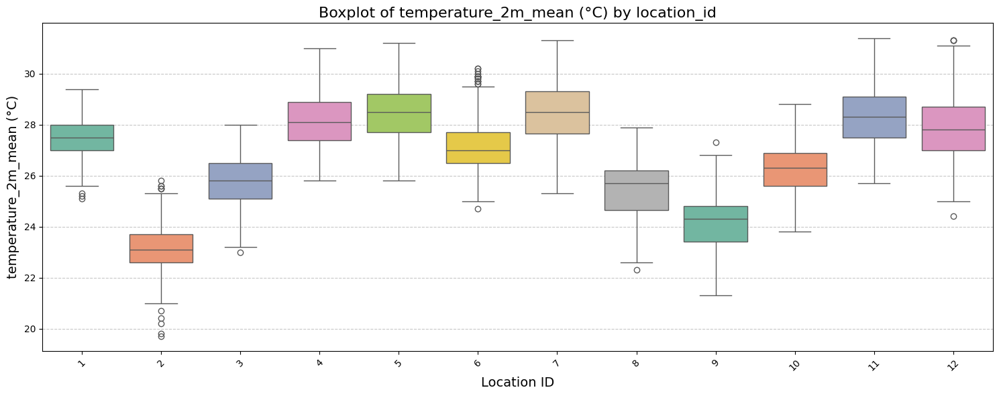

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


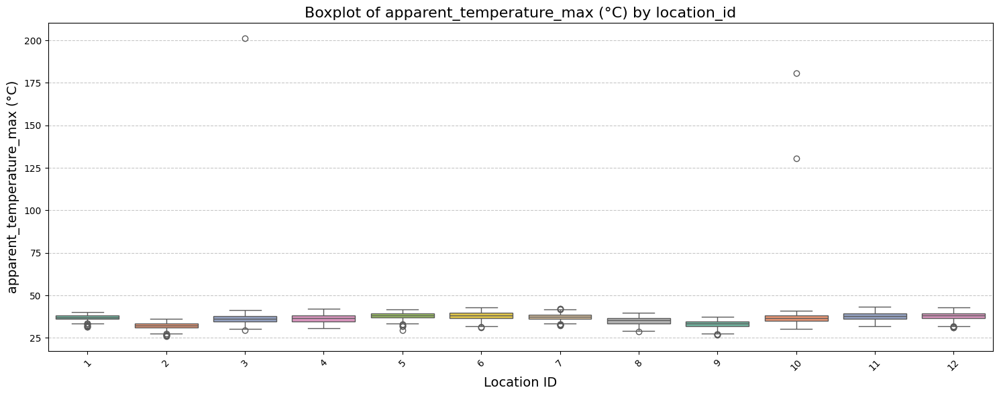

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


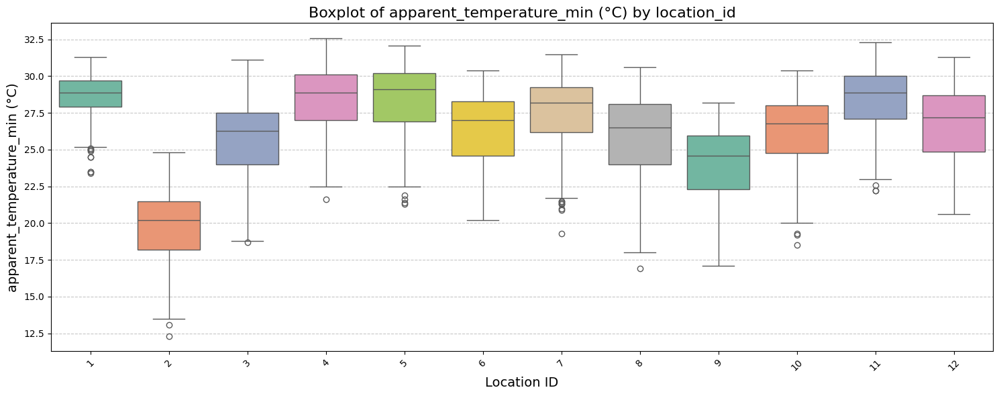

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


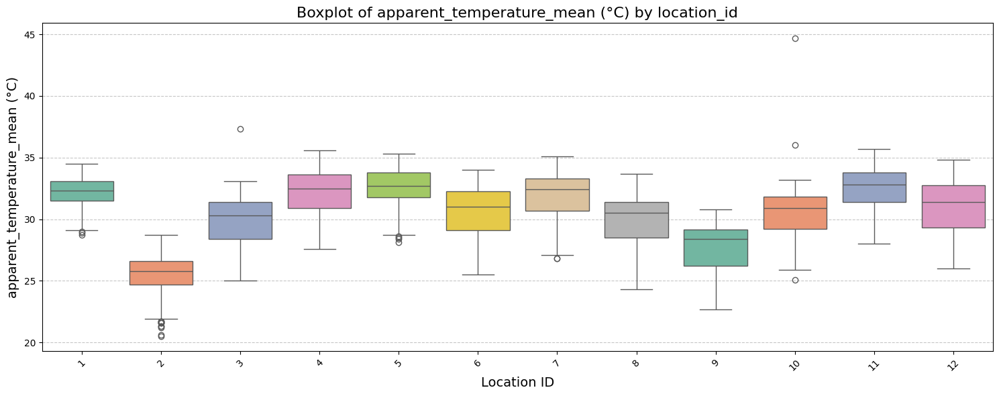

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


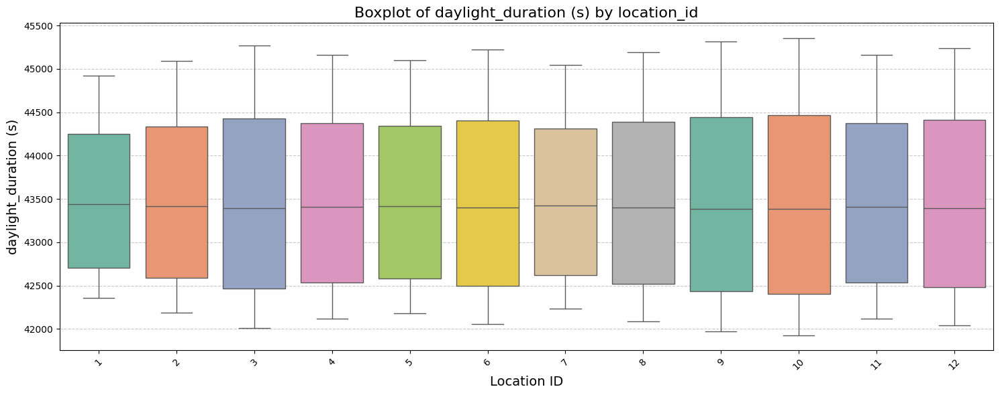

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


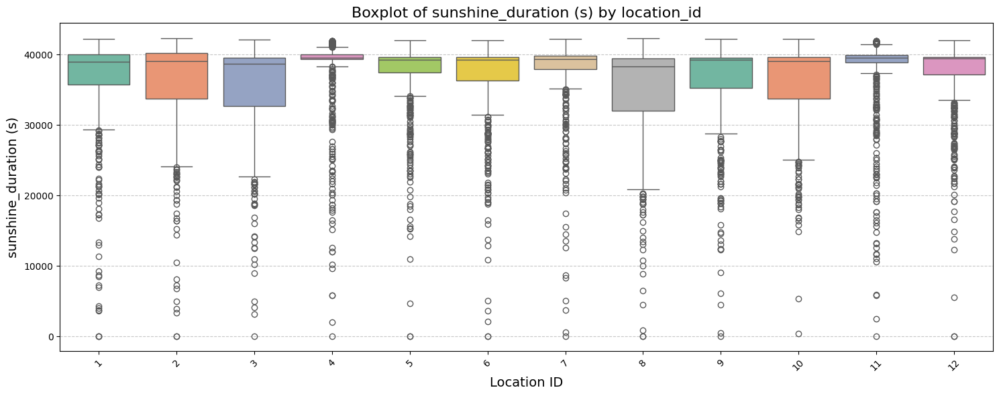

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


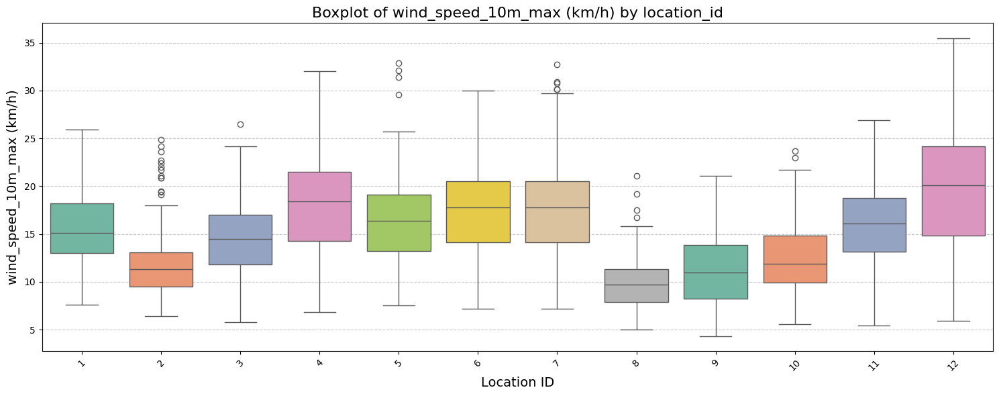

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


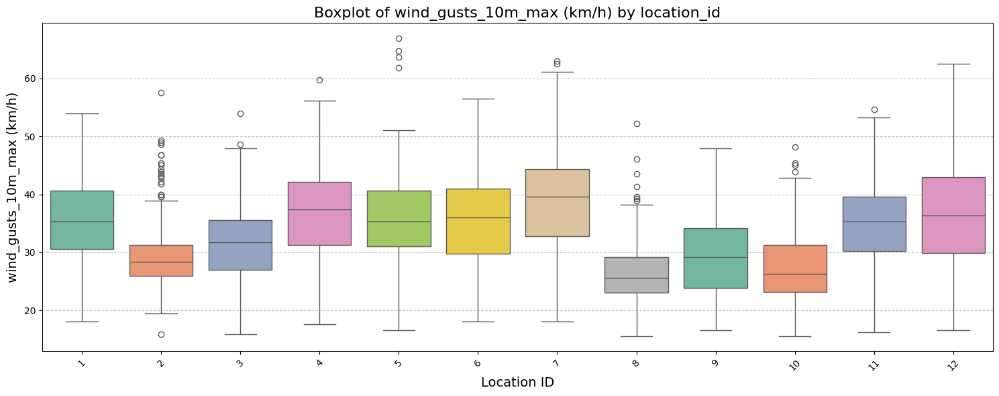

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


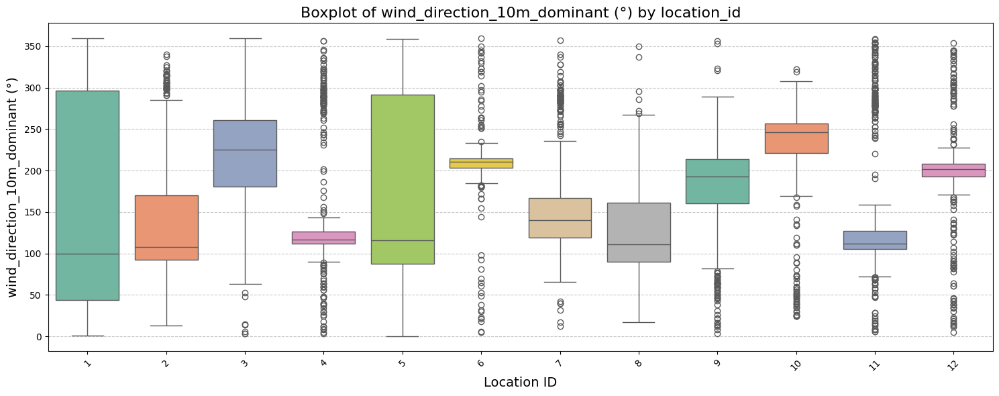

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


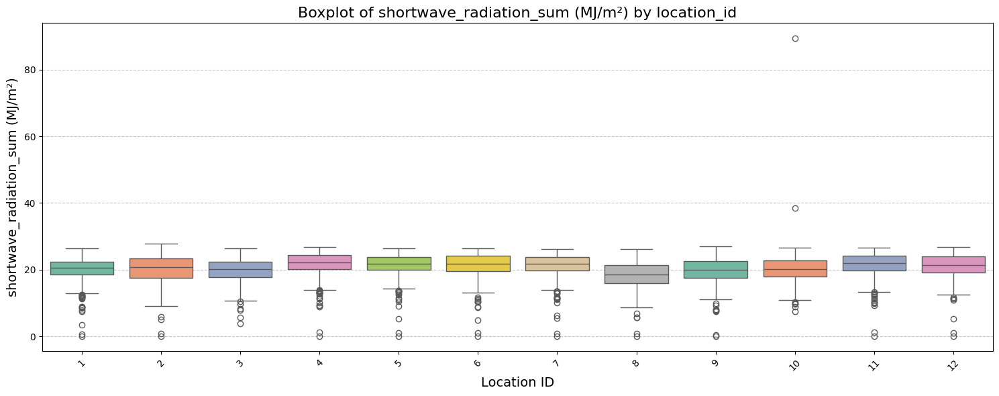

<ipython-input-27-82b6ca76ed8a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


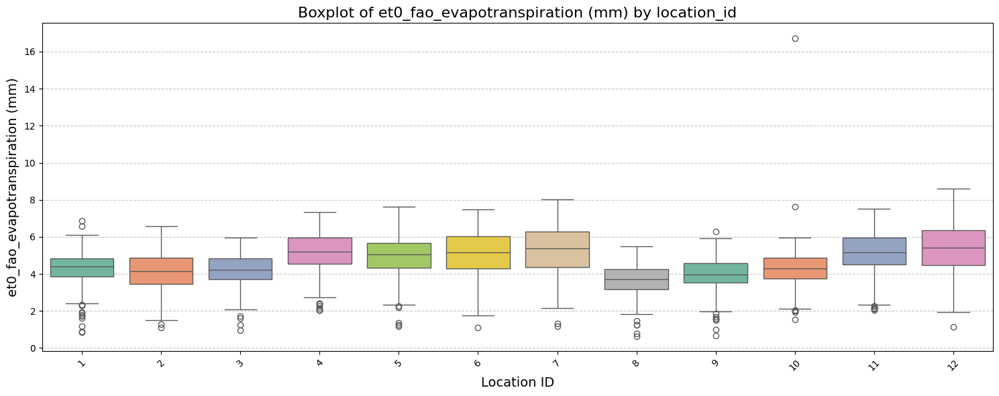

In [ ]:
df = daily_test.copy()

numeric_columns = df.select_dtypes(include=['float64']).columns

locations = df['location_id'].unique()

for col in numeric_columns:
    plt.figure(figsize=(15, 6))
    sns.boxplot(data=df, x='location_id', y=col, palette='Set2')
    plt.title(f"Boxplot of {col} by location_id", fontsize=16)
    plt.xlabel("Location ID", fontsize=14)
    plt.ylabel(col, fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

Temuan menarik:
* terdapat 3 baris apparent_temperature_max > 125 derajat C
* shortwave_radiation_sum > 80
* et0_fao_evapotranspiration (mm) >16

Akan dicek dengan menggunakan informasi data hourly

In [ ]:
# Temukan baris di daily_test dengan apparent_temperature_max > 125
outliers_daily = daily_test[daily_test['apparent_temperature_max (°C)'] > 125].copy()

outliers_daily['date'] = outliers_daily['time'].dt.date

hourly_max_temp = hourly_test.copy()
hourly_max_temp['date'] = hourly_max_temp['time'].dt.date
hourly_max_temp_grouped = hourly_max_temp.groupby(['location_id', 'date'])['apparent_temperature (°C)'].max().reset_index()
hourly_max_temp_grouped.rename(columns={'apparent_temperature (°C)': 'max_hourly_apparent_temp'}, inplace=True)

merged_outliers = outliers_daily.merge(
    hourly_max_temp_grouped,
    how='left',
    left_on=['location_id', 'date'],
    right_on=['location_id', 'date']
)

merged_outliers[['ID', 'location_id', 'date', 'apparent_temperature_max (°C)', 'max_hourly_apparent_temp']]

,ID,location_id,date,apparent_temperature_max (°C),max_hourly_apparent_temp
0,loc3_20241030,3,2024-10-30,201.4,201.4
1,loc10_20241029,10,2024-10-29,130.5,130.5
2,loc10_20241030,10,2024-10-30,180.8,180.8


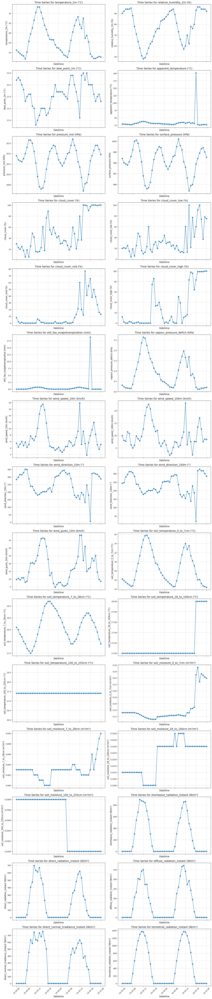

In [ ]:
# 1. Lokasi 3, tanggal 2024-10-30

# Parameter lokasi dan tanggal
location_id = 3
date_of_interest = pd.Timestamp("2024-10-30")
start_date = date_of_interest - pd.Timedelta(days=1)
end_date = date_of_interest + pd.Timedelta(days=1)

filtered_data = hourly_test[
    (hourly_test['location_id'] == location_id) &
    (hourly_test['time'] >= start_date) &
    (hourly_test['time'] <= end_date)
]

numeric_columns = filtered_data.select_dtypes(include='float64').columns

num_cols = len(numeric_columns)
num_rows = (num_cols + 1) // 2
fig, axes = plt.subplots(num_rows, 2, figsize=(16, 5 * num_rows), sharex=True)

axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    axes[i].plot(filtered_data['time'], filtered_data[col], marker='o', linestyle='-', label=col)
    axes[i].set_title(f'Time Series for {col}', fontsize=14)
    axes[i].set_ylabel(col, fontsize=12)
    axes[i].set_xlabel('Datetime', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].grid(True, linestyle='--', alpha=0.7)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
# 2 dan 3, Lokasi 10, tanggal 2024-10-29 dan 2024-10-30

# Parameter lokasi dan tanggal
location_id = 10
date_of_interest = pd.Timestamp("2024-10-29")
start_date = date_of_interest - pd.Timedelta(days=1)
end_date = date_of_interest + pd.Timedelta(days=3)

filtered_data = hourly_test[
    (hourly_test['location_id'] == location_id) &
    (hourly_test['time'] >= start_date) &
    (hourly_test['time'] <= end_date)
]

numeric_columns = filtered_data.select_dtypes(include='float64').columns

num_cols = len(numeric_columns)
num_rows = (num_cols + 1) // 2
fig, axes = plt.subplots(num_rows, 2, figsize=(16, 5 * num_rows), sharex=True)

axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    axes[i].plot(filtered_data['time'], filtered_data[col], marker='o', linestyle='-', label=col)
    axes[i].set_title(f'Time Series for {col}', fontsize=14)
    axes[i].set_ylabel(col, fontsize=12)
    axes[i].set_xlabel('Datetime', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].grid(True, linestyle='--', alpha=0.7)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

Dari visualisasi di atas, didapat bahwa 3 baris apparent_temperature_max > 125 derajat C masuk akal. Setelah melihat komponen cuaca harian di mana apparent_temperature_max > 125 derajat C, data tersebut kemungkinan memang benar terjadi. Outlier ini akan di-keep karena dapat menambah informasi.

* Distribusi setiap kolom

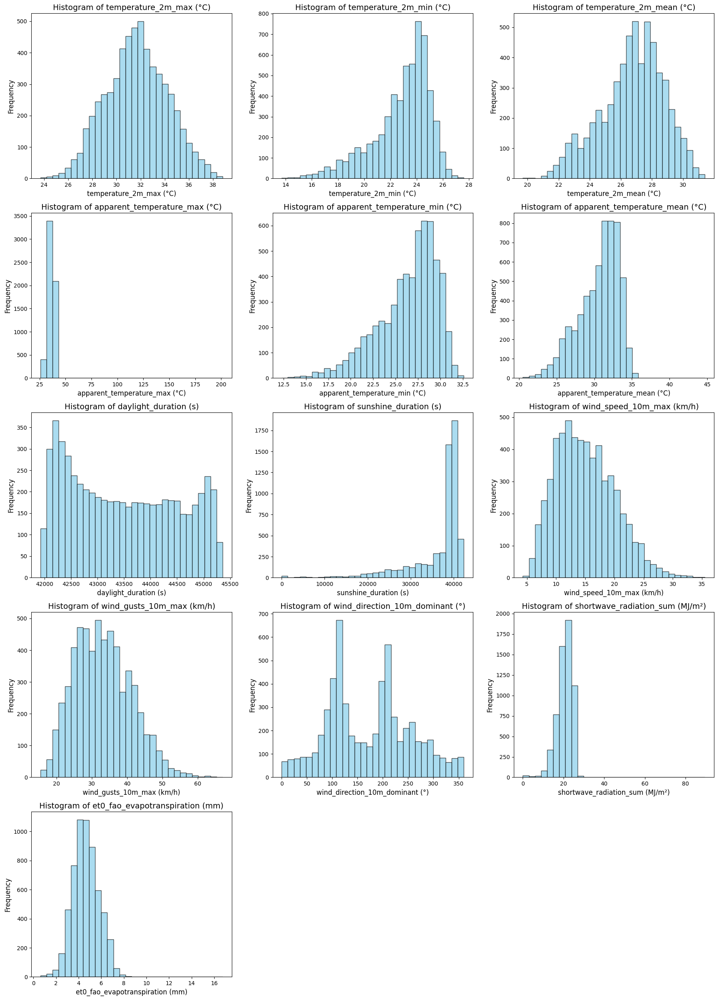

In [ ]:
# Salin DataFrame untuk analisis
df = daily_test.copy()

numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

cols_per_row = 3
num_cols = len(numeric_columns)
num_rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(18, 5 * num_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    ax = axes[i]
    ax.hist(df[col].dropna(), bins=30, color='skyblue', alpha=0.7, edgecolor='black')
    ax.set_title(f"Histogram of {col}", fontsize=14)
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)

for j in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Terdapat beberapa variabel yang cukup skewed yakni:
* apparent_temperature_max (°C)
* sunshine_duration (s)
* shortwave_radiation_sum (MJ/m²)

### hourly_test

In [ ]:
hourly_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141408 entries, 0 to 141407
Data columns (total 32 columns):
 #   Column                                   Non-Null Count   Dtype         
---  ------                                   --------------   -----         
 0   location_id                              141408 non-null  object        
 1   time                                     141408 non-null  datetime64[ns]
 2   temperature_2m (°C)                      141408 non-null  float64       
 3   relative_humidity_2m (%)                 141408 non-null  float64       
 4   dew_point_2m (°C)                        141408 non-null  float64       
 5   apparent_temperature (°C)                141408 non-null  float64       
 6   pressure_msl (hPa)                       141408 non-null  float64       
 7   surface_pressure (hPa)                   141408 non-null  float64       
 8   cloud_cover (%)                          141408 non-null  float64       
 9   cloud_cover_low (%)       

In [ ]:
hourly_test.describe()

,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),et0_fao_evapotranspiration (mm),vapour_pressure_deficit (kPa),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),soil_temperature_0_to_7cm (°C),soil_temperature_7_to_28cm (°C),soil_temperature_28_to_100cm (°C),soil_temperature_100_to_255cm (°C),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³),shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
count,141408,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000,141408.000000
mean,2024-03-02 11:30:00.000000256,26.736298,75.268853,21.492761,30.564277,1011.017280,995.668935,68.845094,15.799693,14.136279,60.419941,0.193579,0.989517,8.020065,11.930232,182.145522,178.471557,18.758739,28.700876,28.654879,28.444104,28.196140,0.233067,0.225090,0.224342,0.278363,239.236846,175.680741,63.453328,250.089205,412.160242
min,2023-07-01 00:00:00,13.700000,18.000000,3.900000,12.300000,1003.600000,928.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.100000,17.100000,20.500000,22.300000,22.700000,0.010000,0.000000,0.011000,0.135000,0.000000,0.000000,-30947.200000,0.000000,0.000000
25%,2023-10-31 17:45:00,24.300000,65.000000,19.900000,28.100000,1009.600000,998.700000,36.000000,1.000000,0.000000,11.000000,0.000000,0.330000,4.100000,6.100000,112.000000,109.000000,10.100000,25.800000,26.800000,26.800000,26.700000,0.124000,0.137000,0.130000,0.197000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2024-03-02 11:30:00,26.300000,79.000000,22.000000,30.700000,1011.000000,1003.400000,89.000000,6.000000,5.000000,82.000000,0.060000,0.720000,6.500000,10.100000,187.000000,184.000000,16.900000,28.100000,28.800000,28.800000,28.700000,0.241000,0.224000,0.220000,0.284000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2024-07-03 05:15:00,29.200000,89.000000,23.500000,33.300000,1012.500000,1009.200000,100.000000,19.000000,18.000000,100.000000,0.370000,1.370000,11.100000,16.400000,246.000000,241.000000,25.900000,31.200000,30.600000,30.300000,29.900000,0.333000,0.314000,0.307000,0.349000,494.100000,325.525000,117.800000,542.400000,899.900000
max,2024-11-02 23:00:00,38.800000,100.000000,27.100000,201.400000,1019.100000,1016.200000,100.000000,100.000000,100.000000,100.000000,18.820000,5.670000,35.500000,50.800000,360.000000,360.000000,67.000000,43.900000,36.200000,33.700000,31.700000,0.520000,0.520000,0.516000,0.458000,50838.400000,30947.200000,50794.100000,64379.400000,1397.000000
std,NaN,3.618797,16.555214,2.607763,4.191615,2.046538,22.822709,36.021262,24.047353,21.742731,41.453258,0.253847,0.863188,5.161231,7.593405,86.735284,84.586776,10.371804,4.224373,2.671294,2.362760,2.161322,0.124423,0.120796,0.106782,0.082457,347.714643,320.049243,251.381190,465.004266,501.786475


Data test mulai dari 1 Juli 2024 hingga 2 November 2024

* Boxplot

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


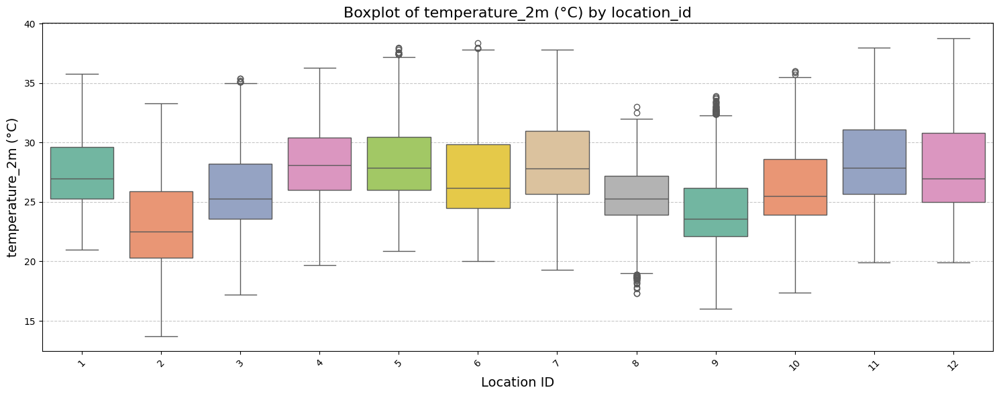

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


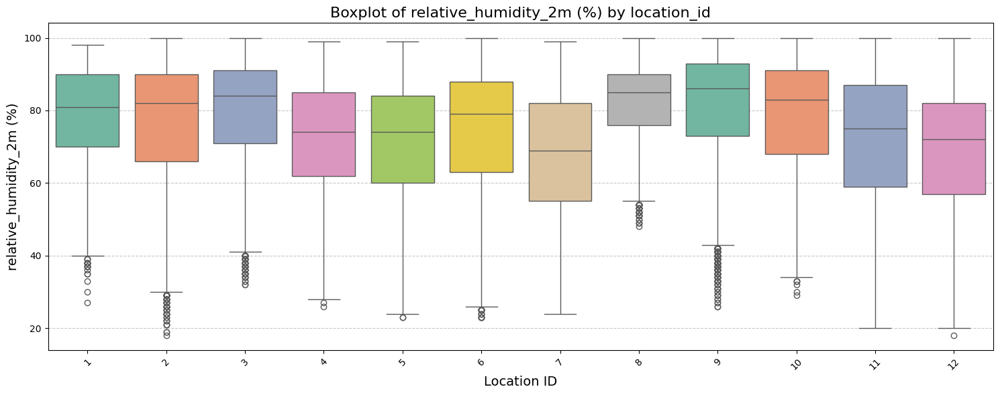

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


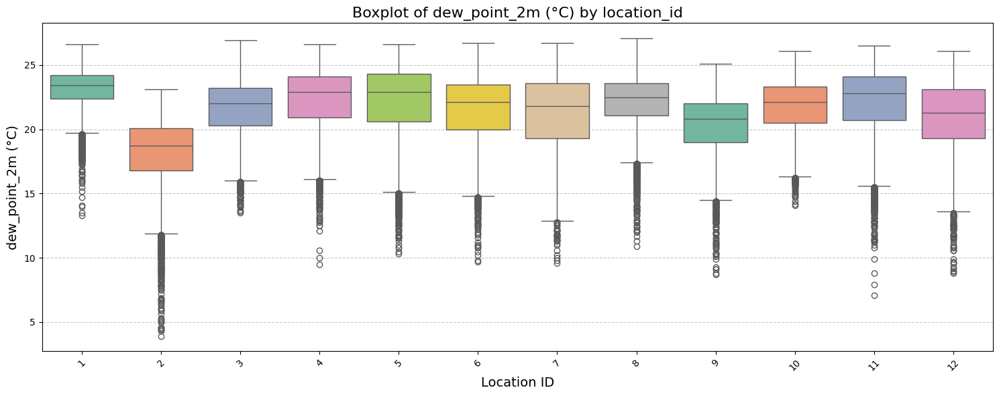

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


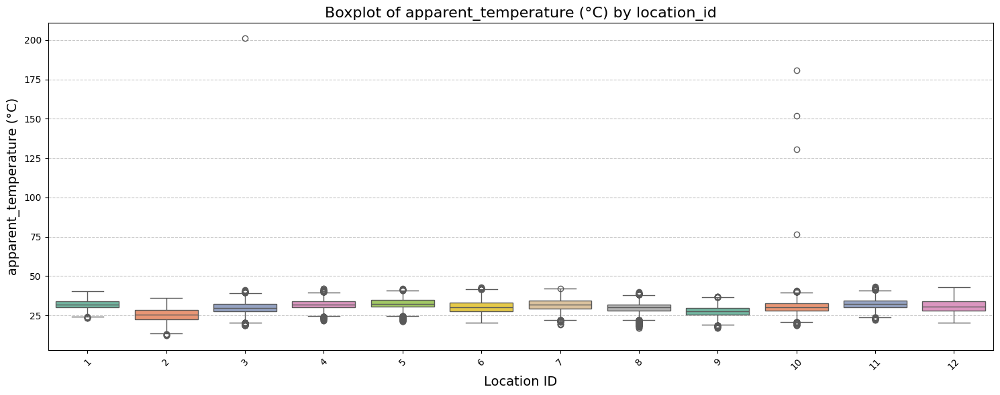

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


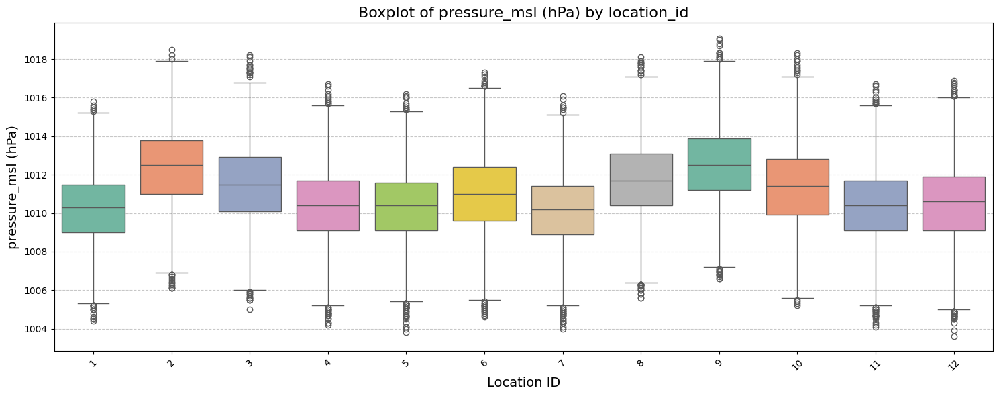

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


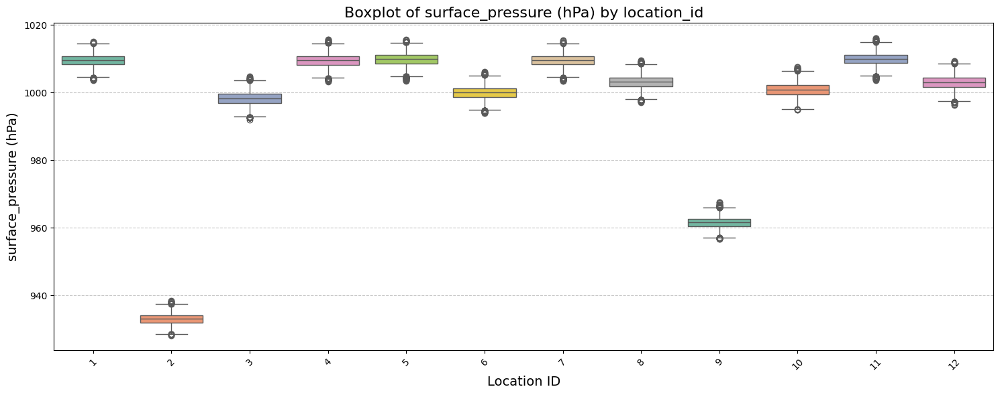

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


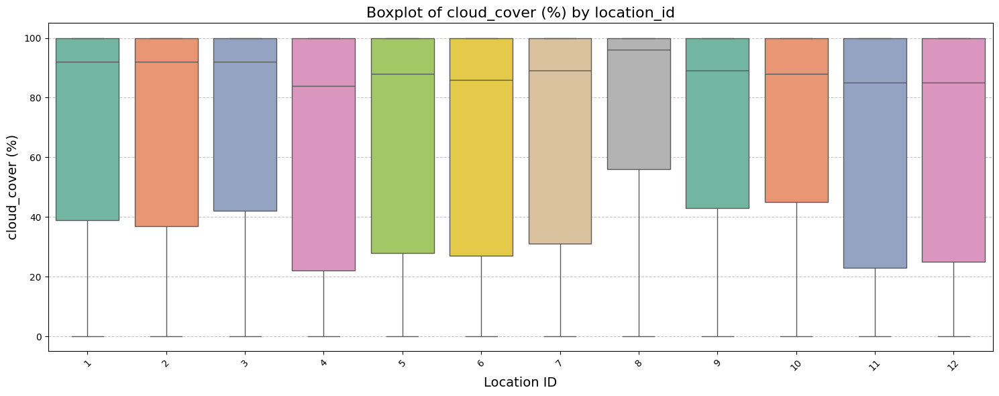

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


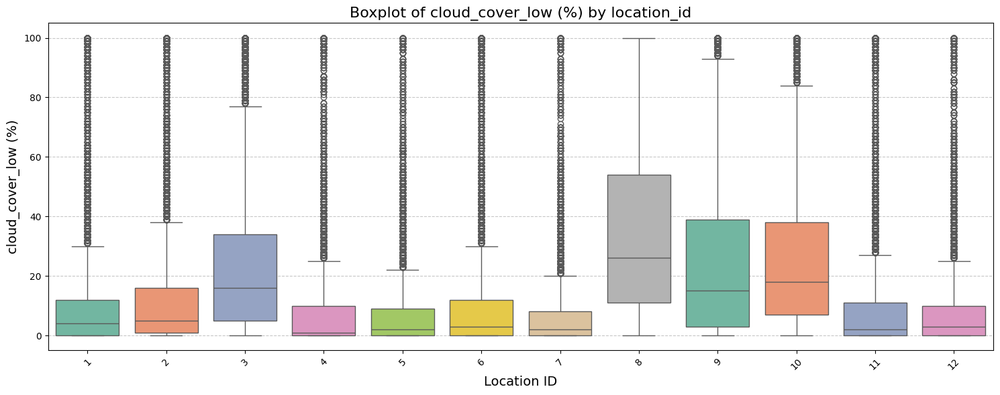

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


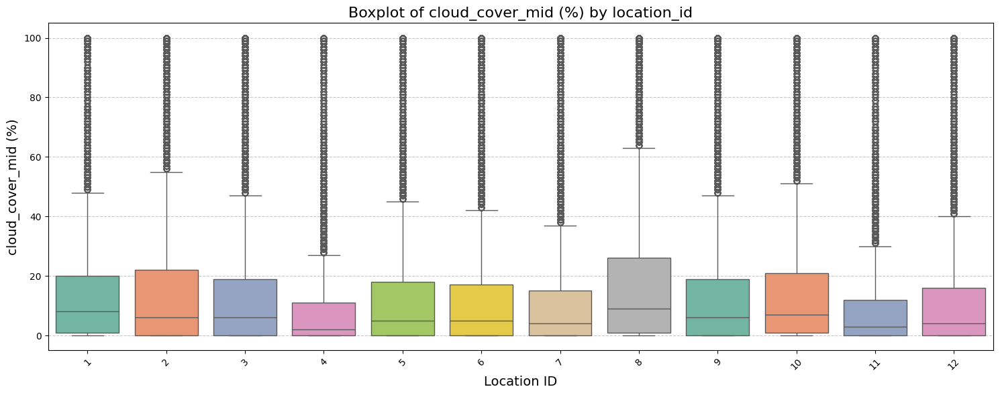

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


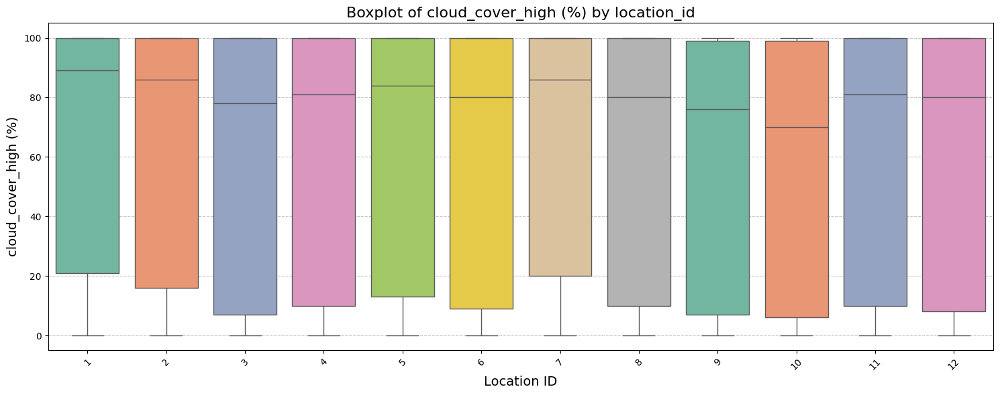

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


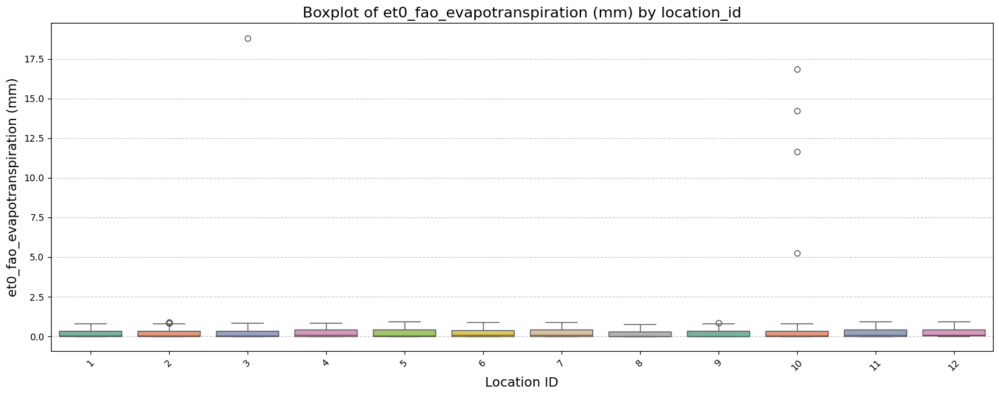

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


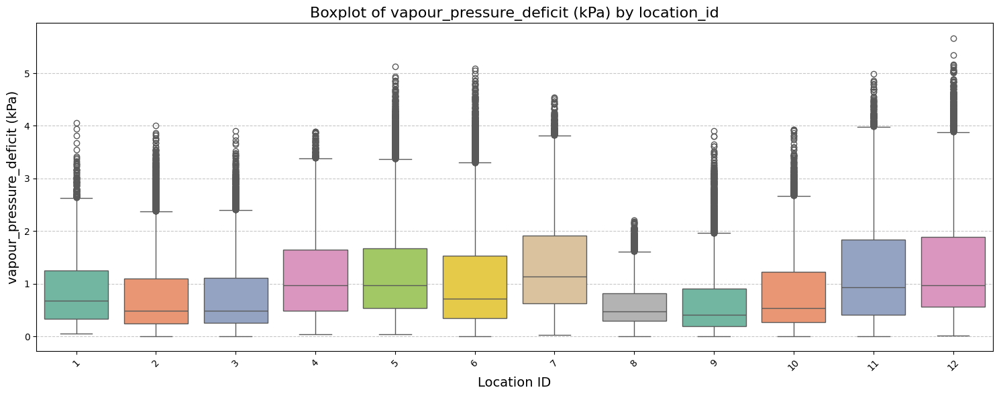

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


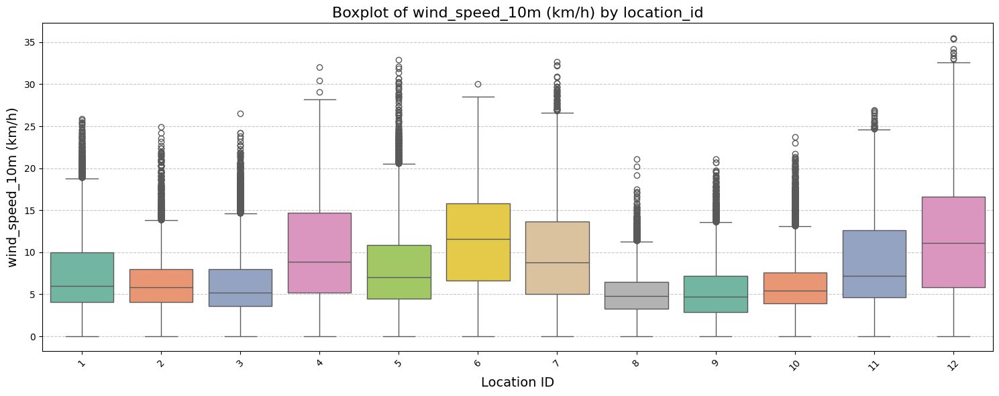

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


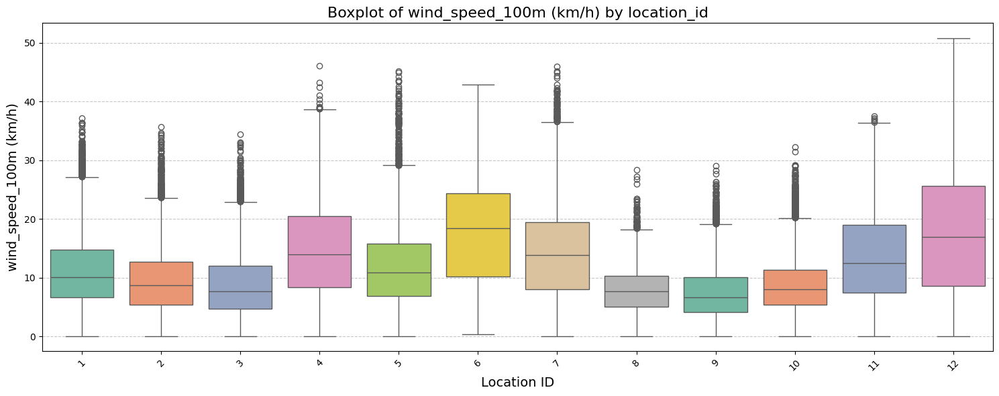

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


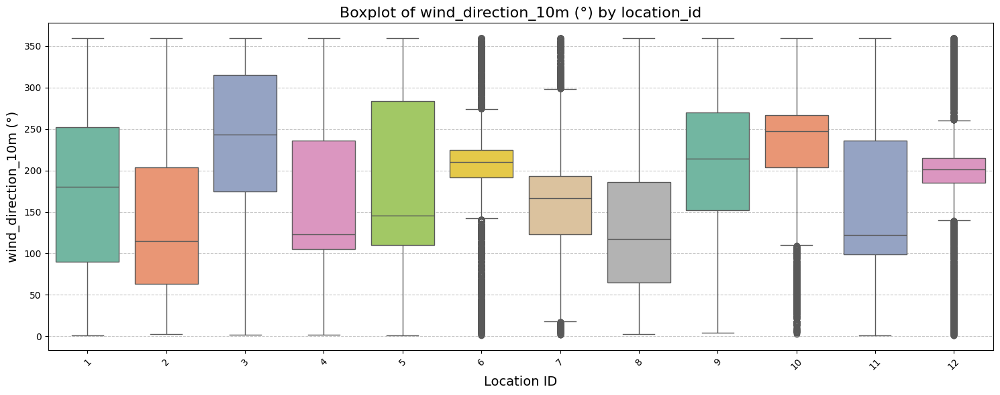

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


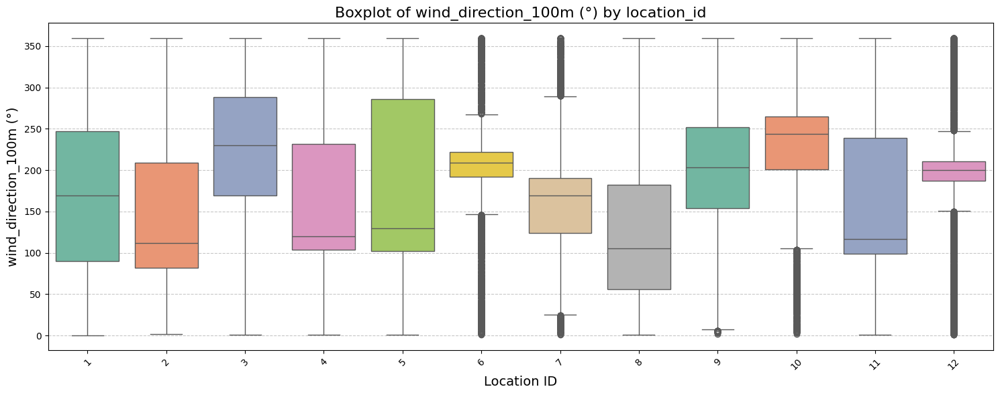

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


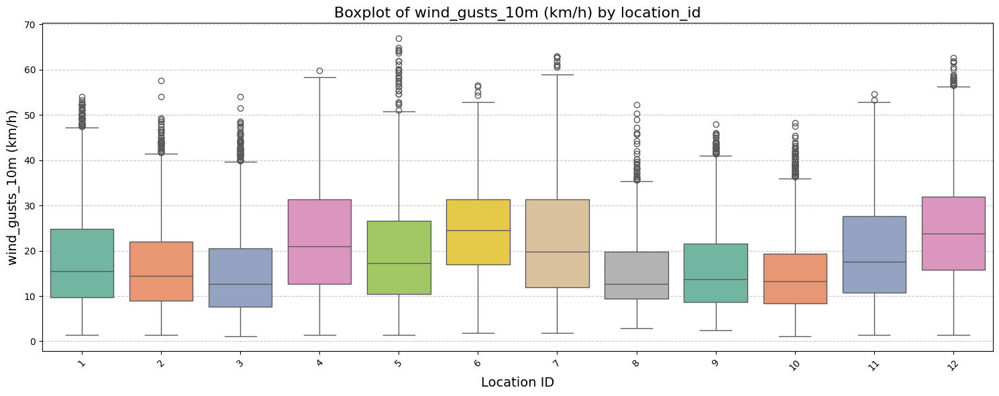

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


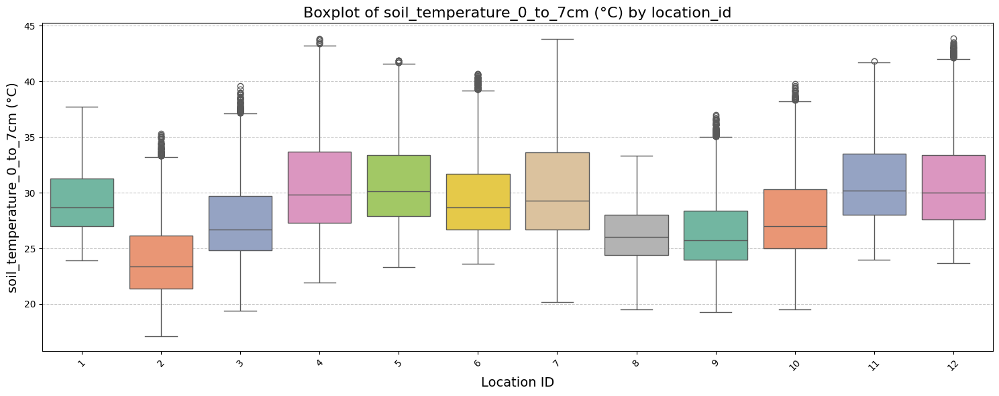

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


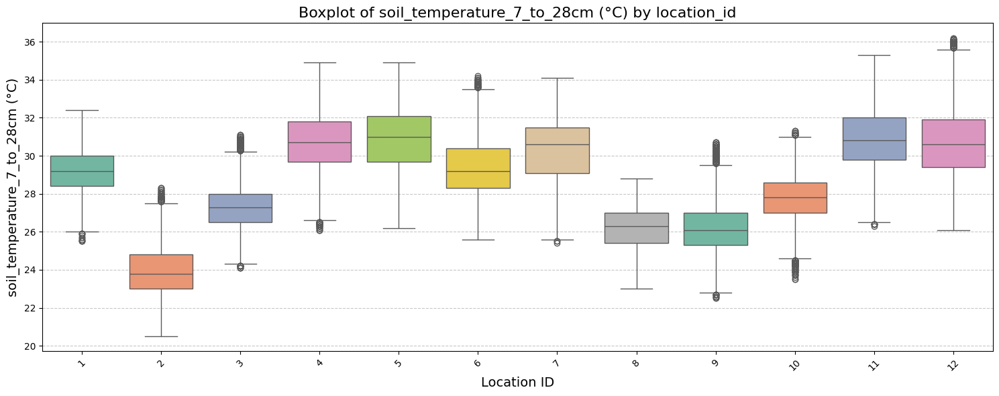

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


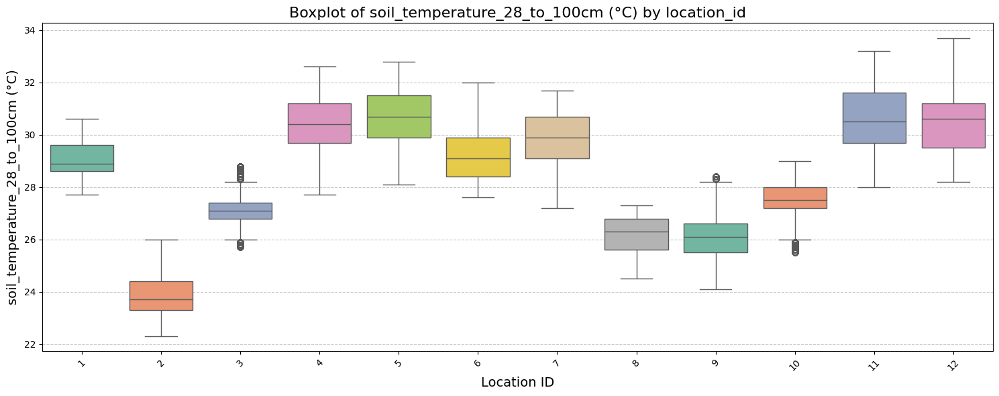

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


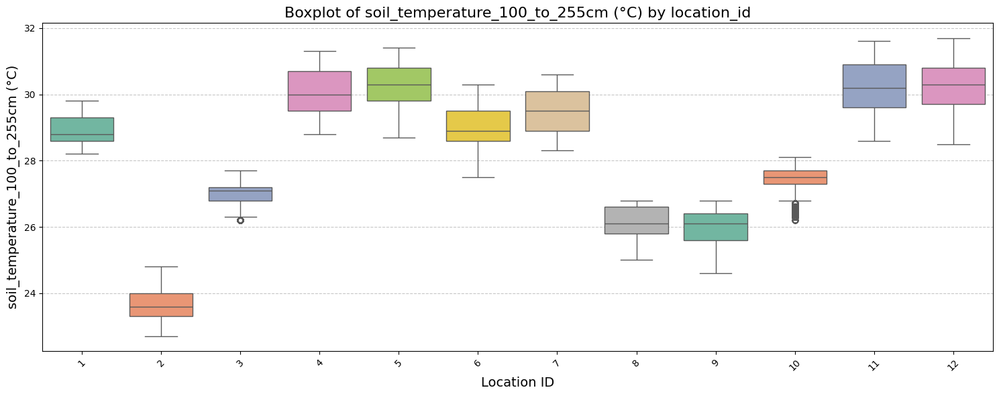

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


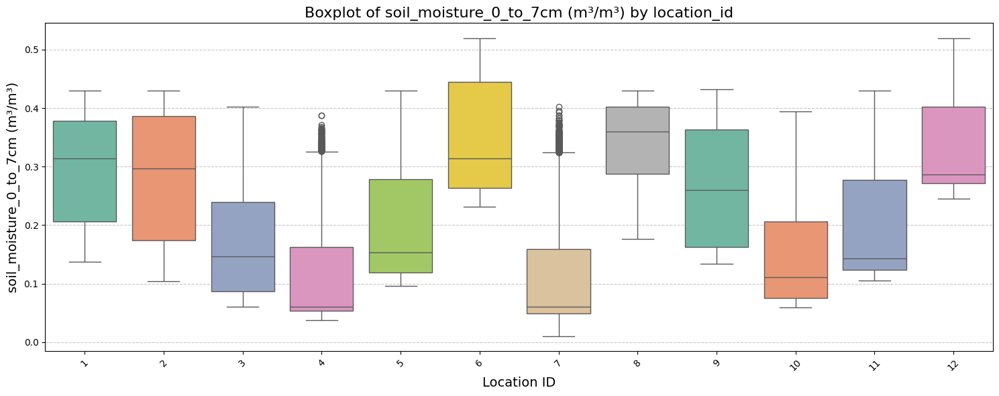

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


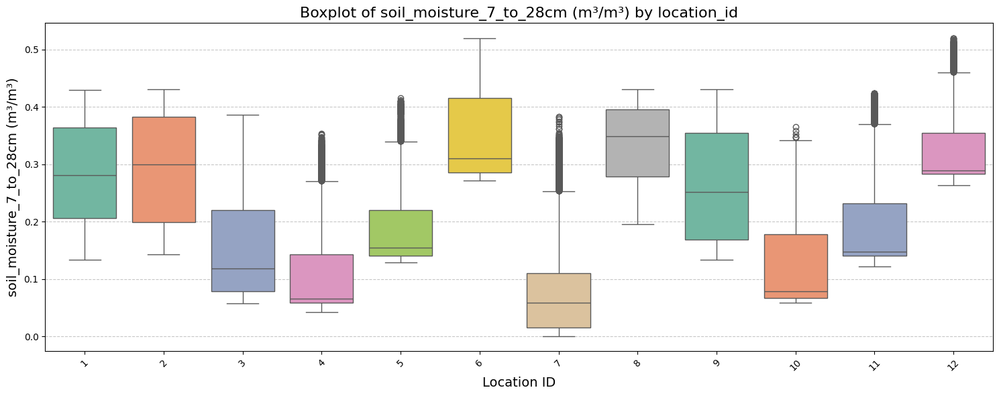

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


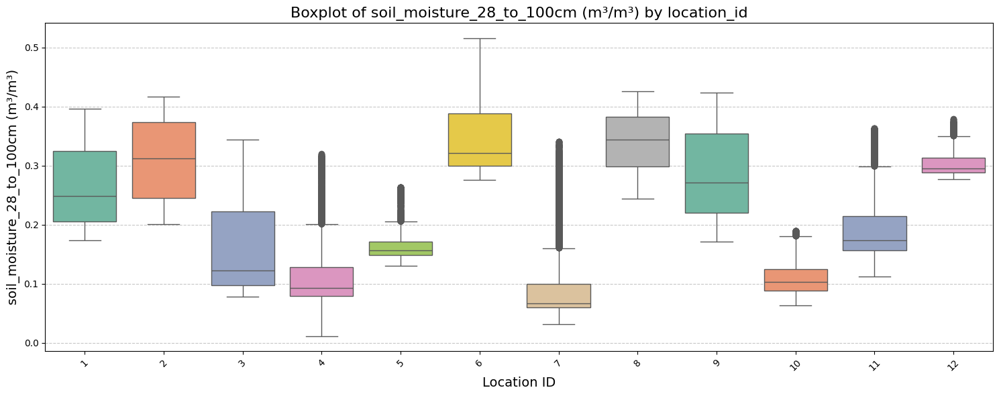

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


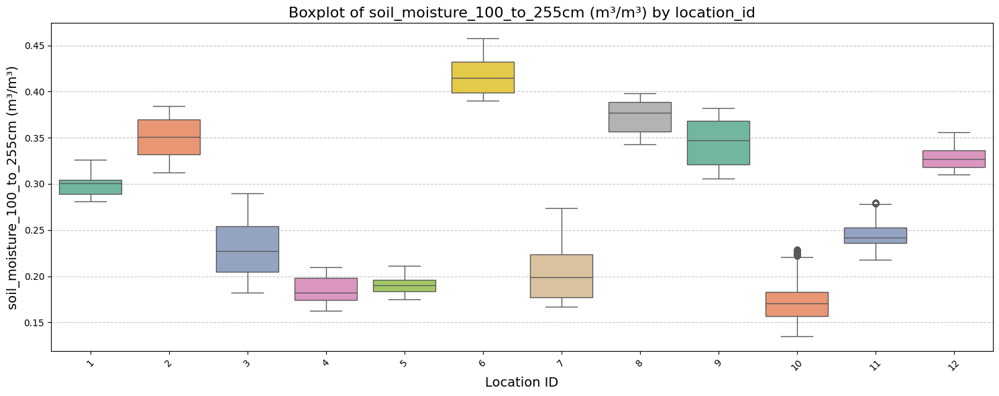

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


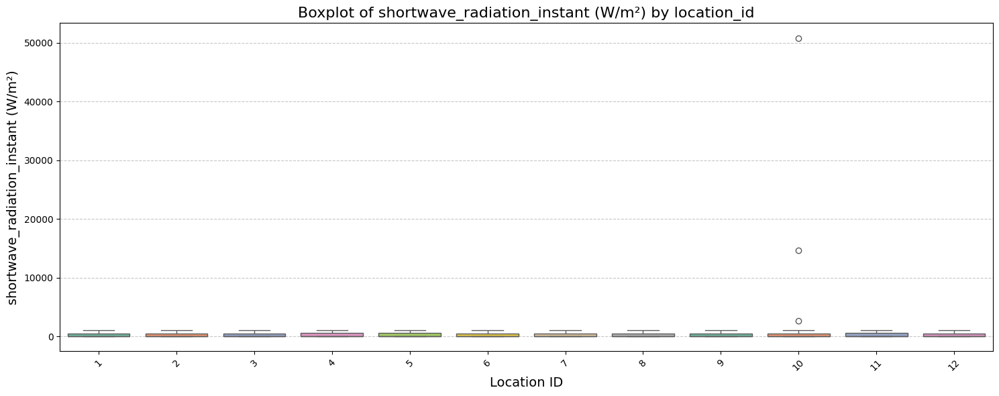

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


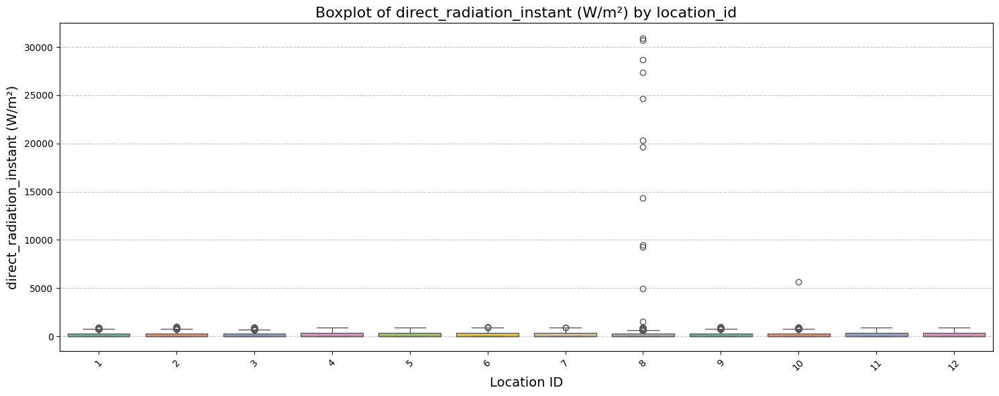

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


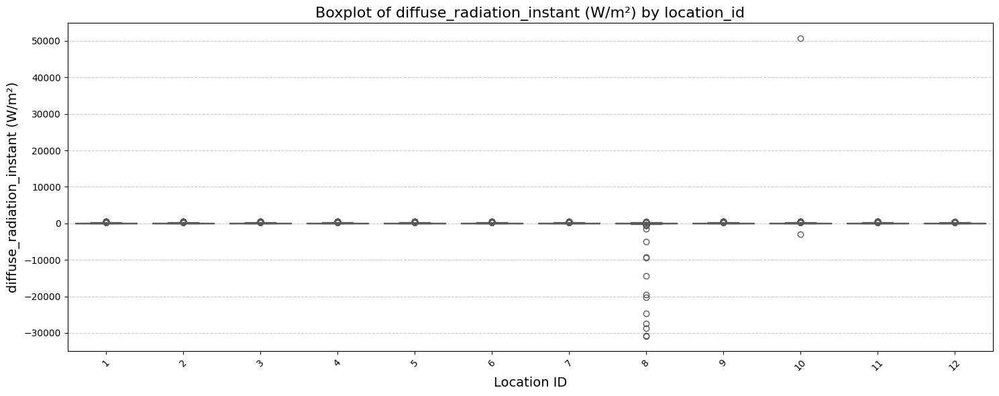

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


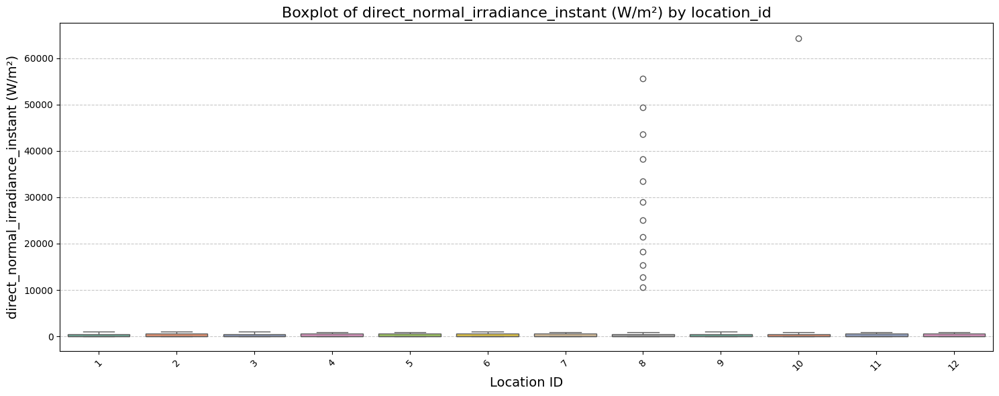

<ipython-input-34-07756adeaff1>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


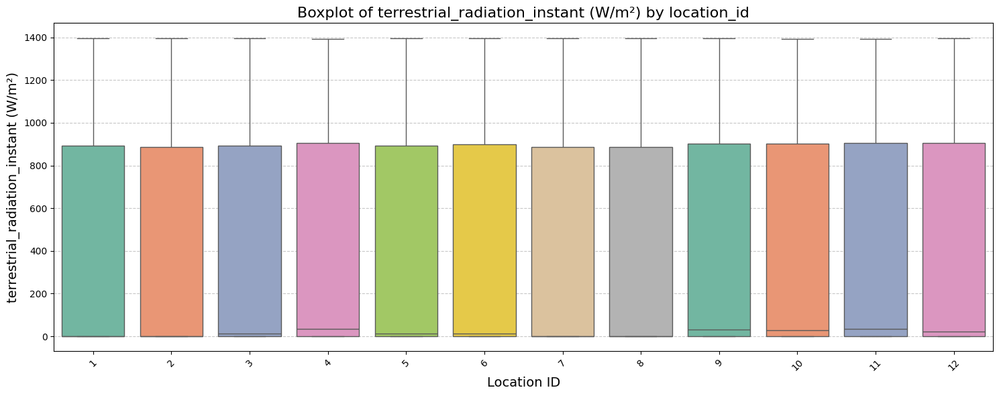

In [ ]:
df = hourly_test.copy()

numeric_columns = df.select_dtypes(include=['float64']).columns

locations = df['location_id'].unique()

for col in numeric_columns:
    plt.figure(figsize=(15, 6))
    sns.boxplot(data=df, x='location_id', y=col, palette='Set2')
    plt.title(f"Boxplot of {col} by location_id", fontsize=16)
    plt.xlabel("Location ID", fontsize=14)
    plt.ylabel(col, fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

Terdapat outlier yang menarik:
* apparent_temperature (°C) > 75
* et0_fao_evapotranspiration (mm) > 5
* shortwave_radiation_instant (W/m²) > 10000

* Distribusi setiap kolom

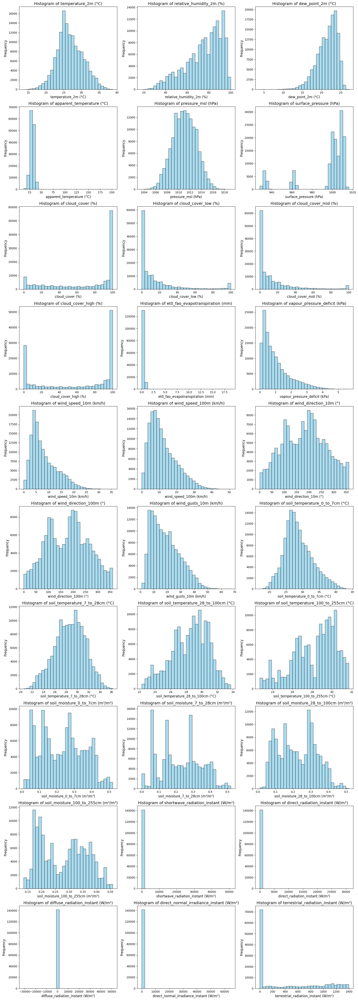

In [ ]:
df = hourly_test.copy()

numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

cols_per_row = 3
num_cols = len(numeric_columns)
num_rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(18, 5 * num_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    ax = axes[i]
    ax.hist(df[col].dropna(), bins=30, color='skyblue', alpha=0.7, edgecolor='black')
    ax.set_title(f"Histogram of {col}", fontsize=14)
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)

for j in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Terdapat beberapa variabel yang cukup skewed pada hourly_test, yakni:
* apparent_temperature (°C)
* cloud_cover (%)
* cloud_cover_low (%)
* cloud_cover_mid (%)
* cloud_cover_high (%)
* et0_fao_evapotranspiration (mm)
* 'shortwave_radiation_instant',
* 'direct_radiation_instant',
* 'diffuse_radiation_instant',
* 'direct_normal_irradiance_instant',
* 'terrestrial_radiation_instant'

In [ ]:
hourly_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141408 entries, 0 to 141407
Data columns (total 32 columns):
 #   Column                                   Non-Null Count   Dtype         
---  ------                                   --------------   -----         
 0   location_id                              141408 non-null  object        
 1   time                                     141408 non-null  datetime64[ns]
 2   temperature_2m (°C)                      141408 non-null  float64       
 3   relative_humidity_2m (%)                 141408 non-null  float64       
 4   dew_point_2m (°C)                        141408 non-null  float64       
 5   apparent_temperature (°C)                141408 non-null  float64       
 6   pressure_msl (hPa)                       141408 non-null  float64       
 7   surface_pressure (hPa)                   141408 non-null  float64       
 8   cloud_cover (%)                          141408 non-null  float64       
 9   cloud_cover_low (%)       

### daily_train

In [ ]:
daily_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19704 entries, 0 to 19703
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   ID                               19704 non-null  object        
 1   location_id                      19704 non-null  object        
 2   time                             19704 non-null  datetime64[ns]
 3   temperature_2m_max (°C)          19704 non-null  float64       
 4   temperature_2m_min (°C)          19704 non-null  float64       
 5   temperature_2m_mean (°C)         19704 non-null  float64       
 6   apparent_temperature_max (°C)    19704 non-null  float64       
 7   apparent_temperature_min (°C)    19704 non-null  float64       
 8   apparent_temperature_mean (°C)   19704 non-null  float64       
 9   sunrise (iso8601)                19704 non-null  datetime64[ns]
 10  sunset (iso8601)                 19704 non-null  datetime6

In [ ]:
daily_train.describe()

,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
count,19704,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704,19704,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000,19704.000000
mean,2021-03-31 11:59:59.999999744,30.180994,23.028350,26.120676,35.139444,26.752345,30.288474,2021-03-31 17:34:28.434835712,2021-04-01 05:40:47.186358272,43579.269557,33191.281265,6.998518,13.862099,31.932049,182.538063,18.556157,4.007216
min,2019-01-01 00:00:00,21.800000,13.800000,20.700000,23.900000,13.800000,20.600000,2019-01-01 05:10:00,2019-01-01 17:45:00,41924.220000,0.000000,0.000000,4.200000,10.800000,0.000000,2.260000,0.620000
25%,2020-02-15 00:00:00,28.600000,22.200000,25.200000,33.500000,25.500000,29.200000,2020-02-15 05:40:45,2020-02-15 18:01:45,42551.497500,28800.000000,0.400000,10.200000,25.600000,112.000000,16.270000,3.320000
50%,2021-03-31 12:00:00,30.100000,23.400000,26.300000,35.500000,27.400000,30.800000,2021-03-31 17:41:30,2021-04-01 05:43:30,43532.530000,37276.065000,2.900000,13.000000,30.600000,190.000000,19.030000,3.930000
75%,2022-05-16 00:00:00,31.500000,24.300000,27.300000,37.000000,28.700000,32.000000,2022-05-16 05:40:00,2022-05-16 17:26:15,44599.775000,39469.267500,9.600000,16.700000,37.100000,259.000000,21.220000,4.612500
max,2023-06-30 00:00:00,39.900000,27.900000,31.300000,43.100000,33.100000,35.800000,2023-06-30 06:03:00,2023-06-30 17:49:00,45358.290000,42429.950000,343.800000,38.000000,74.500000,360.000000,28.450000,8.560000
std,NaN,2.247493,1.904473,1.739846,2.558647,2.862154,2.325849,NaN,NaN,1061.953764,8766.887690,11.103593,4.837510,8.361036,86.825075,3.871296,1.067831


Data train mulai dari 1 Januari 2019 hingga 30 Juni 2023

* Boxplot

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


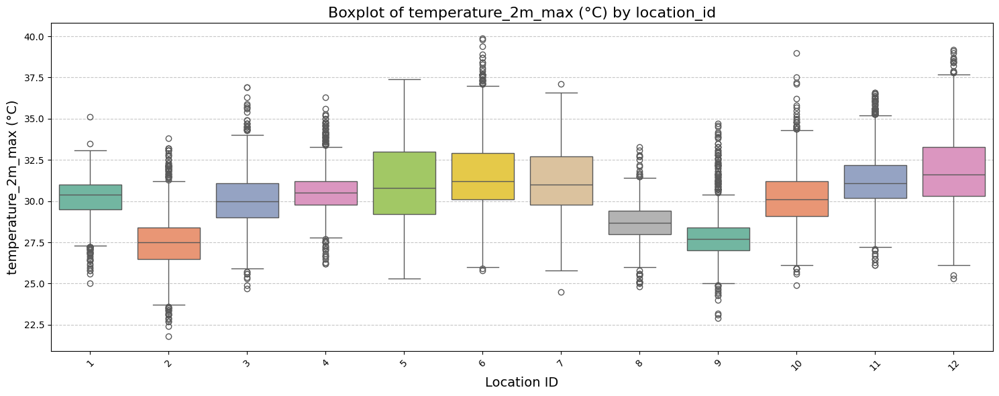

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


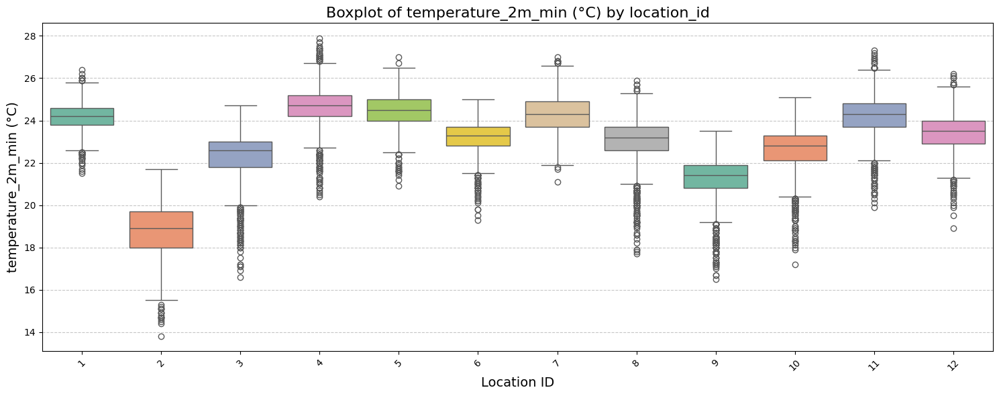

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


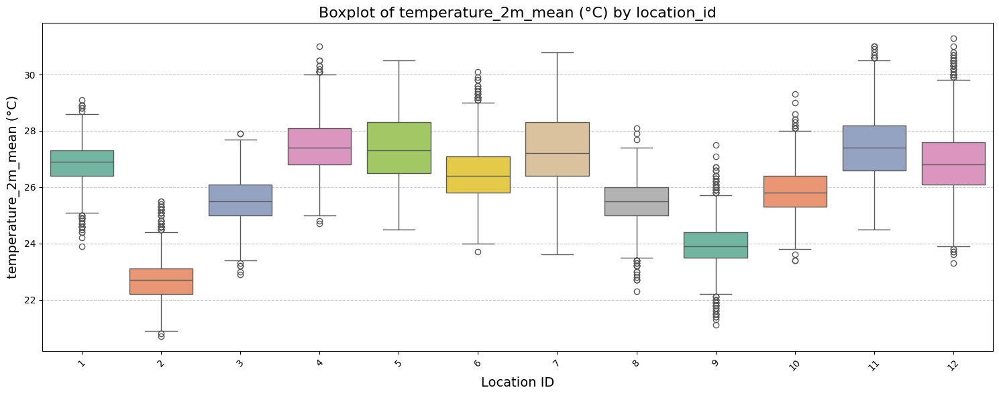

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


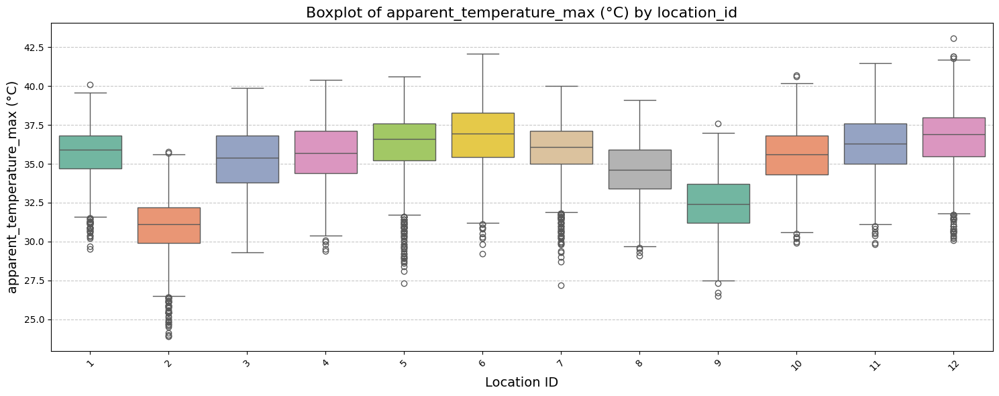

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


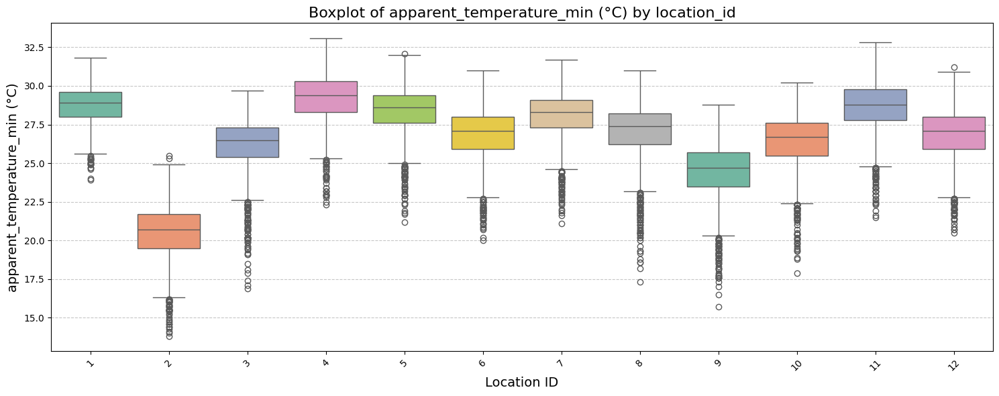

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


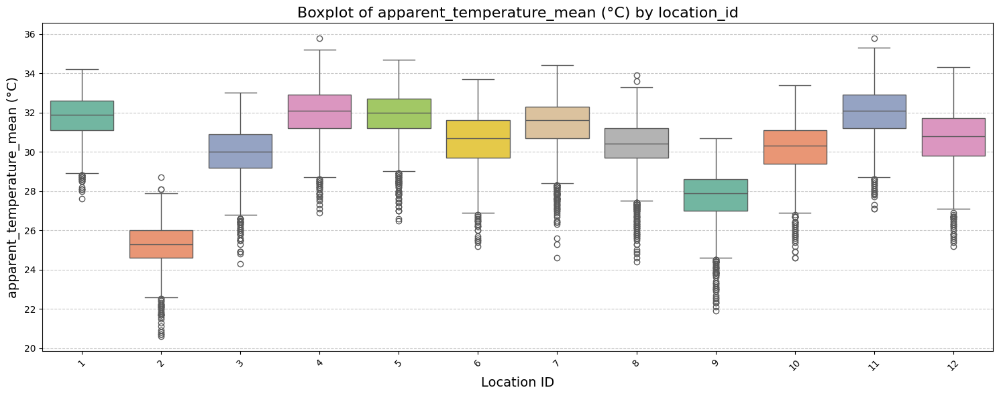

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


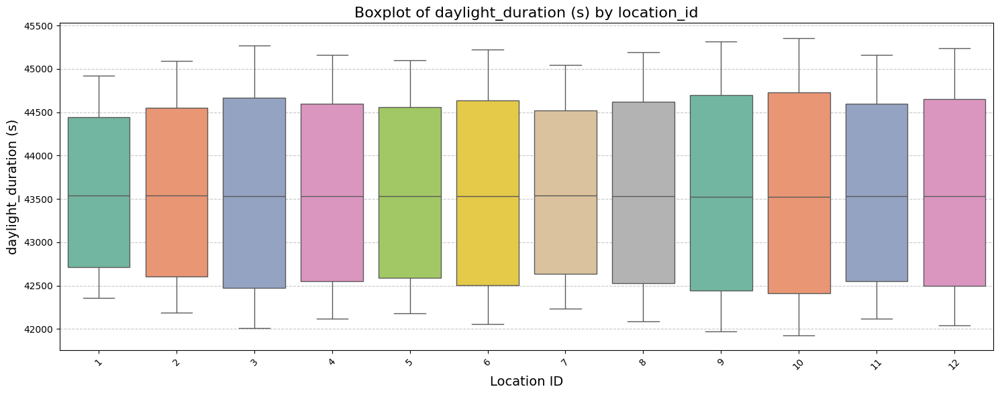

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


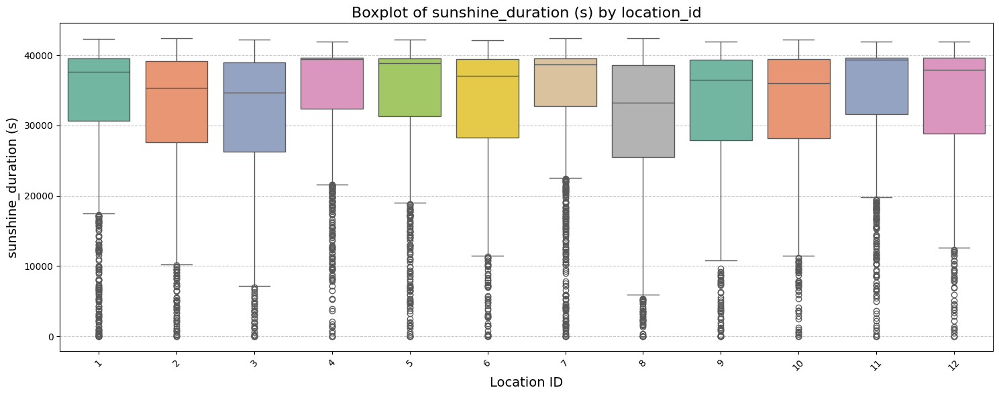

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


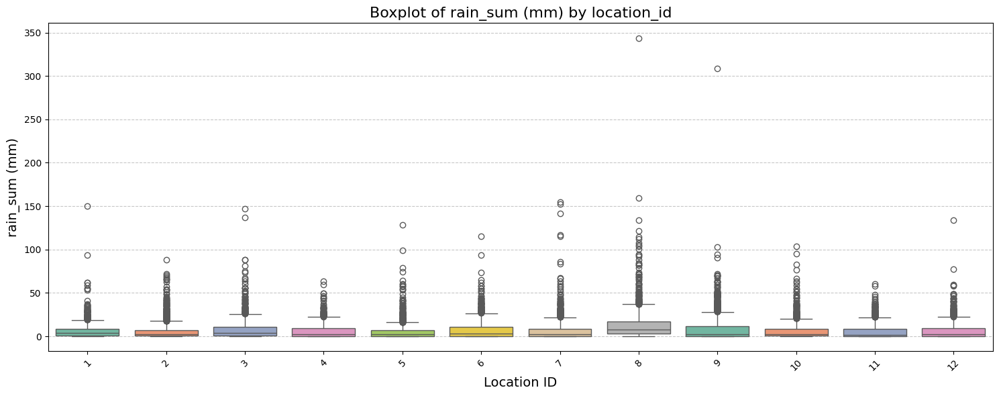

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


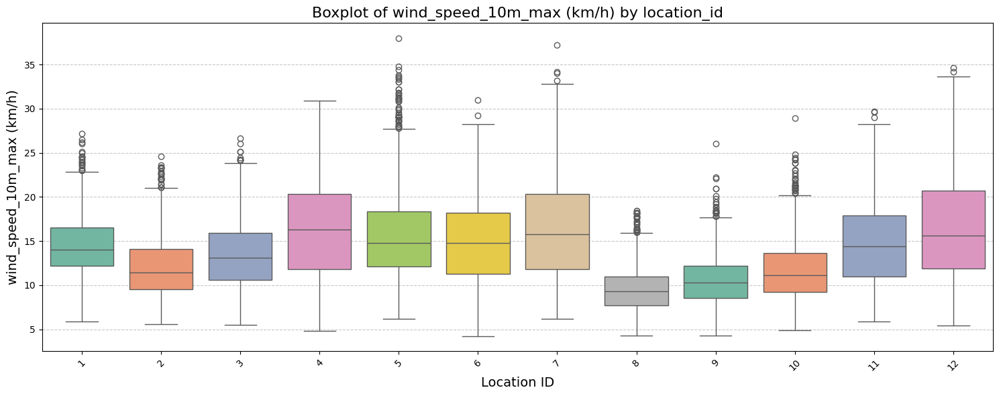

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


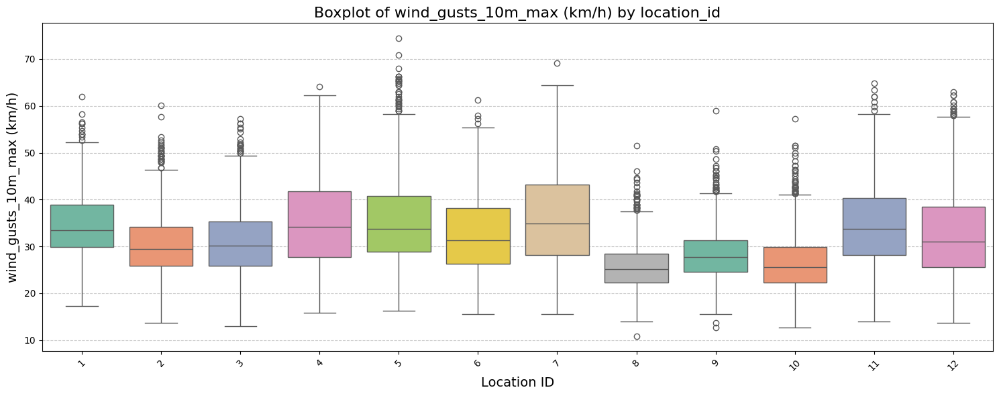

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


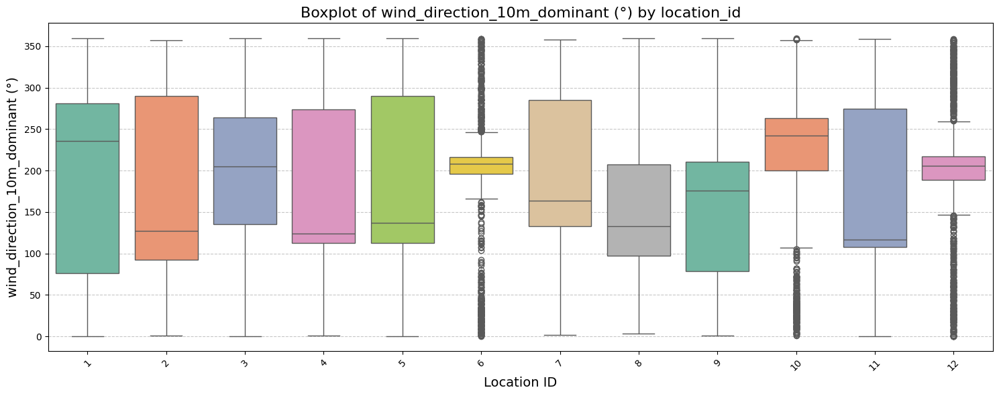

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


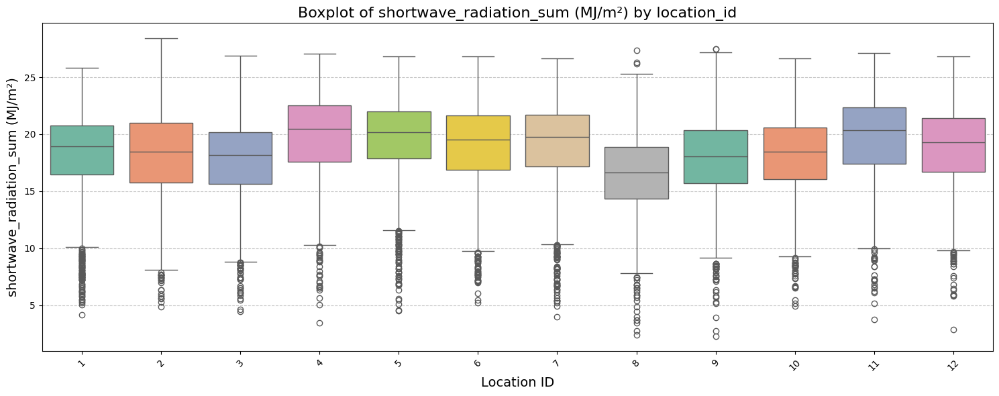

<ipython-input-39-9461aee18fc8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


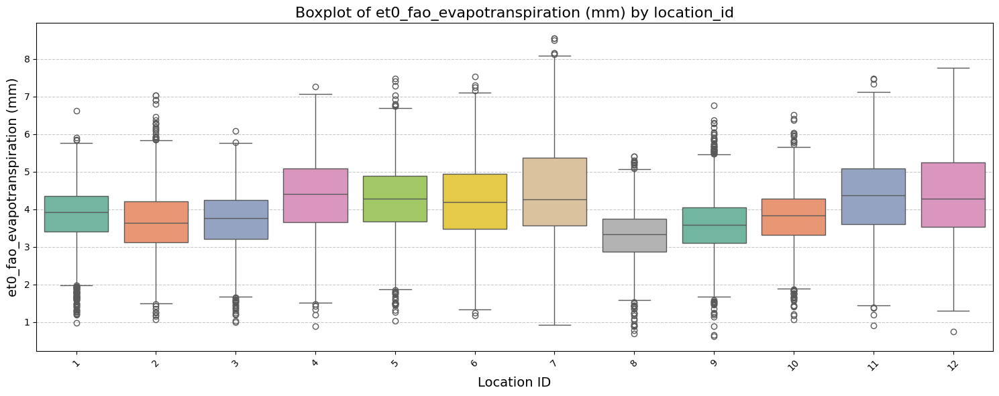

In [ ]:
df = daily_train.copy()

numeric_columns = df.select_dtypes(include=['float64']).columns

locations = df['location_id'].unique()

for col in numeric_columns:
    plt.figure(figsize=(15, 6))
    sns.boxplot(data=df, x='location_id', y=col, palette='Set2')
    plt.title(f"Boxplot of {col} by location_id", fontsize=16)
    plt.xlabel("Location ID", fontsize=14)
    plt.ylabel(col, fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

* Distribusi setiap kolom

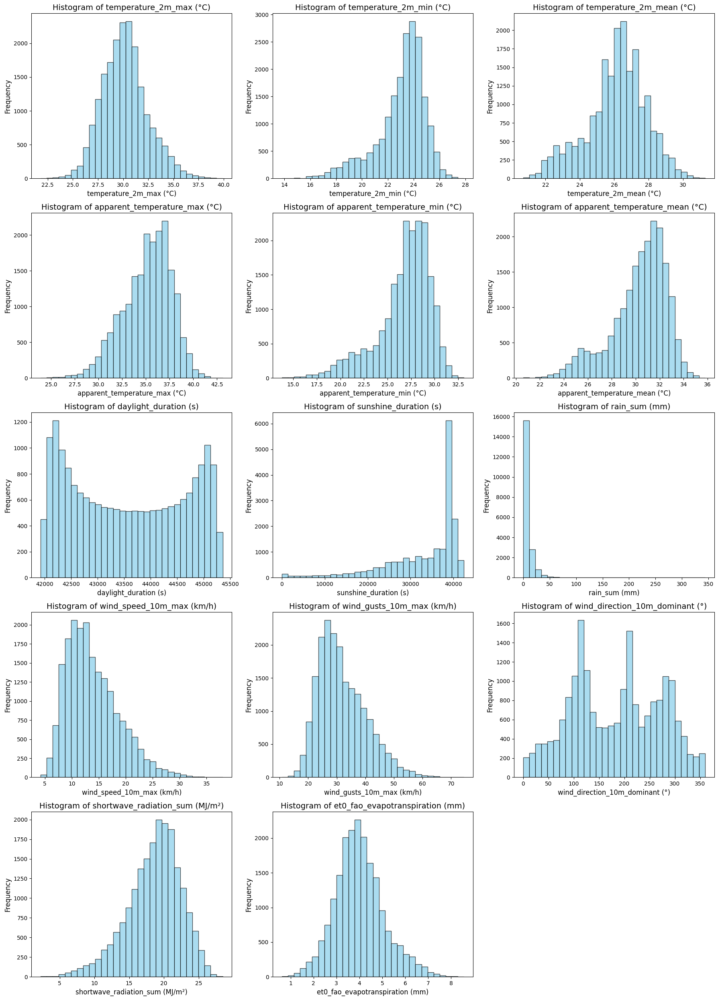

In [ ]:
df = daily_train.copy()

numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

cols_per_row = 3
num_cols = len(numeric_columns)
num_rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(18, 5 * num_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    ax = axes[i]
    ax.hist(df[col].dropna(), bins=30, color='skyblue', alpha=0.7, edgecolor='black')
    ax.set_title(f"Histogram of {col}", fontsize=14)
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)

for j in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### hourly_train

In [ ]:
hourly_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 472896 entries, 0 to 472895
Data columns (total 32 columns):
 #   Column                                   Non-Null Count   Dtype         
---  ------                                   --------------   -----         
 0   location_id                              472896 non-null  object        
 1   time                                     472896 non-null  datetime64[ns]
 2   temperature_2m (°C)                      472896 non-null  float64       
 3   relative_humidity_2m (%)                 472896 non-null  float64       
 4   dew_point_2m (°C)                        472896 non-null  float64       
 5   apparent_temperature (°C)                472896 non-null  float64       
 6   pressure_msl (hPa)                       472896 non-null  float64       
 7   surface_pressure (hPa)                   472896 non-null  float64       
 8   cloud_cover (%)                          472896 non-null  float64       
 9   cloud_cover_low (%)       

In [ ]:
hourly_train.describe()

,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),et0_fao_evapotranspiration (mm),vapour_pressure_deficit (kPa),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),soil_temperature_0_to_7cm (°C),soil_temperature_7_to_28cm (°C),soil_temperature_28_to_100cm (°C),soil_temperature_100_to_255cm (°C),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³),shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
count,472896,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.00000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000
mean,2021-03-31 23:30:00.000001536,26.125369,80.197050,22.120930,30.288149,1010.239667,994.886063,76.288474,18.701072,23.328210,69.191165,0.166938,0.748719,7.466341,11.306078,187.29192,183.756968,18.136865,27.594788,27.510791,27.417522,27.431949,0.296058,0.283255,0.274918,0.319550,216.370004,145.336219,71.033739,204.303172,414.543402
min,2019-01-01 00:00:00,13.800000,12.000000,-3.000000,13.800000,1002.600000,927.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,1.000000,1.100000,16.900000,20.600000,22.000000,22.600000,0.000000,0.000000,0.000000,0.115000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2020-02-15 11:45:00,24.200000,73.000000,20.900000,28.200000,1008.900000,997.700000,58.000000,2.000000,3.000000,39.000000,0.000000,0.260000,3.900000,5.700000,112.00000,109.000000,9.700000,25.300000,26.100000,26.200000,26.200000,0.211000,0.186000,0.188000,0.253000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2021-03-31 23:30:00,25.800000,84.000000,22.700000,30.400000,1010.200000,1002.500000,94.000000,9.000000,13.000000,90.000000,0.040000,0.530000,6.100000,9.700000,192.00000,189.000000,16.600000,27.100000,27.500000,27.600000,27.700000,0.309000,0.298000,0.285000,0.322000,0.000000,0.000000,0.000000,0.000000,7.200000
75%,2022-05-16 11:15:00,28.000000,91.000000,23.700000,32.500000,1011.600000,1008.600000,100.000000,24.000000,32.000000,100.000000,0.310000,1.010000,10.100000,15.500000,262.00000,258.000000,24.500000,29.500000,28.900000,28.600000,28.800000,0.400000,0.393000,0.376000,0.384000,429.800000,240.700000,127.200000,420.800000,909.000000
max,2023-06-30 23:00:00,39.900000,100.000000,27.100000,43.100000,1018.200000,1015.900000,100.000000,100.000000,100.000000,100.000000,0.960000,6.010000,38.000000,56.800000,360.00000,360.000000,74.500000,45.500000,35.800000,33.400000,32.000000,0.520000,0.520000,0.520000,0.520000,1101.900000,1019.000000,493.600000,1021.400000,1397.000000
std,NaN,2.988995,14.045442,2.232395,3.512537,1.951204,22.866247,31.522674,25.067215,27.321911,37.430436,0.215084,0.676704,4.872953,7.325375,91.22342,89.838020,10.217621,3.507689,2.283365,1.995520,1.880864,0.124259,0.129549,0.119791,0.083452,295.071554,228.097132,94.680770,281.490249,504.052914


* Boxplot

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


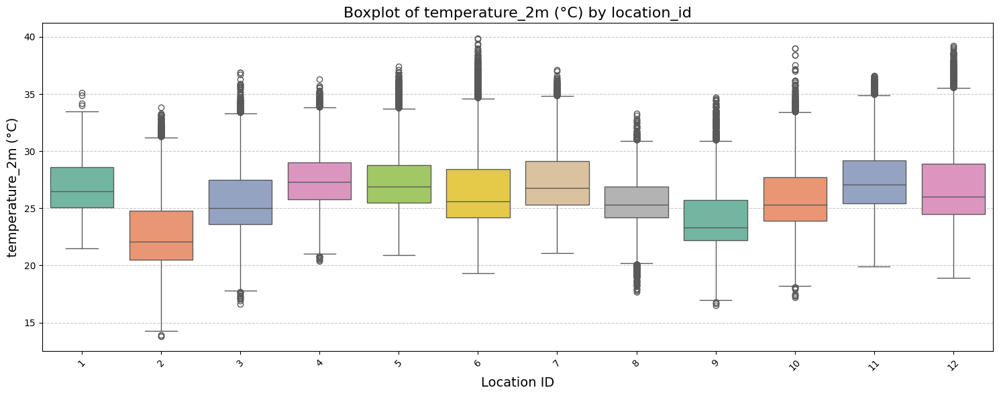

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


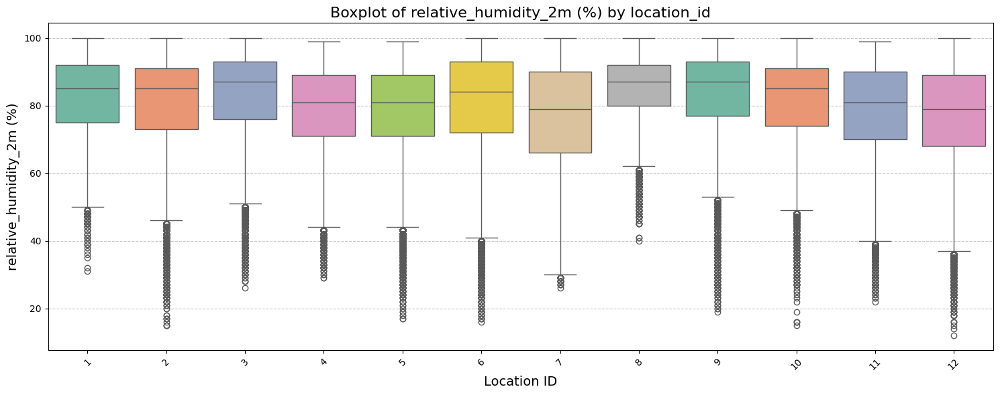

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


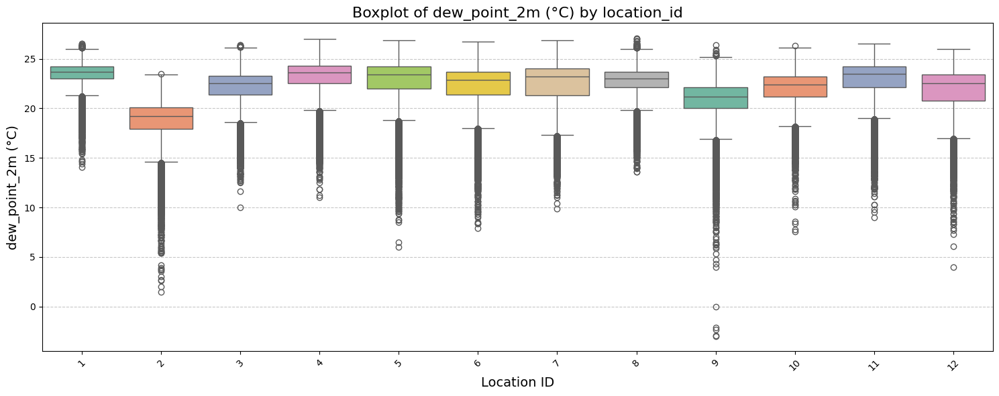

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


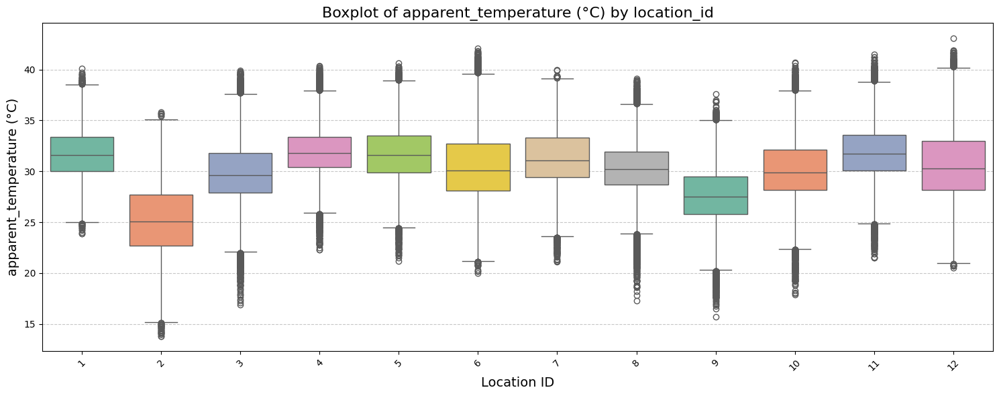

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


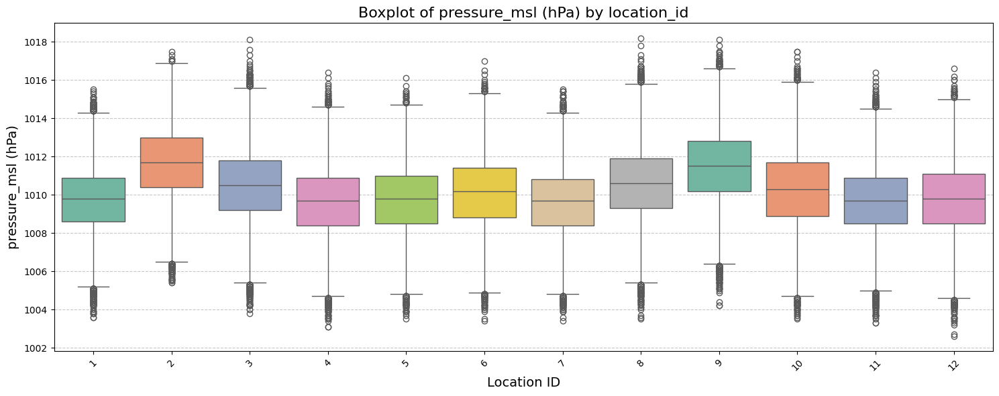

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


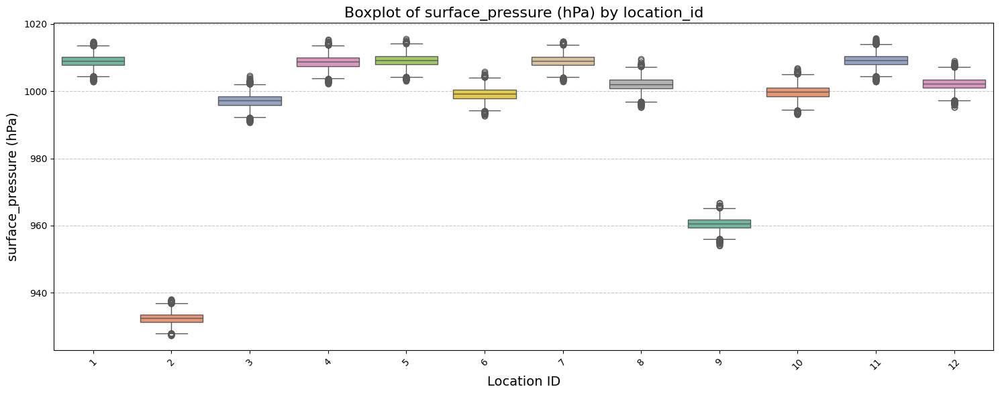

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


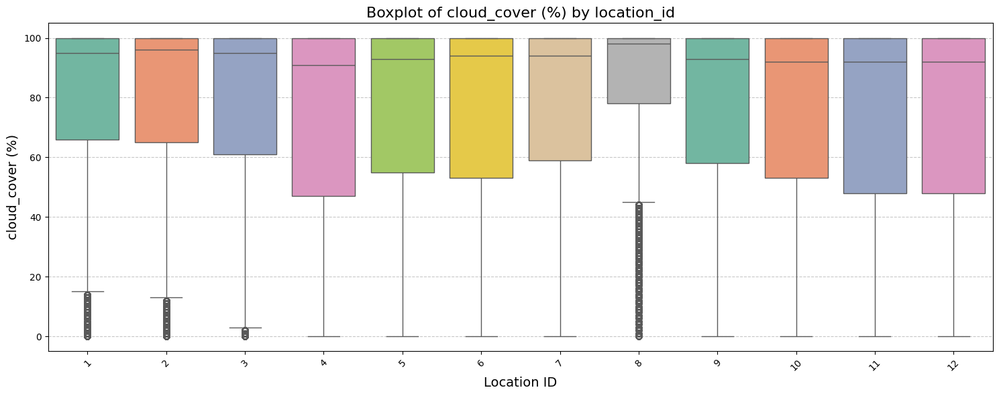

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


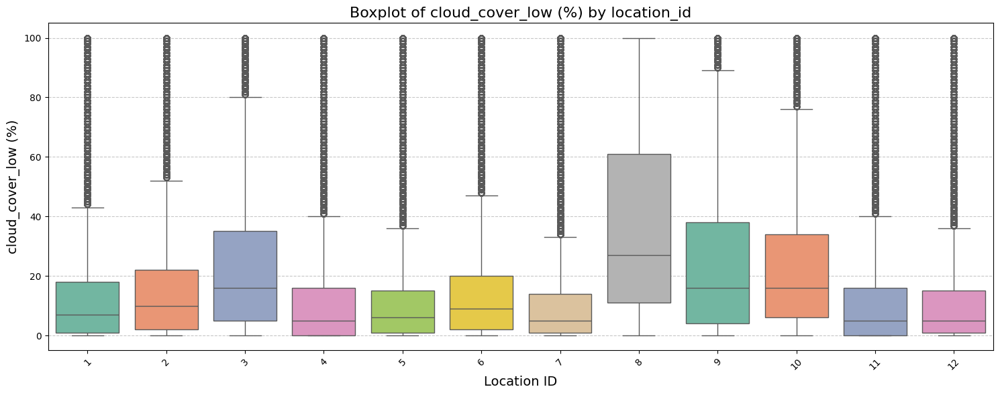

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


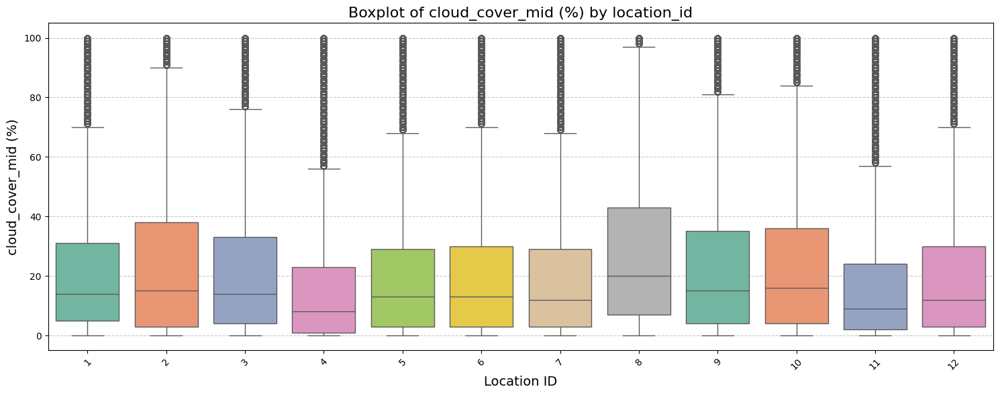

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


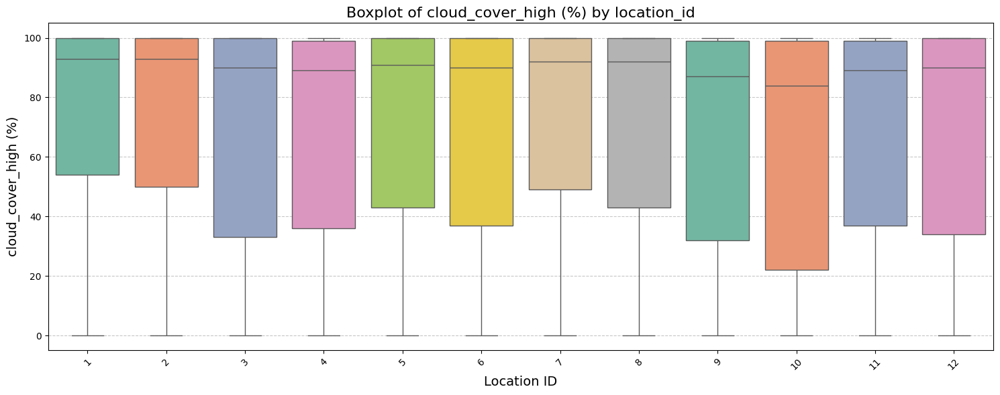

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


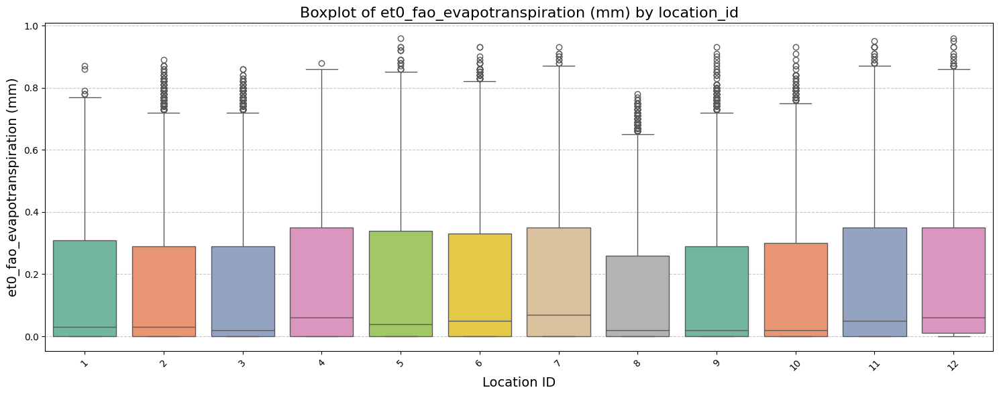

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


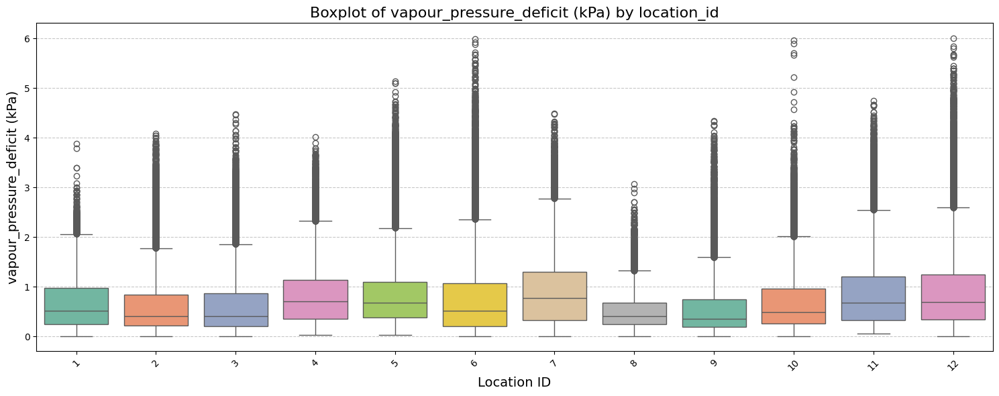

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


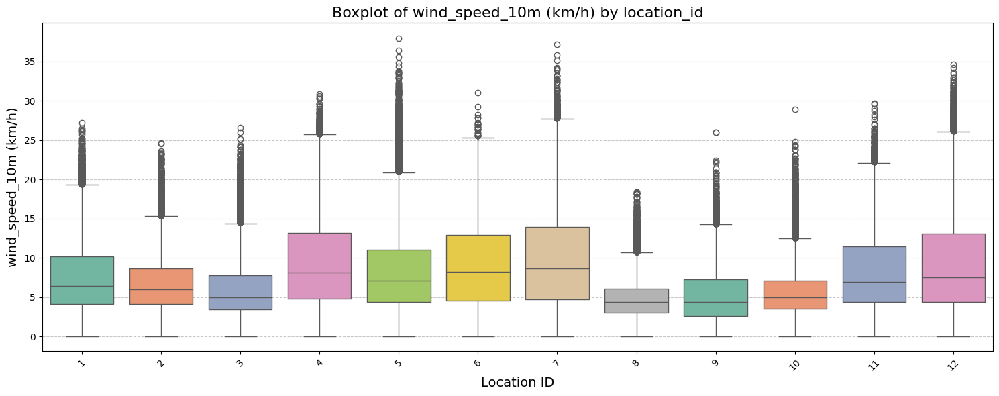

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


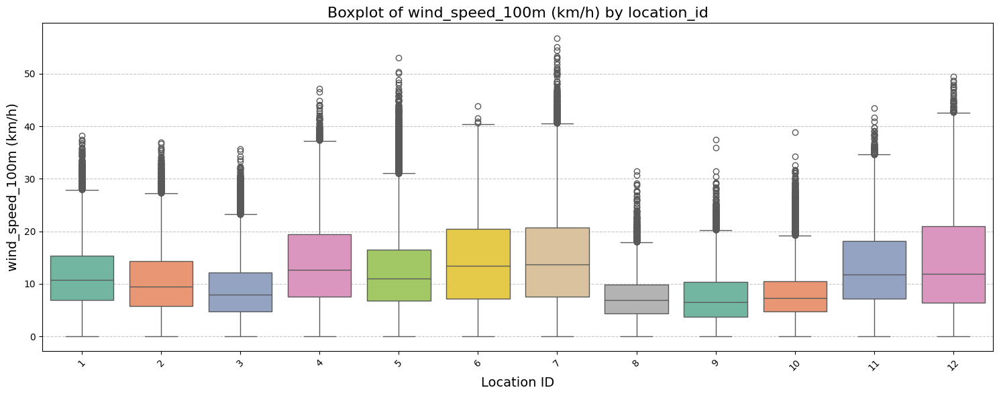

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


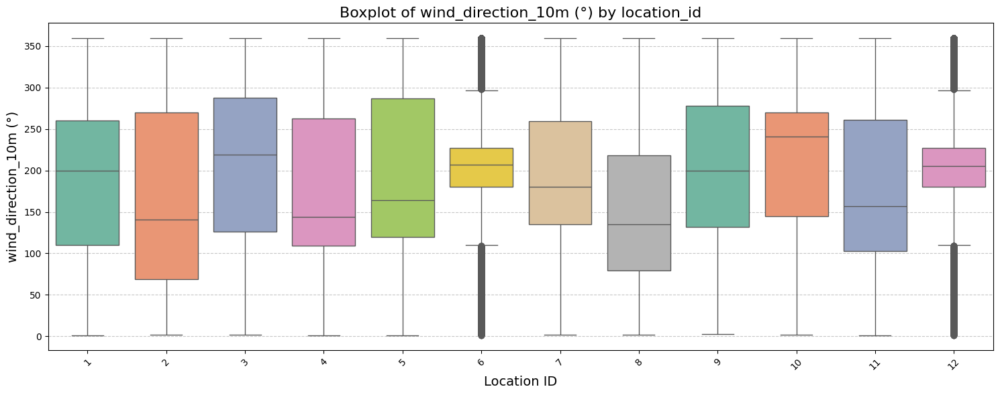

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


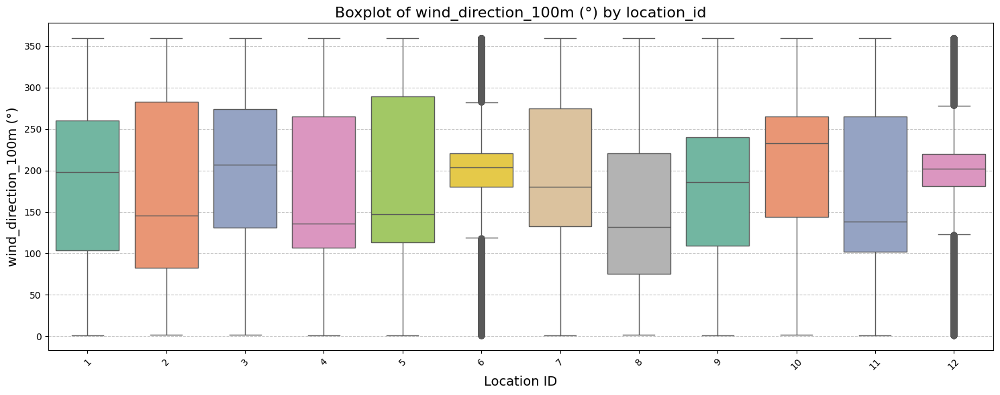

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


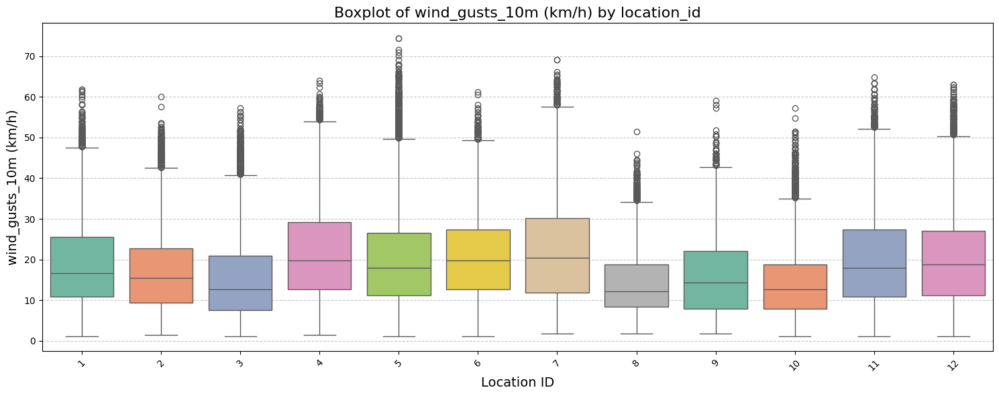

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


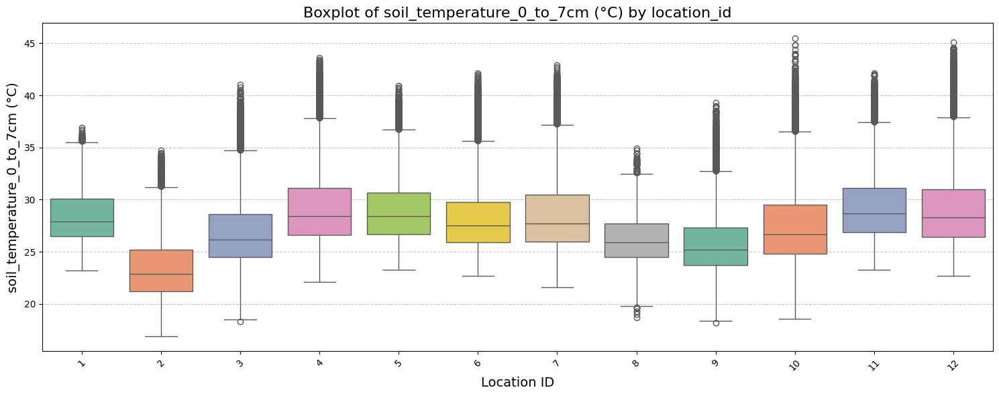

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


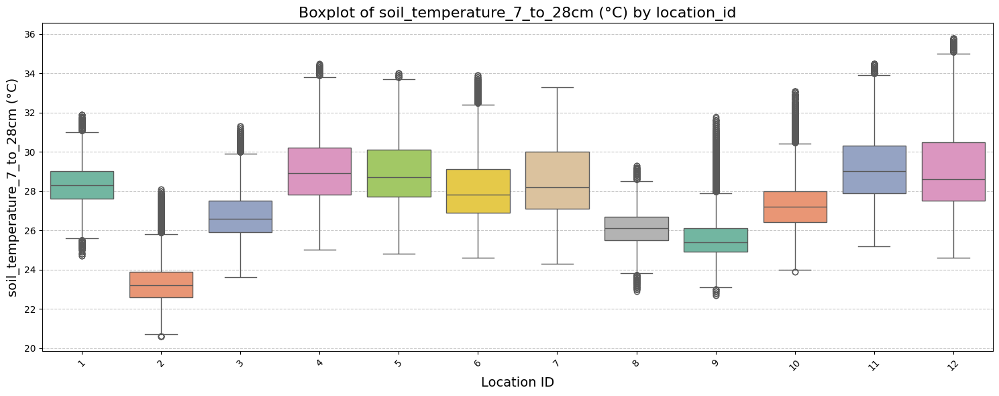

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


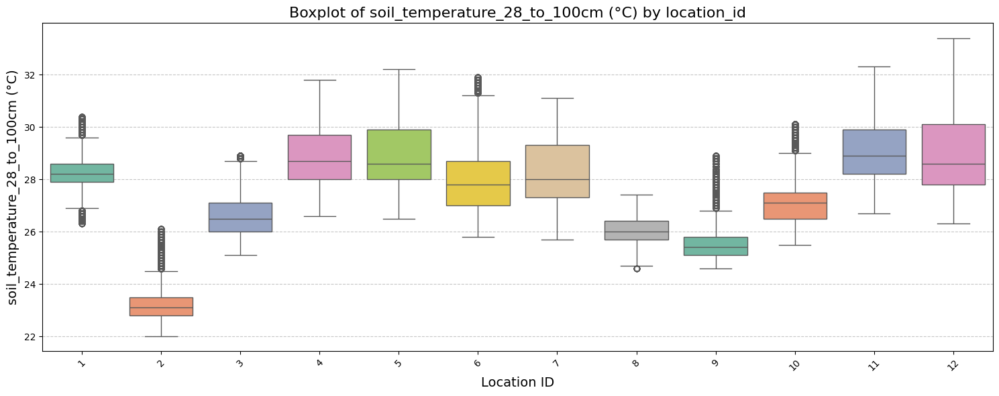

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


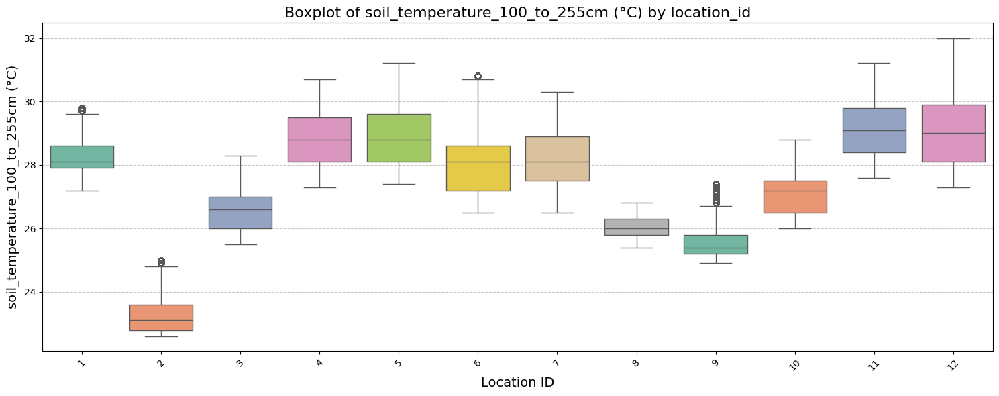

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


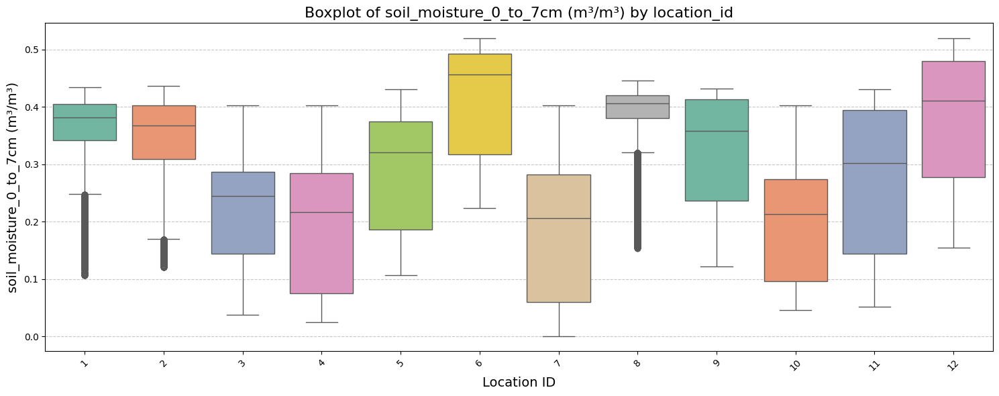

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


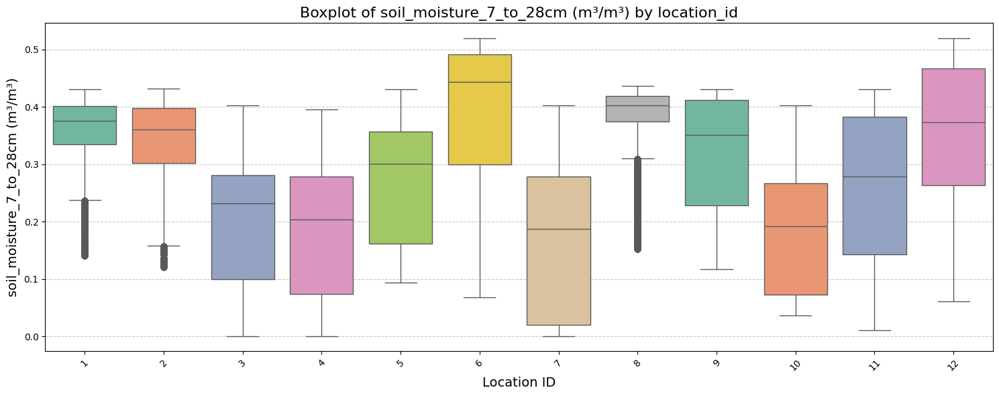

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


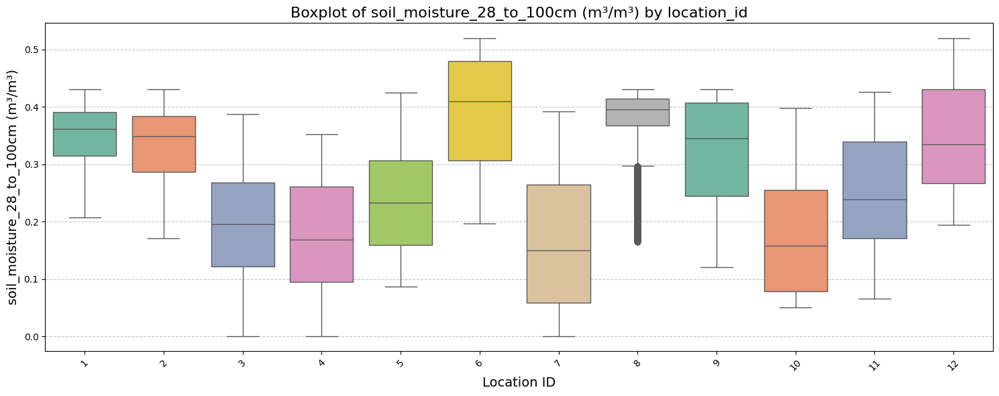

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


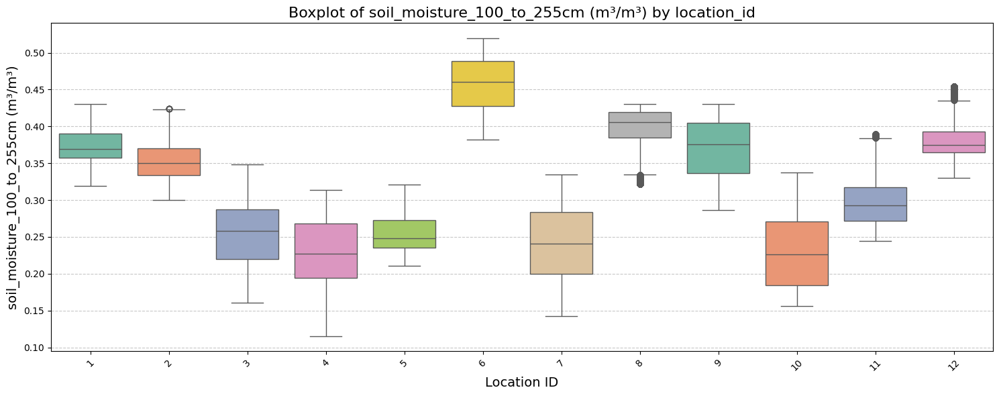

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


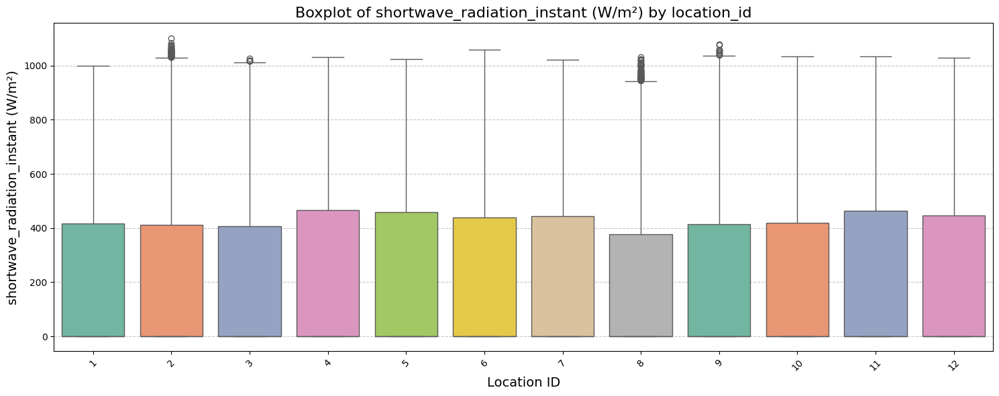

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


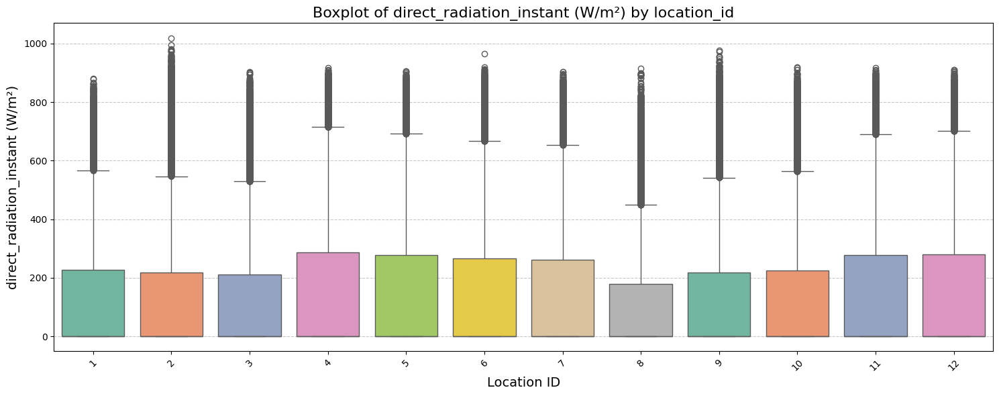

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


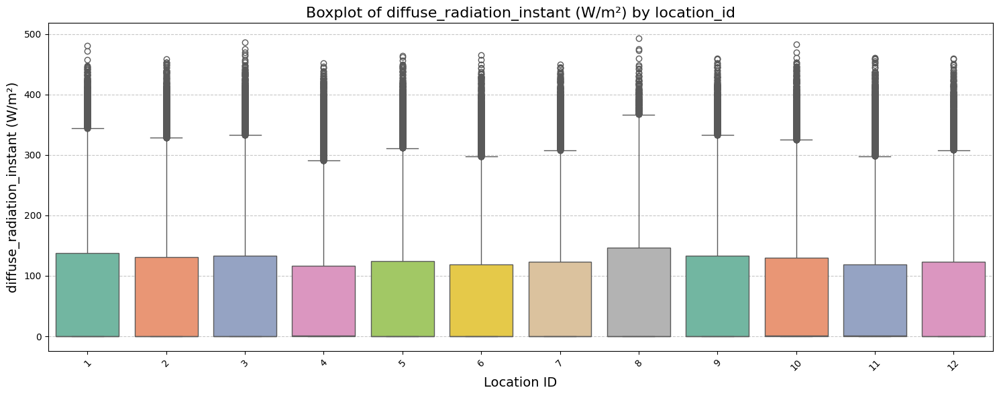

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


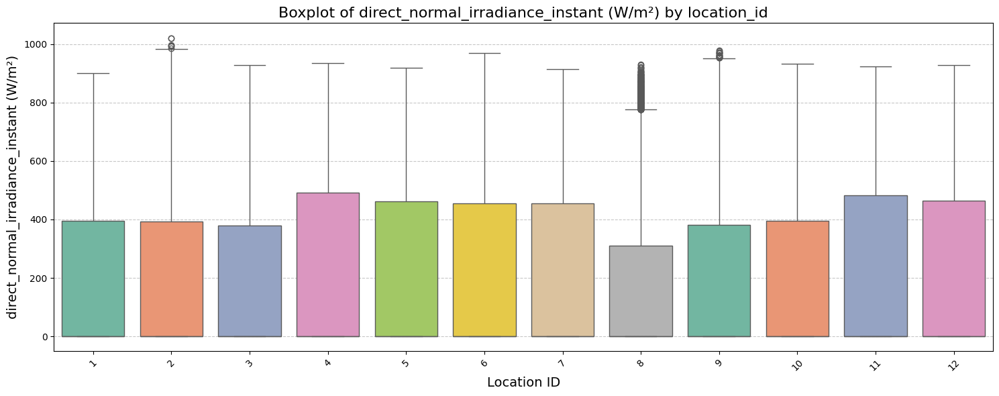

<ipython-input-43-23ff6265883e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='location_id', y=col, palette='Set2')


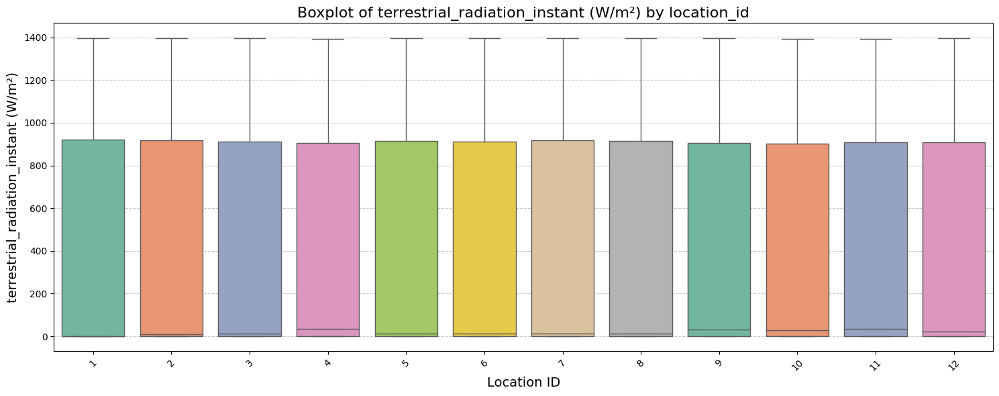

In [ ]:
df = hourly_train.copy()

numeric_columns = df.select_dtypes(include=['float64']).columns

locations = df['location_id'].unique()

for col in numeric_columns:
    plt.figure(figsize=(15, 6))
    sns.boxplot(data=df, x='location_id', y=col, palette='Set2')
    plt.title(f"Boxplot of {col} by location_id", fontsize=16)
    plt.xlabel("Location ID", fontsize=14)
    plt.ylabel(col, fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

* Distribusi setiap kolom

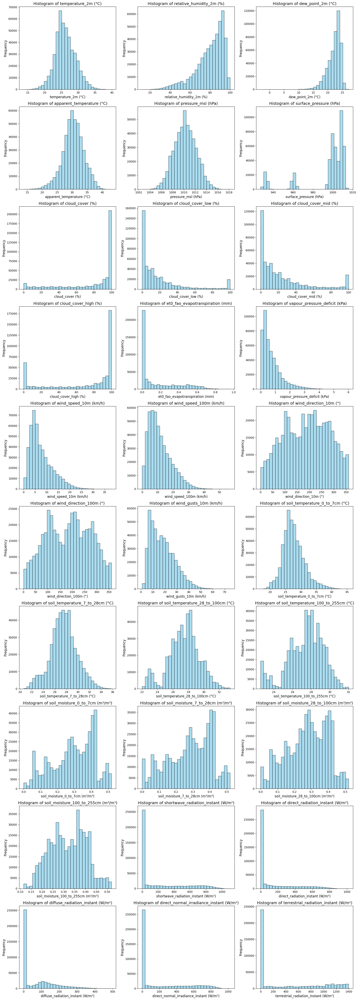

In [ ]:
df = hourly_train.copy()

numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

cols_per_row = 3
num_cols = len(numeric_columns)
num_rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(18, 5 * num_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    ax = axes[i]
    ax.hist(df[col].dropna(), bins=30, color='skyblue', alpha=0.7, edgecolor='black')
    ax.set_title(f"Histogram of {col}", fontsize=14)
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)

for j in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### daily_train (lebih lanjut)

#### EDA Kolom rain_sum

* Distribusi rain_sum untuk setiap lokasi

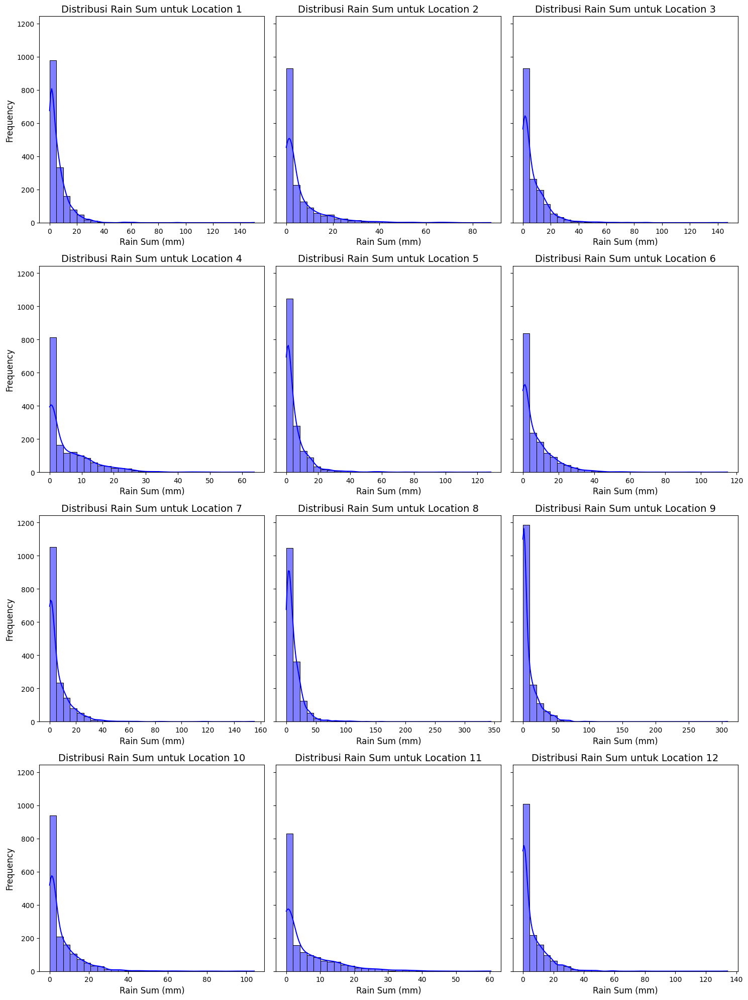

In [ ]:
location_ids = daily_train['location_id'].unique()

num_cols = 3
num_rows = (len(location_ids) + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), sharey=True)

axes = axes.flatten()

for i, location_id in enumerate(location_ids):
    location_data = daily_train[daily_train['location_id'] == location_id]

    sns.histplot(location_data['rain_sum (mm)'], bins=30, kde=True, color='blue', ax=axes[i])

    axes[i].set_title(f'Distribusi Rain Sum untuk Location {location_id}', fontsize=14)
    axes[i].set_xlabel('Rain Sum (mm)', fontsize=12)
    axes[i].set_ylabel('Frequency', fontsize=12)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Skew and kurtosis
print("Skewness: %f" % daily_train['rain_sum (mm)'].skew())
print("Kurtosis: %f" % daily_train['rain_sum (mm)'].kurt())

Skewness: 5.850214
Kurtosis: 93.781600


* Visualisasi curah hujan pada level bulanan

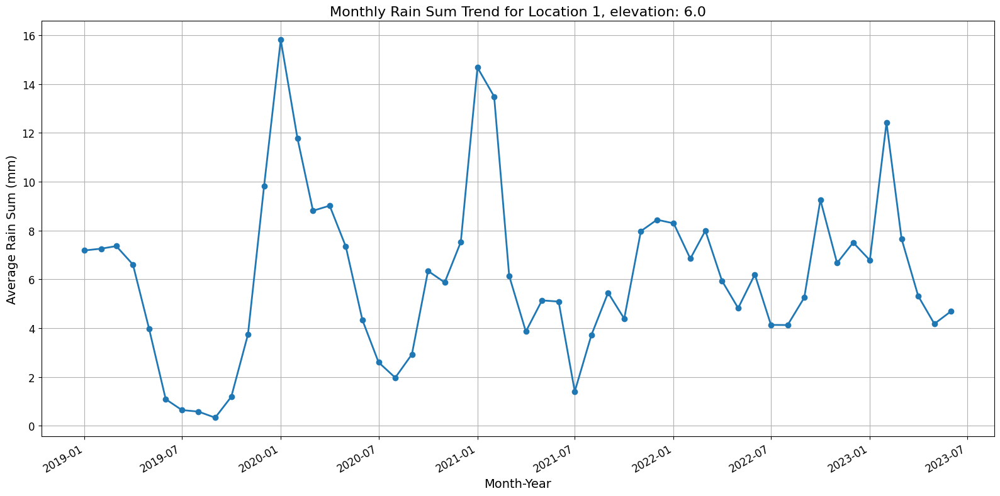

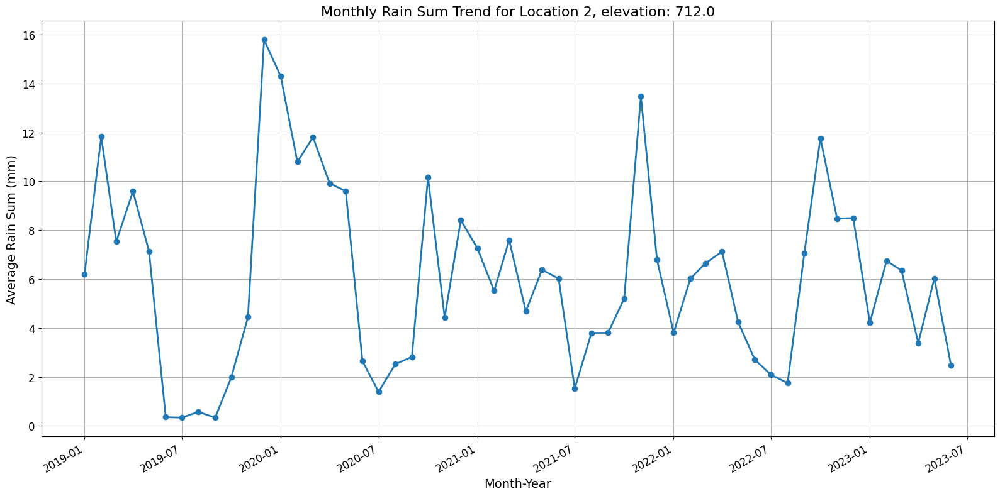

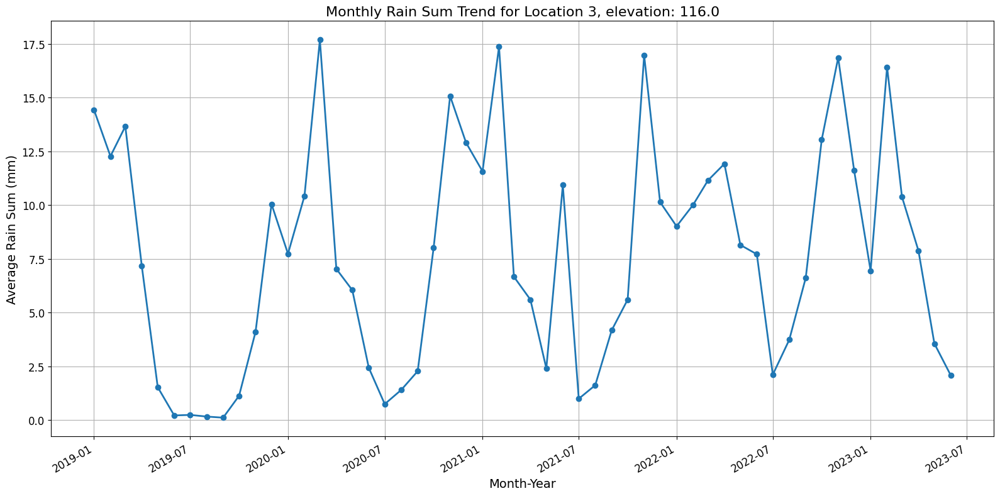

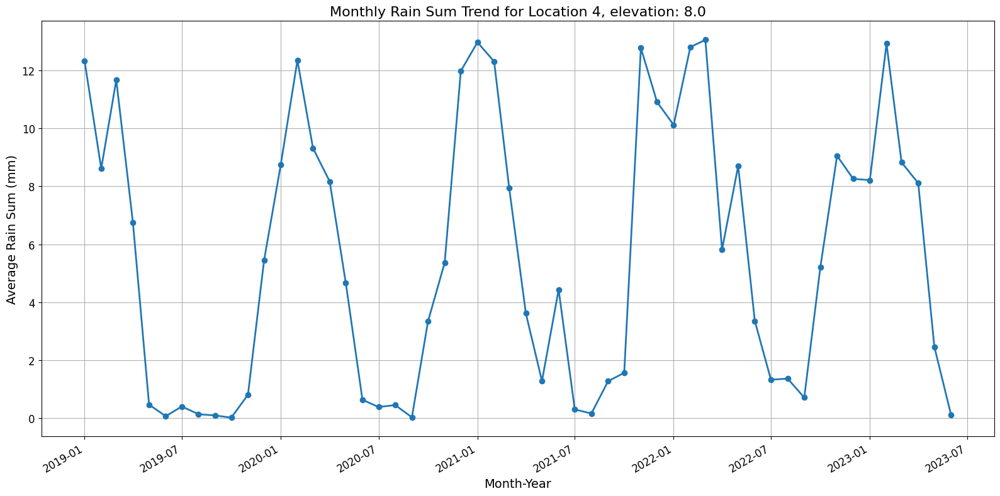

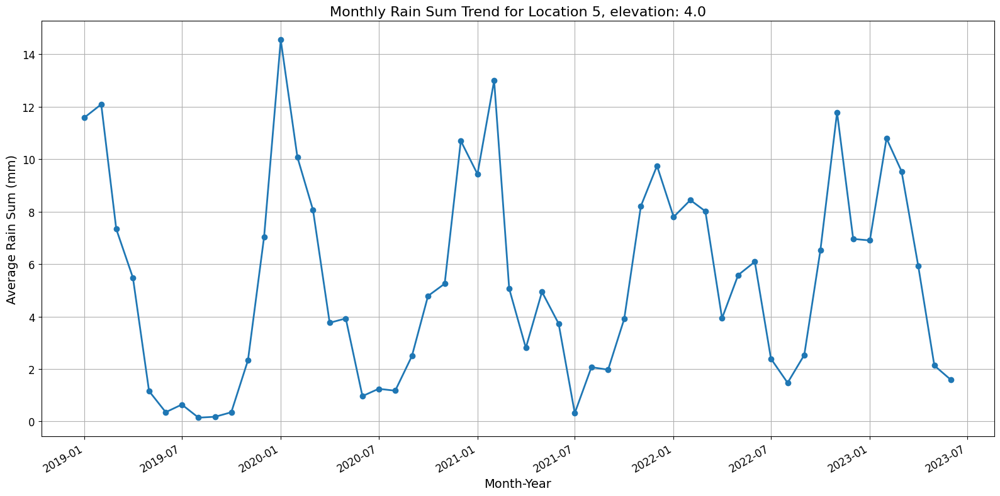

...

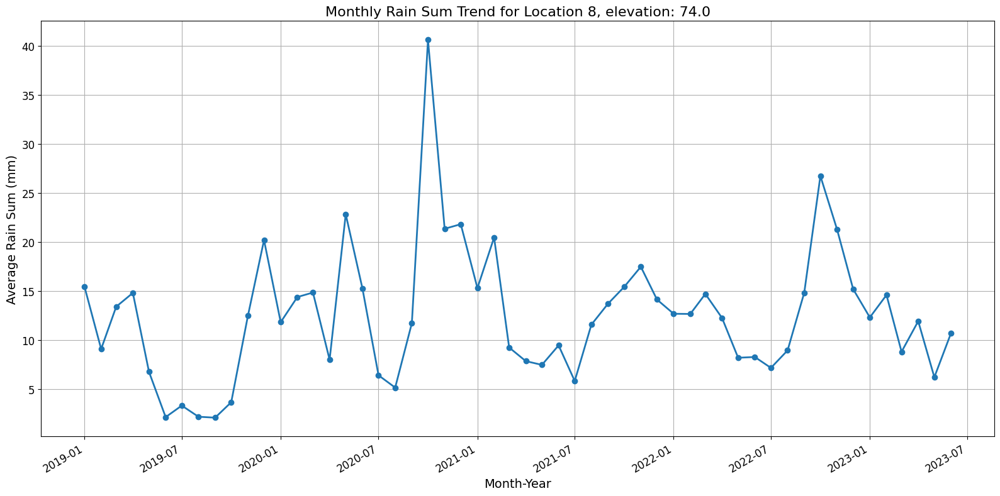

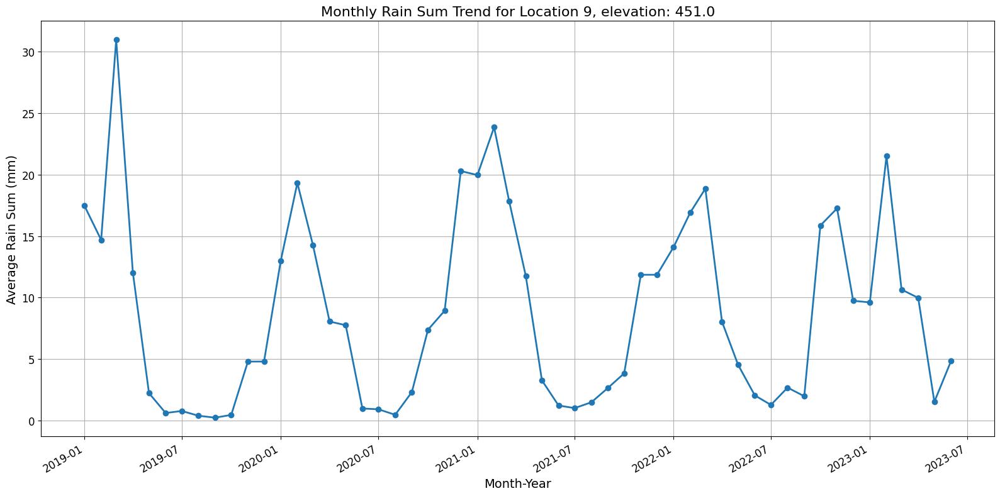

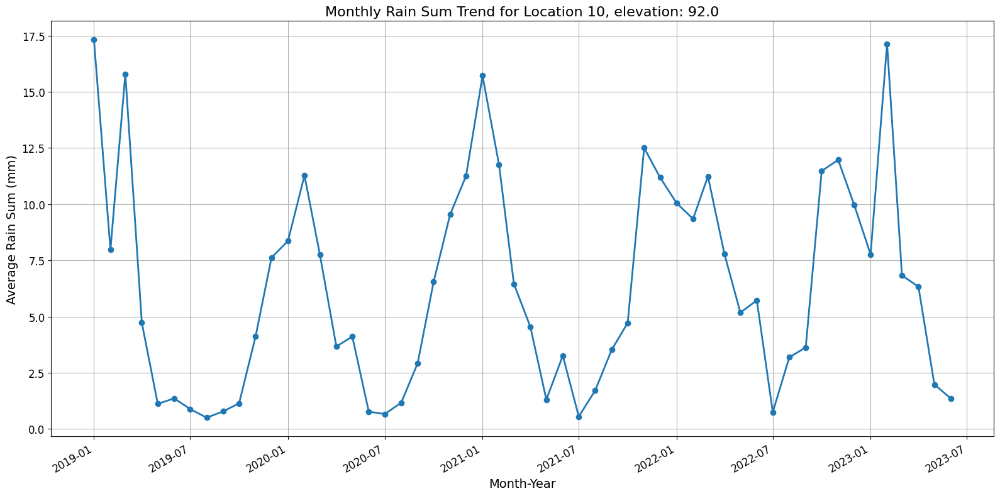

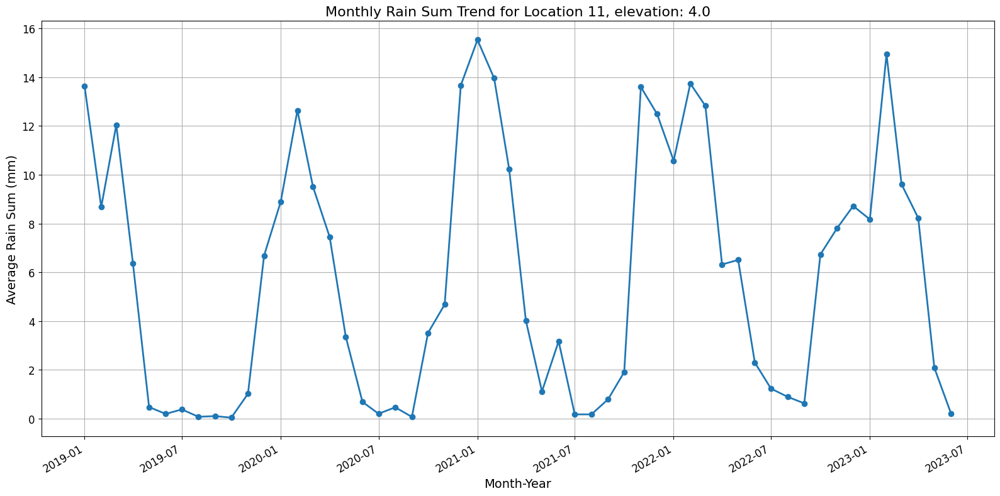

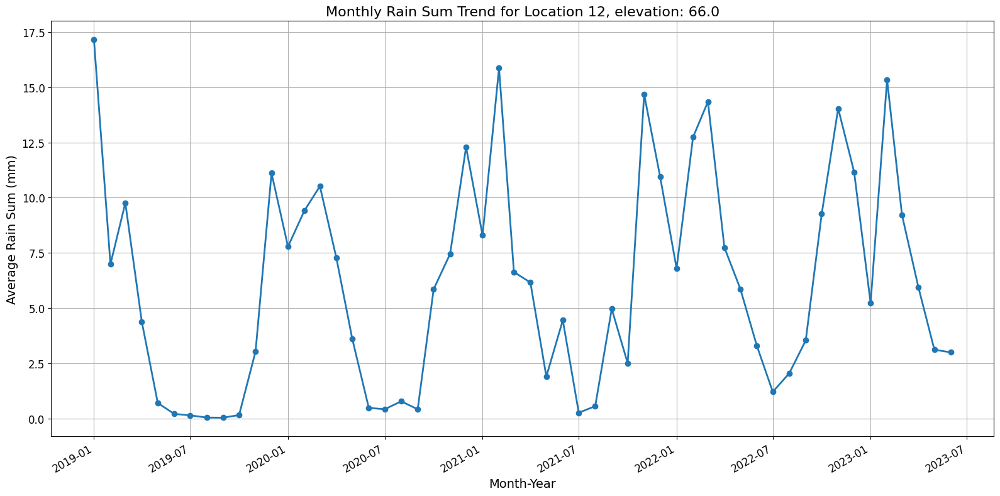

In [ ]:
df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

for location_id in df_eda['location_id'].unique():
    location_data = df_eda[df_eda['location_id'] == location_id].copy()

    location_data['month_year'] = location_data['time'].dt.to_period('M')
    monthly_rain = location_data.groupby('month_year')['rain_sum (mm)'].mean().reset_index()

    monthly_rain['month_year'] = monthly_rain['month_year'].dt.to_timestamp()

    plt.figure(figsize=(16, 8))
    plt.plot(monthly_rain['month_year'], monthly_rain['rain_sum (mm)'], marker='o', linewidth=2, label='Rain Sum (mm)')

    plt.title(f"Monthly Rain Sum Trend for Location {location_id}, elevation: {location.loc[location_id-1, 'elevation']}", fontsize=16)
    plt.xlabel("Month-Year", fontsize=14)
    plt.ylabel("Average Rain Sum (mm)", fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    plt.gcf().autofmt_xdate()

    plt.grid(True)
    plt.tight_layout()
    plt.show()

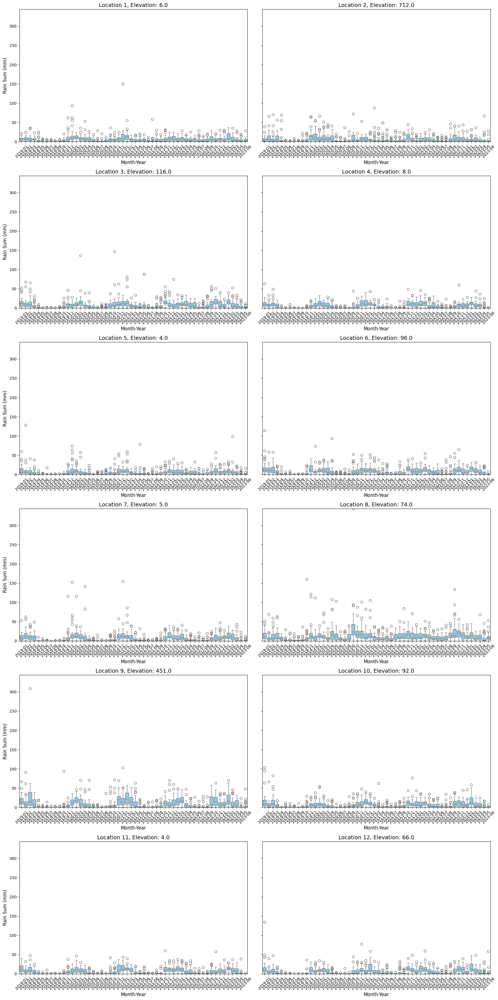

In [ ]:
df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])
df_eda['month_year'] = df_eda['time'].dt.to_period('M')

location_ids = df_eda['location_id'].unique()

global_max = df_eda['rain_sum (mm)'].max()

n_rows = (len(location_ids) + 1) // 2
n_cols = 2
fig_width = 18
fig_height_per_row = 6
figsize = (fig_width, n_rows * fig_height_per_row)

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize, sharey=True)
axes = axes.flatten()

for idx, location_id in enumerate(location_ids):
    location_data = df_eda[df_eda['location_id'] == location_id].copy()
    location_data['month_year'] = location_data['month_year'].astype(str)

    sns.boxplot(ax=axes[idx], x='month_year', y='rain_sum (mm)', data=location_data, color="skyblue")

    axes[idx].set_title(f"Location {location_id}, Elevation: {location.loc[location_id-1, 'elevation']}", fontsize=14)
    axes[idx].set_xlabel("Month-Year", fontsize=12)
    axes[idx].set_ylabel("Rain Sum (mm)", fontsize=12)
    axes[idx].tick_params(axis='x', rotation=45, labelsize=10)
    axes[idx].tick_params(axis='y', labelsize=10)
    axes[idx].set_ylim(0, global_max)

for i in range(len(location_ids), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

Secara jelas terdapat seasonality pada curah hujan untuk setiap lokasi

* Visualisasi curah hujan pada level bulanan dengan membandingkannya untuk setiap tahun

In [ ]:
df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

df_eda['year'] = df_eda['time'].dt.year
df_eda['month'] = df_eda['time'].dt.month

for location_id in df_eda['location_id'].unique():
    location_data = df_eda[df_eda['location_id'] == location_id]

    month_year_rain = location_data.groupby(['year', 'month'])['rain_sum (mm)'].mean().reset_index()
    month_year_pivot = month_year_rain.pivot(index='month', columns='year', values='rain_sum (mm)')

    month_year_pivot.plot(marker='o', linewidth=2, figsize=(24, 12))
    plt.title(f"Monthly Rain Sum Trends Over Different Years for Location {location_id}, elevation : {location.loc[location_id-1, 'elevation']}", fontsize=16)
    plt.xlabel("Month", fontsize=14)
    plt.ylabel("Average Rain Sum (mm)", fontsize=14)
    plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=12)
    plt.yticks(fontsize=12)

    plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, title_fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

Dapat dilihat pada setiap tahunnya terdapat tren penurunan dan peningkatan curah hujan pada bulan-bulan tertentu tentu. Terdapat hal menarik:
1. Pada semua location_id kecuali location_id = 8, curah hujan mengalami puncak sekitar akhir/awal tahun (Sekitar Desember, Januari, Februari). Curah hujan cukup sedikit pada bulan Juli-Agustus.
2. Pada location_id = 8, curah hujan hanya mengalami peningkatan besar pada akhir bulan (September-Oktober)

* Visualisasi curah hujan pada level mingguan

In [ ]:
df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

df_eda['year'] = df_eda['time'].dt.year
df_eda['week'] = df_eda['time'].dt.isocalendar().week

for location_id in df_eda['location_id'].unique():
    location_data = df_eda[df_eda['location_id'] == location_id]

    week_year_rain = location_data.groupby(['year', 'week'])['rain_sum (mm)'].mean().reset_index()
    week_year_pivot = week_year_rain.pivot(index='week', columns='year', values='rain_sum (mm)')

    week_year_pivot.plot(marker='o', linewidth=2, figsize=(24, 12))
    plt.title(f"Weekly Rain Sum Trends Over Different Years for Location {location_id}, elevation : {location.loc[location_id-1, 'elevation']}", fontsize=16)
    plt.xlabel("Week", fontsize=14)
    plt.ylabel("Average Rain Sum (mm)", fontsize=14)
    plt.xticks(ticks=range(1, 54), fontsize=12)
    plt.yticks(fontsize=12)

    plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, title_fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

Untuk visualisasi perminggu, yang dihasilkan tiap tahun cukup bervariasi. Diduga juga terdapat outlier yang berkemungkinan

* Visualisasi Harian

In [ ]:
df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

for location_id in df_eda['location_id'].unique():
    location_data = df_eda[df_eda['location_id'] == location_id]

    day_rain = location_data.groupby('time')['rain_sum (mm)'].mean().reset_index()

    plt.figure(figsize=(24, 12))
    plt.plot(day_rain['time'], day_rain['rain_sum (mm)'], marker='o', linewidth=2)
    plt.title(f"Daily Rain Sum Trends for Location {location_id}, Elevation: {location.loc[location_id-1, 'elevation']}", fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Rain Sum (mm)", fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    plt.grid(True)
    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

Dari visualisasi di atas, diduga bahwa terdapat outlier untuk rain_sum. Untuk melihat outlier lebih jelas, akan divisualisasikan dengan skala maksimum sumbu y yang sama.

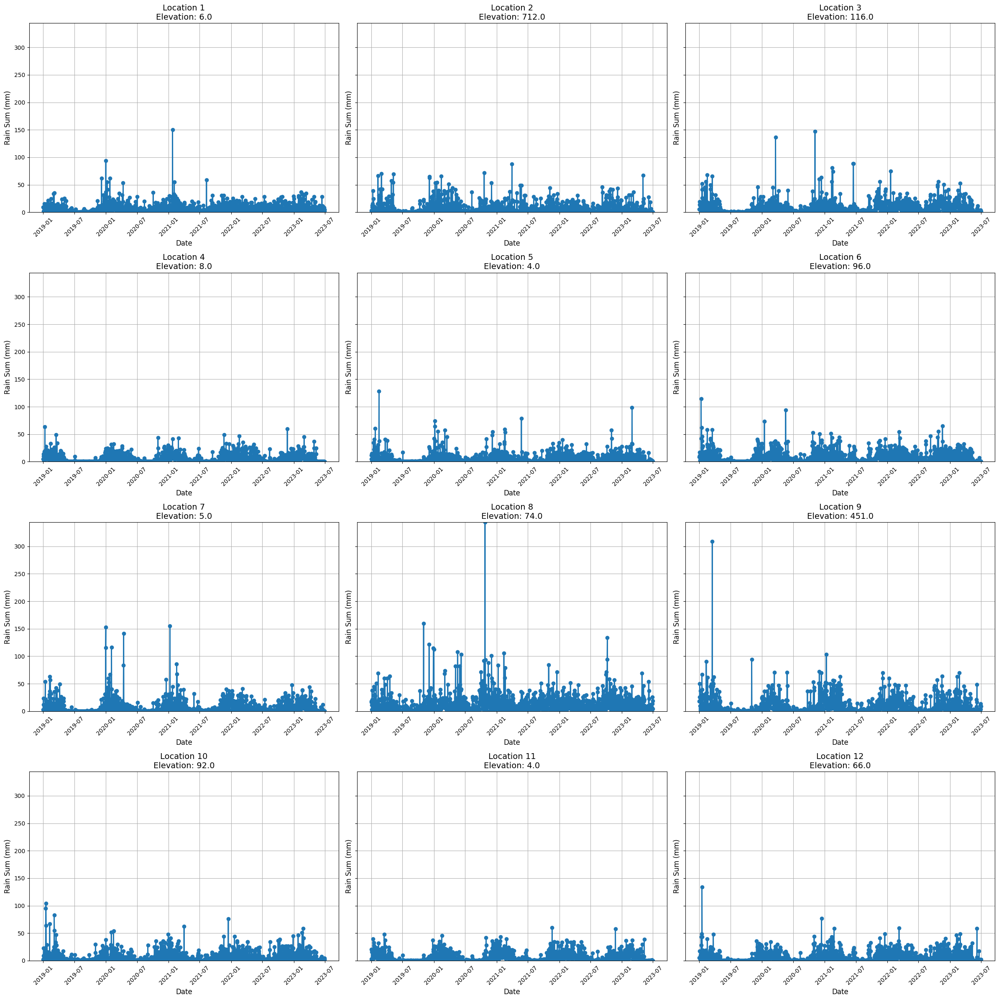

In [ ]:
df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

locations = df_eda['location_id'].unique()

y_max = np.ceil(df_eda['rain_sum (mm)'].max())

n_cols = 3
n_rows = int(np.ceil(len(locations) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 6 * n_rows), sharey=True)
axes = axes.flatten()

for i, location_id in enumerate(locations):
    location_data = df_eda[df_eda['location_id'] == location_id]

    day_rain = location_data.groupby('time')['rain_sum (mm)'].mean().reset_index()

    axes[i].plot(day_rain['time'], day_rain['rain_sum (mm)'], marker='o', linewidth=2)
    axes[i].set_title(f"Location {location_id}\nElevation: {location.loc[location_id-1, 'elevation']}", fontsize=14)
    axes[i].set_xlabel("Date", fontsize=12)
    axes[i].set_ylabel("Rain Sum (mm)", fontsize=12)
    axes[i].set_ylim(0, y_max)

    axes[i].tick_params(axis='x', rotation=45, labelsize=10)
    axes[i].grid(True)

for j in range(len(locations), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Jelas terdapat outlier dengan nilai rain_sum yang sangat besar pada location 8 dan 9. Outlier ini diduga adalah sebuah anomali karena berdasarkan literatur, didapat kategori curah hujan BMKG sebagai berikut:

```
Ambang batas nilai yang digunakan untuk menentukan intensitas hujan sebagai berikut:

0 mm/hari (abu-abu) : Berawan
0.5 – 20 mm/hari (hijau) : Hujan ringan
20 – 50 mm/hari (kuning) : Hujan sedang
50 – 100 mm/hari (oranye): Hujan lebat
100 – 150 mm/hari (merah) : Hujan sangat lebat
>150 mm / hari (ungu) : Hujan ekstrem
```
Baris dengan dugaan anomali:
1. Lokasi 8, tanggal 2020-10-25
2. Lokasi 9, tanggal 2019-03-17


In [ ]:
daily_train[daily_train['rain_sum (mm)']>200]

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
12157,loc8_20201025,8,2020-10-25,25.1,24.0,24.6,30.4,28.5,29.8,2020-10-25 05:17:00,2020-10-25 17:37:00,44389.55,2750.72,343.8,8.6,21.6,243.0,5.70,1.23
13211,loc9_20190317,9,2019-03-17,23.2,21.2,22.2,27.7,25.3,26.4,2019-03-17 05:33:00,2019-03-17 17:42:00,43701.91,0.00,308.8,6.4,29.2,74.0,2.26,0.62


Visualisasi untuk menggali lebih lanjut 2 baris yang diduga anomali

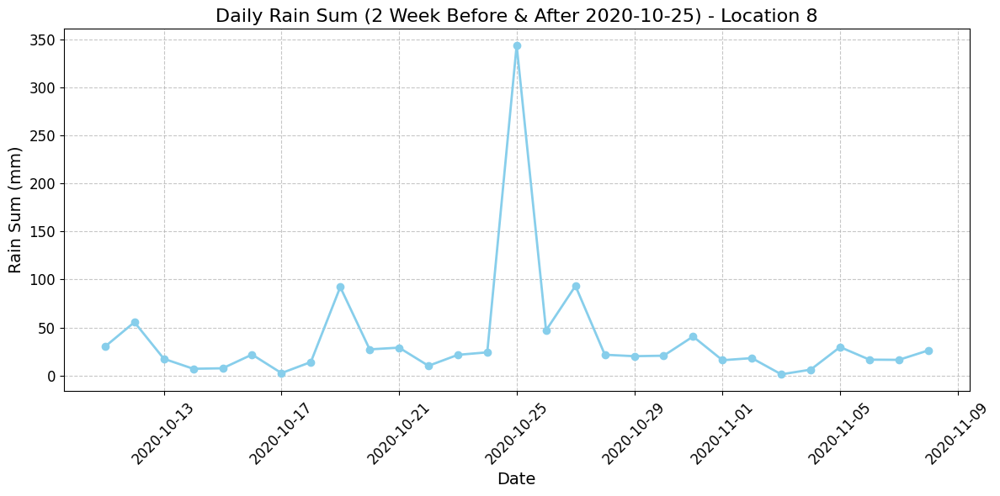

In [ ]:
df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

location_id = 8
start_date = "2020-10-11"
end_date = "2020-11-08"

location_data = df_eda[
    (df_eda['location_id'] == location_id) &
    (df_eda['time'] >= start_date) &
    (df_eda['time'] <= end_date)
]

daily_rain = location_data.groupby('time')['rain_sum (mm)'].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(daily_rain['time'], daily_rain['rain_sum (mm)'], marker='o', color='skyblue', linewidth=2)
plt.title(f"Daily Rain Sum (2 Week Before & After 2020-10-25) - Location {location_id}", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Rain Sum (mm)", fontsize=14)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

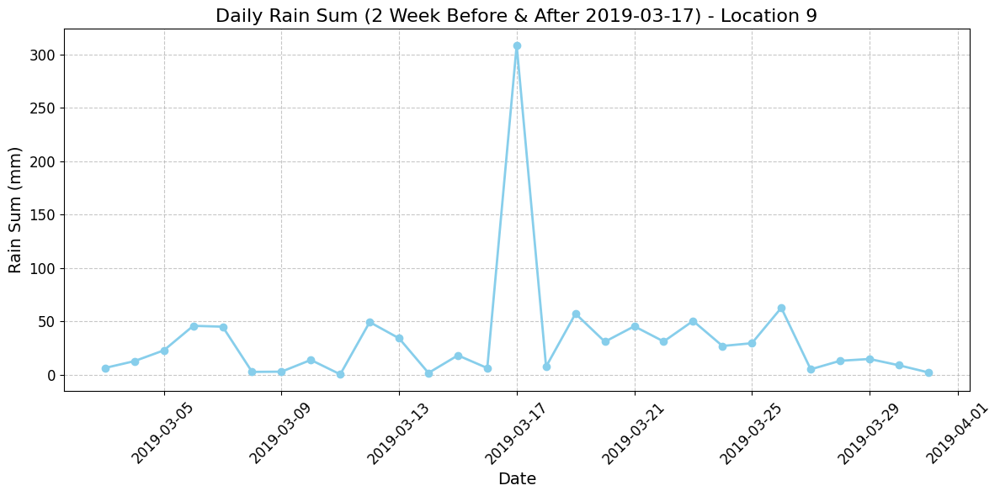

In [ ]:
df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

location_id = 9
start_date = "2019-03-03"
end_date = "2019-03-31"

location_data = df_eda[
    (df_eda['location_id'] == location_id) &
    (df_eda['time'] >= start_date) &
    (df_eda['time'] <= end_date)
]

daily_rain = location_data.groupby('time')['rain_sum (mm)'].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(daily_rain['time'], daily_rain['rain_sum (mm)'], marker='o', color='skyblue', linewidth=2)
plt.title(f"Daily Rain Sum (2 Week Before & After 2019-03-17) - Location {location_id}", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Rain Sum (mm)", fontsize=14)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

* Akan diteliti baris yang diduga anomali dengan informasi dataframe hourly_train

Baris dengan dugaan anomali:
1. Lokasi 8, tanggal 2020-10-25
2. Lokasi 9, tanggal 2019-03-17

In [ ]:
# 1. Lokasi 8, tanggal 2020-10-25

# Parameter lokasi dan tanggal
location_id = 8
date_of_interest = pd.Timestamp("2020-10-25")
start_date = date_of_interest - pd.Timedelta(days=2)
end_date = date_of_interest + pd.Timedelta(days=2)

# Filter data untuk rentang tanggal 2 hari sebelum dan sesudah
filtered_data = hourly_train[
    (hourly_train['location_id'] == location_id) &
    (hourly_train['time'] >= start_date) &
    (hourly_train['time'] <= end_date)
]

numeric_columns = filtered_data.select_dtypes(include='float64').columns

num_cols = len(numeric_columns)
num_rows = (num_cols + 1) // 2
fig, axes = plt.subplots(num_rows, 2, figsize=(16, 5 * num_rows), sharex=True)

axes = axes.flatten()

for i, col in enumerate(numeric_columns):

    axes[i].plot(filtered_data['time'], filtered_data[col], marker='o', linestyle='-', label=col)
    axes[i].set_title(f'Time Series for {col}', fontsize=14)
    axes[i].set_ylabel(col, fontsize=12)
    axes[i].set_xlabel('Datetime', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].grid(True, linestyle='--', alpha=0.7)


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
location_id = 9
date_of_interest = pd.Timestamp("2019-03-17")
start_date = date_of_interest - pd.Timedelta(days=2)
end_date = date_of_interest + pd.Timedelta(days=2)

filtered_data = hourly_train[
    (hourly_train['location_id'] == location_id) &
    (hourly_train['time'] >= start_date) &
    (hourly_train['time'] <= end_date)
]

numeric_columns = filtered_data.select_dtypes(include='float64').columns

num_cols = len(numeric_columns)
num_rows = (num_cols + 1) // 2
fig, axes = plt.subplots(num_rows, 2, figsize=(16, 5 * num_rows), sharex=True)

axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    axes[i].plot(filtered_data['time'], filtered_data[col], marker='o', linestyle='-', label=col)
    axes[i].set_title(f'Time Series for {col}', fontsize=14)
    axes[i].set_ylabel(col, fontsize=12)
    axes[i].set_xlabel('Datetime', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].grid(True, linestyle='--', alpha=0.7)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

Fakta: Terdapat rain_sum yang tidak wajar pada
1. Lokasi 8, tanggal 2020-10-25
2. Lokasi 9, tanggal 2019-03-17

Namun berdasarkan visualisasi data hourly di atas, kedua baris ini masuk akal, terutama pada nilai cloud cover, evapotranspirasi, soil moisture, dan radiation. Sepertinya fenomena curah hujan luar biasa deras ini memang benar terjadi (sehingga diduga bukan anomali). Outlier ini tidak akan dihapus karena berpotensi memberikan informasi penting pada data.

* Ekplorasi seasonality dengan grafik PACF

<Figure size 1200x600 with 0 Axes>

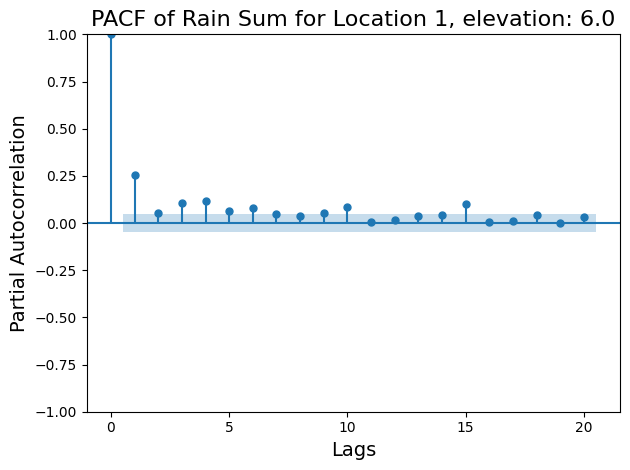

<Figure size 1200x600 with 0 Axes>

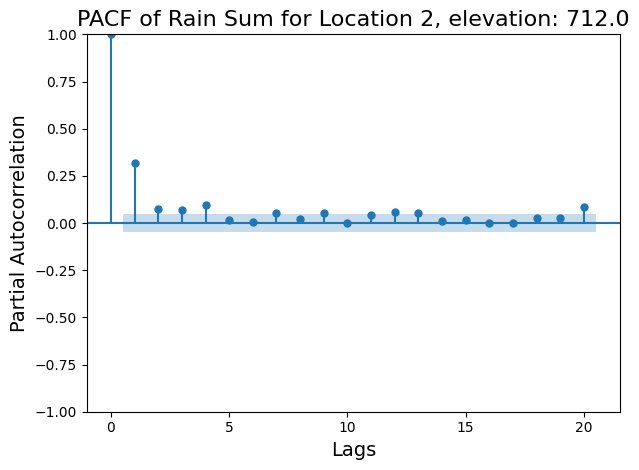

<Figure size 1200x600 with 0 Axes>

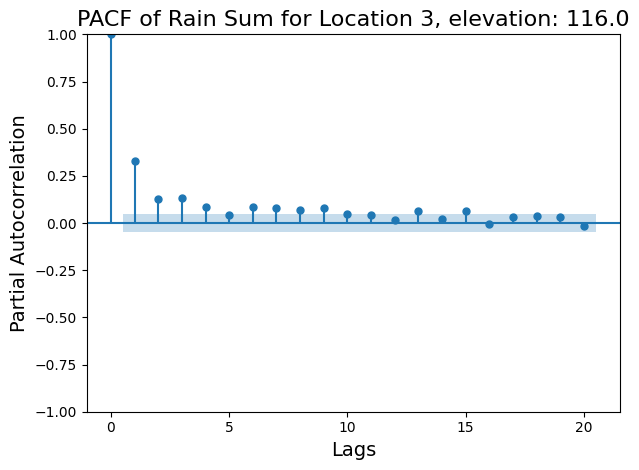

<Figure size 1200x600 with 0 Axes>

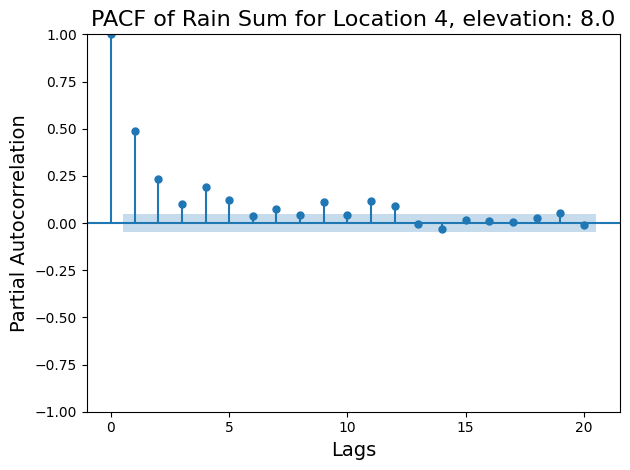

<Figure size 1200x600 with 0 Axes>

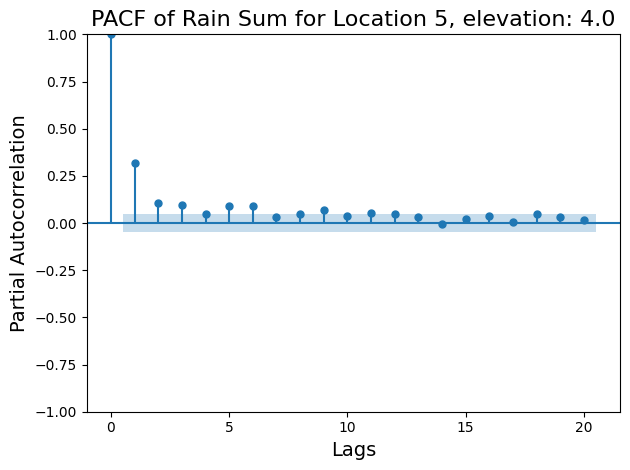

<Figure size 1200x600 with 0 Axes>

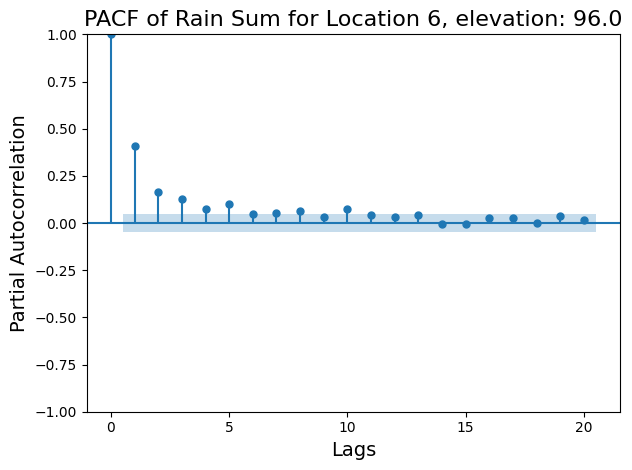

<Figure size 1200x600 with 0 Axes>

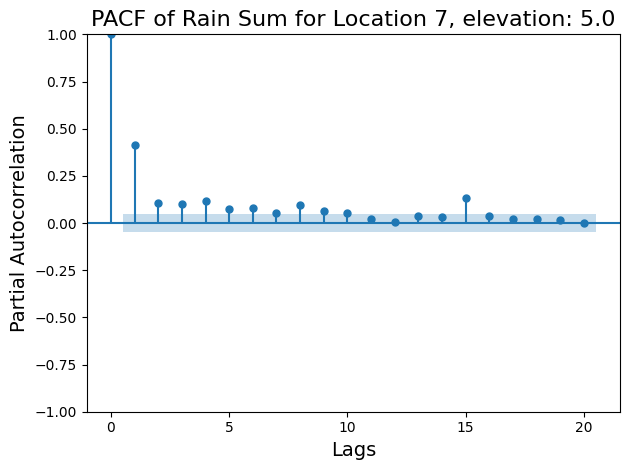

<Figure size 1200x600 with 0 Axes>

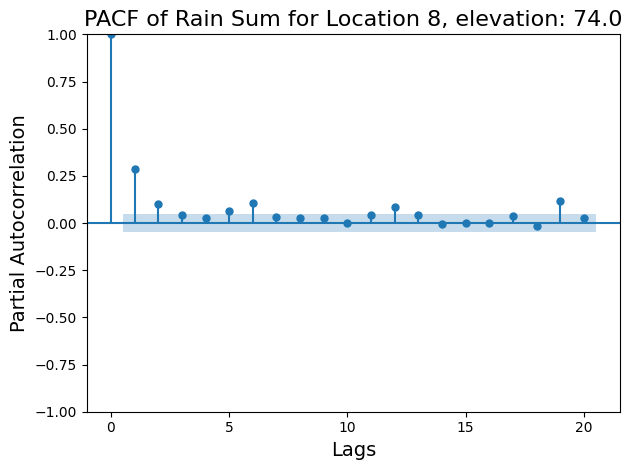

<Figure size 1200x600 with 0 Axes>

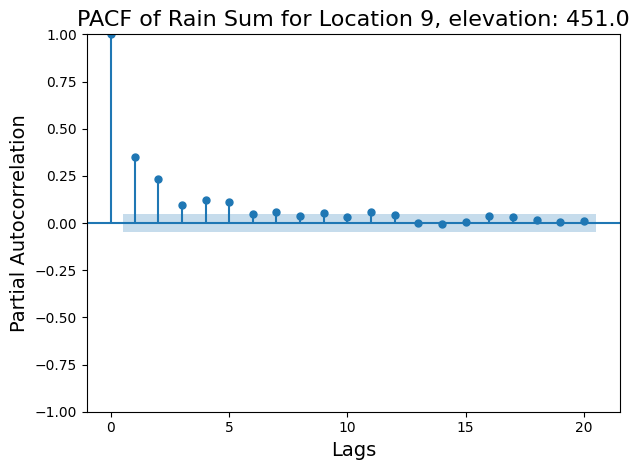

<Figure size 1200x600 with 0 Axes>

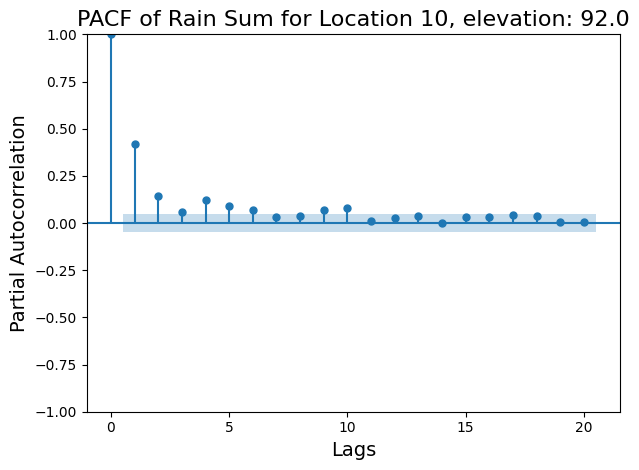

<Figure size 1200x600 with 0 Axes>

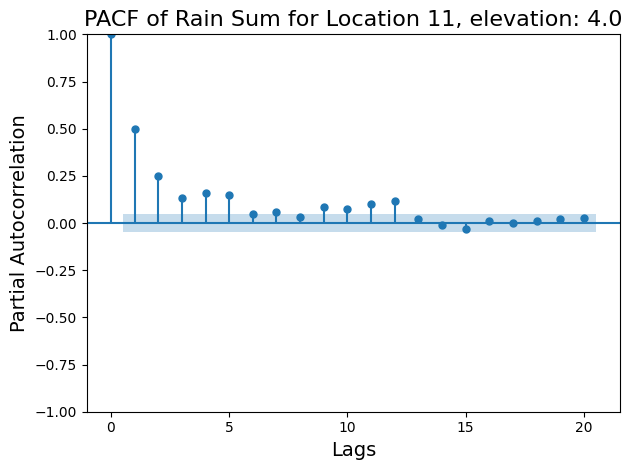

<Figure size 1200x600 with 0 Axes>

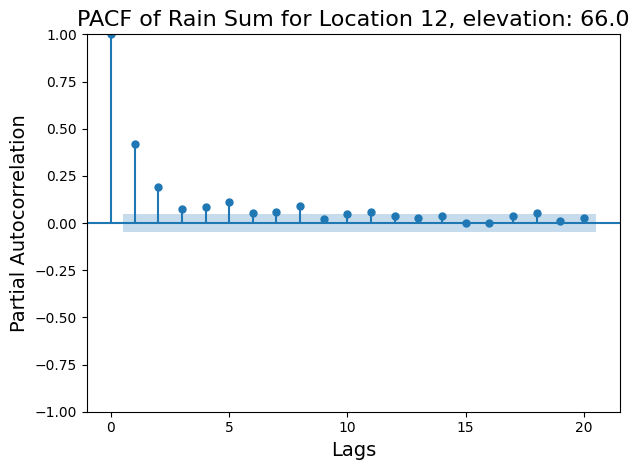

In [ ]:


df_eda = daily_train.copy()
df_eda['time'] = pd.to_datetime(df_eda['time'])

for location_id in df_eda['location_id'].unique():
    location_data = df_eda[df_eda['location_id'] == location_id].copy()

    location_data = location_data.sort_values(by='time')

    plt.figure(figsize=(12, 6))
    plot_pacf(location_data['rain_sum (mm)'].dropna(), lags=20, method='ywm', title=f'PACF for Location {location_id}')
    plt.title(f"PACF of Rain Sum for Location {location_id}, elevation: {location.loc[location_id-1, 'elevation']}", fontsize=16)
    plt.xlabel("Lags", fontsize=14)
    plt.ylabel("Partial Autocorrelation", fontsize=14)
    plt.tight_layout()
    plt.show()

Terdapat seasonality pada curah hujan untuk setiap lokasi

* Corrplot

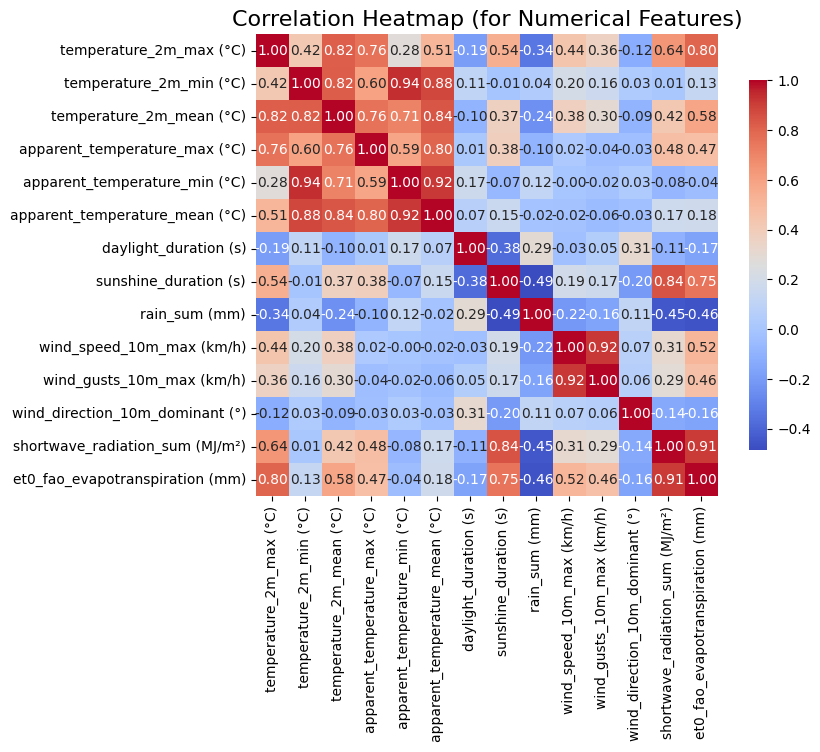

In [ ]:
# Corrplot with outlier
numerical_columns = daily_train.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = daily_train[numerical_columns].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Heatmap (for Numerical Features)', fontsize=16)
plt.show()

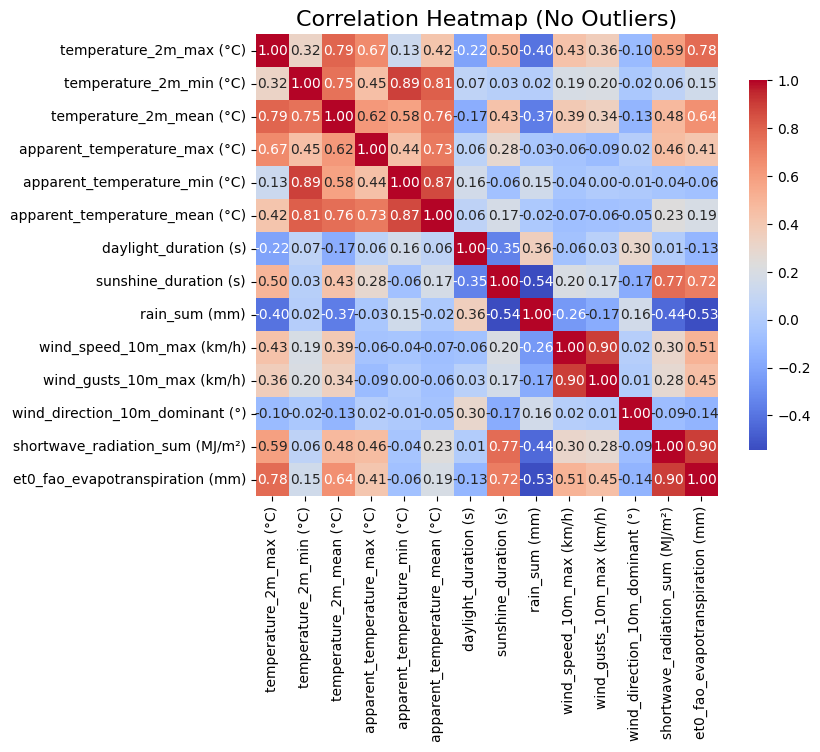

In [ ]:
# Corrplot without outlier
daily_train_no_outliers = daily_train.copy()

# Menghapus outlier
for col in numerical_columns:
    Q1 = daily_train_no_outliers[col].quantile(0.25)
    Q3 = daily_train_no_outliers[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    daily_train_no_outliers = daily_train_no_outliers[
        (daily_train_no_outliers[col] >= lower_bound) & (daily_train_no_outliers[col] <= upper_bound)
    ]


correlation_matrix_no_outliers = daily_train_no_outliers[numerical_columns].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(
    correlation_matrix_no_outliers,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Heatmap (No Outliers)', fontsize=16)
plt.show()

Pada data dengan dan tanpa outlier, dapat dilihat bahwa rain_sum berkorelasi paling kuat dengan
* et0_fao_evapotranspiration
* shortwave_radiation_sum
* sunshine_duration (s)
* daylight_duration (s)
* temperature_2m_max (°C)
* temperature_2m_mean (°C)

* snsplot

In [ ]:
numerical_columns = daily_train.select_dtypes(include=['float64', 'int64']).columns
sns.pairplot(daily_train[numerical_columns], diag_kind='kde', corner=True)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

#### Feat Eng

* Mutual Information sebelum Feat Eng

Data yang digunakan adalah data DENGAN outlier

et0_fao_evapotranspiration (mm)    0.310140
sunshine_duration (s)              0.296156
shortwave_radiation_sum (MJ/m²)    0.218794
temperature_2m_mean (°C)           0.169307
temperature_2m_max (°C)            0.156836
daylight_duration (s)              0.133228
wind_speed_10m_max (km/h)          0.093875
wind_direction_10m_dominant (°)    0.092739
wind_gusts_10m_max (km/h)          0.066102
apparent_temperature_min (°C)      0.062419
apparent_temperature_mean (°C)     0.050777
temperature_2m_min (°C)            0.049585
location_id                        0.044447
apparent_temperature_max (°C)      0.018692
Name: MI Scores, dtype: float64


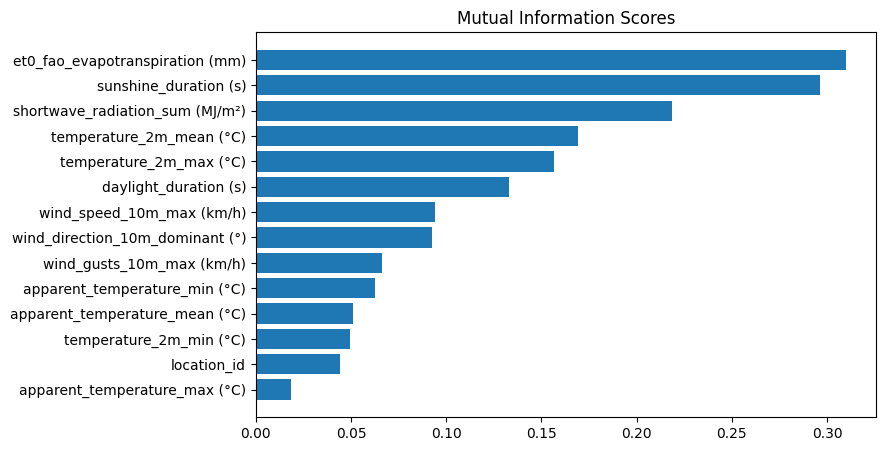

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
print(mi_scores)

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")


plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

Dari Mutual Information didapat informasi yang serupa dengan hasil Corrplot. Dari hasil temuan-temuan ini akan diteliti lebih lanjut pada bagian selanjutnya dan dilakukan feature engineering.

##### Data Tanggal

Untuk setiap fitur tanggal, akan dilakukan ekstrasi fitur-fitur seperti tahun, bulan, tanggal, dan hari (dalam minggu), juga berdasarkan EDA yang dilakukan , tampak ada pola siklis musiman yang mungkin terjadi setiap tahunnya sehingga dapat dilakukan feature engineering dengan menambahkan fitur transformasi trigonometri untuk setiap bulan untuk konversi menjadi dua koordinat yang dapat menggambarkan dengan jelas kedekatan bulan ujung dengan bulan awal (bulan Desember dan bulan Januari)

In [ ]:
def time_features(_df:pd.DataFrame) -> pd.DataFrame:
    df = _df.copy()
    time = pd.to_datetime(df['time'])

    df['year'] = time.dt.year
    df['month'] = time.dt.month
    df['day_year'] = time.dt.day_of_year
    df['day_week'] = time.dt.day_of_week
    df['day'] = time.dt.day
    df['time'] = time

    for time, col in zip([df['month'], df['day_year'], df['day_week'], df['day']], ['month', 'day_year', 'dw', 'dm']):
        time_range = {
            'month': 12,
            'day_year': 366,
            'dw': 7,
            'dm': 31,
        }

        df[f'time_{col}_sin'] = np.sin(time * (2 * np.pi / time_range[col]))
        df[f'time_{col}_cos'] = np.cos(time * (2 * np.pi / time_range[col]))
    return df

In [ ]:
daily_train = daily_train.pipe(time_features)
daily_test = daily_test.pipe(time_features)

* Mutual Information

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes(include=["object", "int64"]):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
mi_scores

,MI Scores
et0_fao_evapotranspiration (mm),0.305252
sunshine_duration (s),0.298880
day_year,0.222292
shortwave_radiation_sum (MJ/m²),0.216831
month,0.195031
temperature_2m_mean (°C),0.162383
time_day_year_cos,0.158060
temperature_2m_max (°C),0.155829
daylight_duration (s),0.133250
wind_speed_10m_max (km/h),0.096234


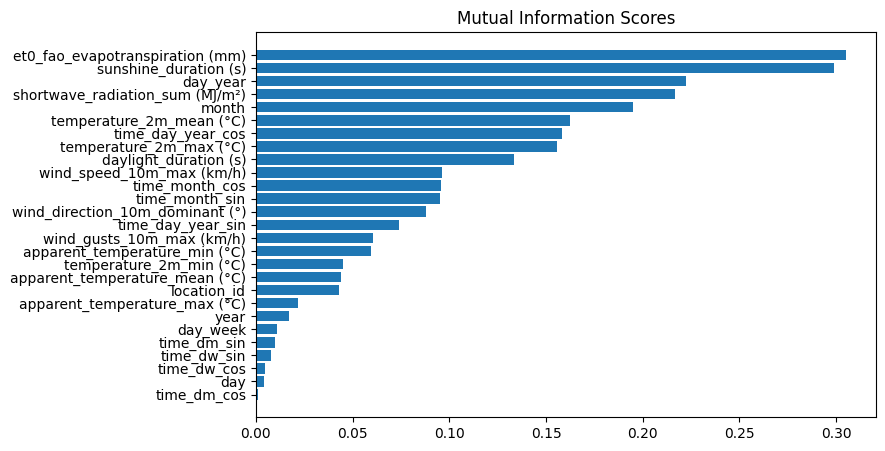

In [ ]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

##### Waktu Sunrise dan Sunset

Karena sunrise dan sunset itu kemungkinan besar di hari yang sama. Jadi tentu mengekstrasi semua fitur seperti tahun, bulan, dan lainnya akan redundant, jadi untuk kedua fitur ini hanya akan diekstrak, fitur jam, dan menit dari tengah malam, yang juga akan difeature engineering untuk mendapatkan transformasi trigonometrinya.

In [ ]:
def sunrise_sunset_preprocessing(_df:pd.DataFrame) -> pd.DataFrame:
    df = _df.copy()
    columns = ['sunrise (iso8601)', 'sunset (iso8601)']
    for feature in columns:
        time = pd.to_datetime(df[feature])
        df[feature] = time
        df['hour'] = time.dt.hour
        df['minutes_from_midnight'] = df['hour'] * 60 + time.dt.minute

        for time, col in zip([df['hour'], df['minutes_from_midnight']], ['hour', 'minutes']):
            time_range = {
                'hour': 24,
                'minutes': 1440,
            }

            df[f'{feature}_{col}_sin'] = np.sin(time * (2 * np.pi / time_range[col]))
            df[f'{feature}_{col}_cos'] = np.cos(time * (2 * np.pi / time_range[col]))

    return df

In [ ]:
daily_train = daily_train.pipe(sunrise_sunset_preprocessing)
daily_test = daily_test.pipe(sunrise_sunset_preprocessing)

* Mutual Information

et0_fao_evapotranspiration (mm)    0.306253
sunshine_duration (s)              0.298431
day_year                           0.219705
shortwave_radiation_sum (MJ/m²)    0.217207
month                              0.199564
temperature_2m_max (°C)            0.164526
time_day_year_cos                  0.157439
temperature_2m_mean (°C)           0.156047
daylight_duration (s)              0.131876
time_month_sin                     0.105765
minutes_from_midnight              0.100700
time_month_cos                     0.098843
sunset (iso8601)_minutes_cos       0.094349
wind_speed_10m_max (km/h)          0.093485
wind_direction_10m_dominant (°)    0.087211
sunset (iso8601)_minutes_sin       0.086689
time_day_year_sin                  0.067165
apparent_temperature_min (°C)      0.066332
wind_gusts_10m_max (km/h)          0.061813
temperature_2m_min (°C)            0.047810
apparent_temperature_mean (°C)     0.044348
location_id                        0.039709
sunset (iso8601)_hour_sin       

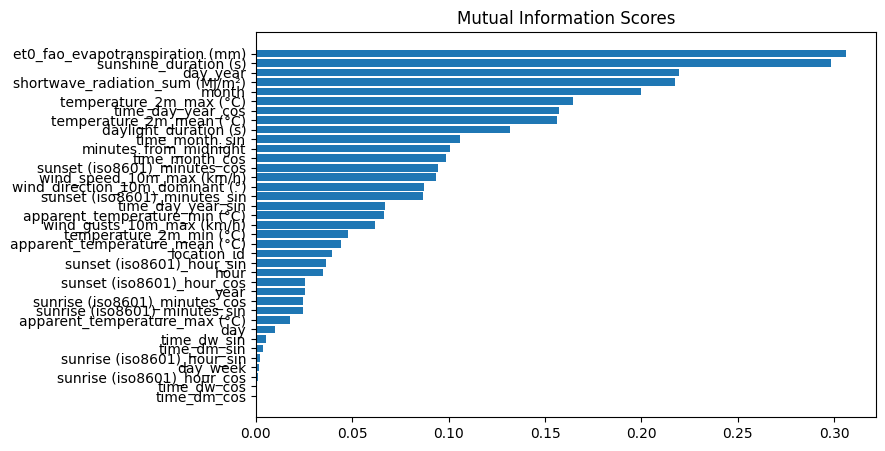

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
print(mi_scores)

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

##### Rata-rata dan Standar Deviasi Hujan Bulanan, Bulan tsb., Sebelum, dan Sesudah

Berdasarkan EDA, didapat bahwa untuk semua lokasi memiliki pola musiman di mana bulan yang sama pada tahun yang berbeda cenderung memiliki nilai curah hujan yang cenderung sama. Setiap lokasi memiliki perbedaan lonjakan/penurunan curah hujan setiap bulannya. Oleh karena itu, akan ditambahkan fitur-fitur ini.

In [ ]:
def calculate_monthly_rain_stats_with_neighbors(train_df: pd.DataFrame) -> pd.DataFrame:
    """
    Menghitung rata-rata dan standar deviasi curah hujan bulanan, termasuk bulan sebelumnya dan sesudahnya.

    Parameters:
        train_df (pd.DataFrame): DataFrame input yang memiliki kolom 'rain_sum (mm)', 'location_id', dan 'time'.

    Returns:
        pd.DataFrame: DataFrame dengan rata-rata dan standar deviasi curah hujan bulanan, bulan sebelumnya, dan bulan sesudahnya.
    """
    # Hitung rata-rata dan standar deviasi curah hujan per bulan per lokasi
    monthly_stats = (
        train_df.groupby(['location_id', 'month'])['rain_sum (mm)']
        .agg(rain_sum_month_avg='mean', rain_sum_month_std='std')
        .reset_index()
    )

    # Tambahkan kolom bulan sebelumnya dan sesudahnya
    monthly_stats['prev_month'] = monthly_stats['month'] - 1
    monthly_stats['next_month'] = monthly_stats['month'] + 1

    # Sesuaikan agar bulan tetap dalam rentang 1-12
    monthly_stats['prev_month'] = monthly_stats['prev_month'].replace(0, 12)
    monthly_stats['next_month'] = monthly_stats['next_month'].replace(13, 1)

    # Gabungkan rata-rata dan std untuk bulan sebelumnya
    prev_stats = monthly_stats[['location_id', 'month', 'rain_sum_month_avg', 'rain_sum_month_std']].rename(
        columns={
            'month': 'prev_month',
            'rain_sum_month_avg': 'rain_sum_prev_month_avg',
            'rain_sum_month_std': 'rain_sum_prev_month_std'
        }
    )
    monthly_stats = monthly_stats.merge(
        prev_stats,
        on=['location_id', 'prev_month'],
        how='left'
    )

    # Gabungkan rata-rata dan std untuk bulan sesudahnya
    next_stats = monthly_stats[['location_id', 'month', 'rain_sum_month_avg', 'rain_sum_month_std']].rename(
        columns={
            'month': 'next_month',
            'rain_sum_month_avg': 'rain_sum_next_month_avg',
            'rain_sum_month_std': 'rain_sum_next_month_std'
        }
    )
    monthly_stats = monthly_stats.merge(
        next_stats,
        on=['location_id', 'next_month'],
        how='left'
    )

    # Hapus kolom helper prev_month dan next_month
    monthly_stats.drop(columns=['prev_month', 'next_month'], inplace=True)

    return monthly_stats

def add_monthly_rain_stats_with_neighbors_to_df(train_df: pd.DataFrame, test_df: pd.DataFrame) -> (pd.DataFrame, pd.DataFrame):
    """
    Menambahkan kolom rata-rata dan standar deviasi curah hujan bulanan ke DataFrame pelatihan dan pengujian, termasuk bulan sebelumnya dan sesudahnya.

    Parameters:
        train_df (pd.DataFrame): DataFrame pelatihan yang memiliki kolom 'rain_sum (mm)', 'location_id', dan 'time'.
        test_df (pd.DataFrame): DataFrame pengujian yang akan ditambahkan kolom rata-rata dan standar deviasi.

    Returns:
        Tuple[pd.DataFrame, pd.DataFrame]: DataFrame pelatihan dan pengujian dengan kolom tambahan rata-rata dan standar deviasi.
    """
    # Hitung statistik curah hujan bulanan dari data pelatihan
    monthly_stats = calculate_monthly_rain_stats_with_neighbors(train_df)

    # Gabungkan statistik ke DataFrame pelatihan
    train_df['month'] = train_df['time'].dt.month
    train_df = train_df.merge(monthly_stats, on=['location_id', 'month'], how='left')

    # Gabungkan statistik ke DataFrame pengujian
    test_df['month'] = test_df['time'].dt.month
    test_df = test_df.merge(monthly_stats, on=['location_id', 'month'], how='left')

    return train_df, test_df

In [ ]:
daily_train, daily_test = add_monthly_rain_stats_with_neighbors_to_df(daily_train, daily_test)

* Mutual Information

et0_fao_evapotranspiration (mm)    0.308812
sunshine_duration (s)              0.296132
rain_sum_month_avg                 0.260634
rain_sum_month_std                 0.257837
rain_sum_next_month_avg            0.247202
rain_sum_prev_month_std            0.241064
rain_sum_next_month_std            0.237205
rain_sum_prev_month_avg            0.236813
day_year                           0.221199
shortwave_radiation_sum (MJ/m²)    0.214572
month                              0.199813
temperature_2m_mean (°C)           0.160307
temperature_2m_max (°C)            0.153786
time_day_year_cos                  0.153007
daylight_duration (s)              0.134600
minutes_from_midnight              0.104603
sunset (iso8601)_minutes_cos       0.098286
time_month_cos                     0.097054
wind_speed_10m_max (km/h)          0.094763
wind_direction_10m_dominant (°)    0.089629
time_month_sin                     0.087893
sunset (iso8601)_minutes_sin       0.086676
time_day_year_sin               

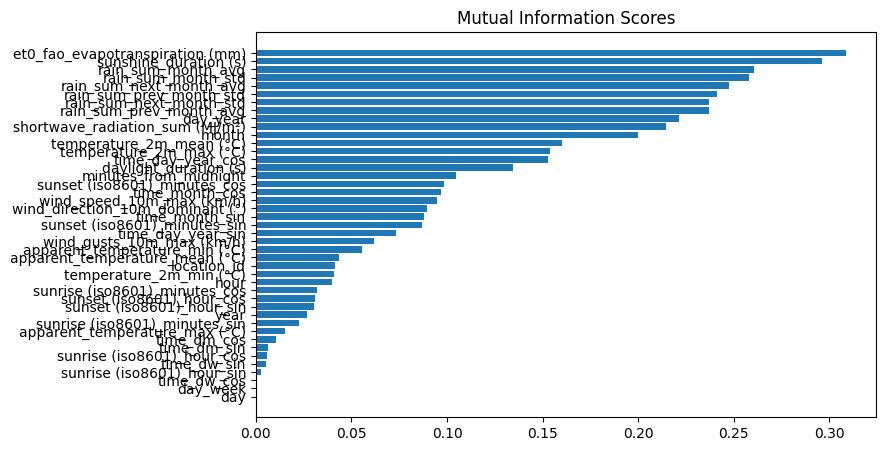

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
print(mi_scores)

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

##### Interaksi Lokasi dan Bulan, Tahun

Diketahui pola musiman berbeda di setiap location_id. Akan dibuat fitur yang mencerminkan interaksi antara waktu (dipilih bulan dan tahun) dan lokasi.

In [ ]:
def create_location_time_features(_df: pd.DataFrame) -> pd.DataFrame:
    """
    Membuat kolom `location_month` dan `location_year` yang merupakan gabungan dari
    `location_id` dengan `month` serta `year`.

    Parameters:
        _df (pd.DataFrame): DataFrame input yang memiliki kolom `location_id` dan `time`.

    Returns:
        pd.DataFrame: DataFrame dengan kolom tambahan `location_month` dan `location_year`.
    """
    df = _df.copy()

    # Gabungkan `location_id` dengan `month` untuk `location_month`
    df['location_month'] = df['location_id'].astype(str) + '_' + df['month'].astype(str)

    # Gabungkan `location_id` dengan `year` untuk `location_year`
    df['location_year'] = df['location_id'].astype(str) + '_' + df['year'].astype(str)

    return df

In [ ]:
# Menggunakan fungsi
daily_train = daily_train.pipe(create_location_time_features)
daily_test = daily_test.pipe(create_location_time_features)

et0_fao_evapotranspiration (mm)    0.310187
sunshine_duration (s)              0.296688
location_month                     0.265419
rain_sum_month_avg                 0.265122
rain_sum_month_std                 0.256396
rain_sum_next_month_avg            0.245174
rain_sum_prev_month_std            0.242567
rain_sum_next_month_std            0.242212
rain_sum_prev_month_avg            0.238610
day_year                           0.223094
shortwave_radiation_sum (MJ/m²)    0.213891
month                              0.208549
time_day_year_cos                  0.161366
temperature_2m_max (°C)            0.160567
temperature_2m_mean (°C)           0.159984
daylight_duration (s)              0.133052
sunset (iso8601)_minutes_cos       0.103149
minutes_from_midnight              0.098499
wind_speed_10m_max (km/h)          0.092727
time_month_cos                     0.092429
wind_direction_10m_dominant (°)    0.090770
time_month_sin                     0.090334
sunset (iso8601)_minutes_sin    

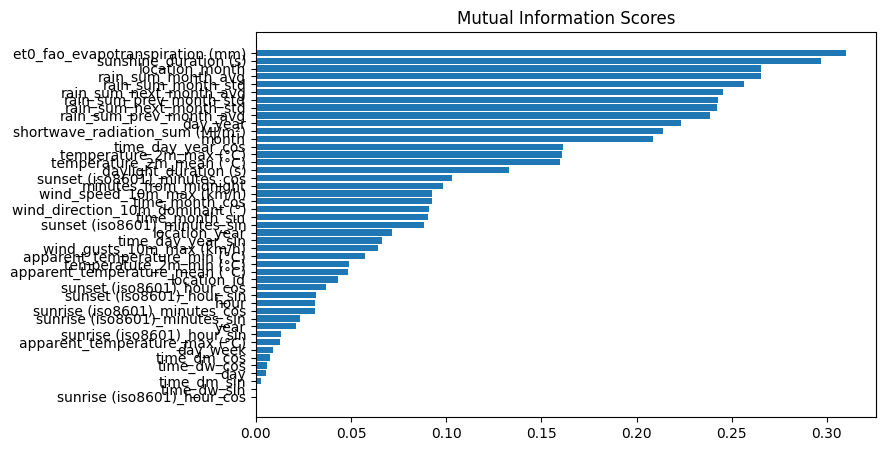

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
print(mi_scores)

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

##### Interaksi et0_fao_evapotranspiration (mm) dan sunshine_duration (s)

Pada EDA diketahui bahwa kedua variabel ini berkorelasi cukup tinggi dan keduanya memiliki mutual information yang tinggi. Oleh karena itu, akan dibuat kolom interaksi dari 2 variabel ini.

In [ ]:
def evapotranspiration_sunshine_preprocessing(_df: pd.DataFrame) -> pd.DataFrame:
    """
    Membuat variabel baru yang merupakan hasil perkalian antara
    'et0_fao_evapotranspiration (mm)' dan 'sunshine_duration (s)'.

    Parameters:
        _df (pd.DataFrame): DataFrame input yang memiliki kolom
                            'et0_fao_evapotranspiration (mm)' dan 'sunshine_duration (s)'.

    Returns:
        pd.DataFrame: DataFrame dengan kolom tambahan 'et0_sunshine_interaction'.
    """
    df = _df.copy()
    df['et0_sunshine_interaction'] = (
        df['et0_fao_evapotranspiration (mm)'] * df['sunshine_duration (s)']
    )
    return df

In [ ]:
daily_train = evapotranspiration_sunshine_preprocessing(daily_train)
daily_test = evapotranspiration_sunshine_preprocessing(daily_test)

et0_sunshine_interaction           0.334329
et0_fao_evapotranspiration (mm)    0.306700
sunshine_duration (s)              0.298146
rain_sum_month_avg                 0.266666
location_month                     0.266272
rain_sum_month_std                 0.257597
rain_sum_next_month_avg            0.248943
rain_sum_prev_month_std            0.244787
rain_sum_prev_month_avg            0.238177
rain_sum_next_month_std            0.235210
day_year                           0.221909
shortwave_radiation_sum (MJ/m²)    0.220020
month                              0.197722
temperature_2m_mean (°C)           0.165243
temperature_2m_max (°C)            0.159970
time_day_year_cos                  0.159710
daylight_duration (s)              0.133180
time_month_cos                     0.104408
minutes_from_midnight              0.103033
sunset (iso8601)_minutes_cos       0.101050
wind_speed_10m_max (km/h)          0.093251
sunset (iso8601)_minutes_sin       0.091743
wind_direction_10m_dominant (°) 

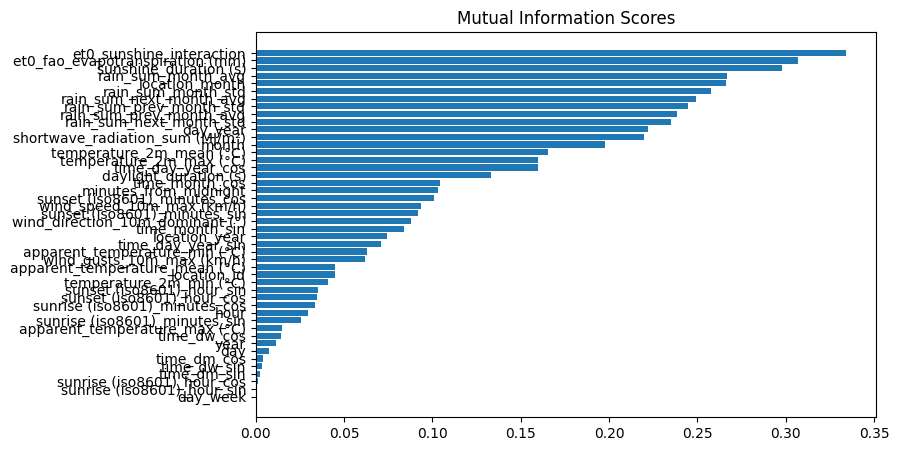

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
print(mi_scores)

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

### Feat Eng Fitur Kecepatan Angin

Fitur angin pada dataset yang diberikan adalah fitur yang sebenarnya dalam pair koordinat polar, jadi otomatis untuk memberikan sense of direction pada koordinat kartesian, fitur kecepatan angin, juga akan dilakukan transformasi menjadi fitur kecepatan angin dalam koordinat kartesian, hal ini akan dilakukan untuk data harian dan data per jam

In [ ]:
def wind_features_hour(_df:pd.DataFrame) -> pd.DataFrame:
    df = _df.copy()
    feature_1 = df['wind_speed_10m (km/h)']
    feature_1_1 = np.radians(df['wind_direction_10m (°)'])
    feature_2_1 = df['wind_speed_100m (km/h)']
    feature_2_2 = np.radians(df['wind_direction_100m (°)'])

    df["wind_speed_10m_x"] = feature_1 * np.cos(feature_1_1)
    df["wind_speed_10m_y"] = feature_1 * np.sin(feature_1_1)
    df["wind_speed_100m_x"] = feature_2_1 * np.cos(feature_2_2)
    df["wind_speed_100m_y"] = feature_2_1 * np.sin(feature_2_2)

    return df

def wind_features_day(_df:pd.DataFrame) -> pd.DataFrame:
    df = _df.copy()
    feature_1 = df['wind_speed_10m_max (km/h)']
    feature_1_1 = np.radians(df['wind_direction_10m_dominant (°)'])

    df["wind_speed_10m_max_x"] = feature_1 * np.cos(feature_1_1)
    df["wind_speed_10m_max_y"] = feature_1 * np.sin(feature_1_1)

    return df

In [ ]:
daily_train = daily_train.pipe(wind_features_day)
daily_test = daily_test.pipe(wind_features_day)

hourly_train = hourly_train.pipe(wind_features_hour)
hourly_test = hourly_test.pipe(wind_features_hour)

* Mutual Information

et0_sunshine_interaction           0.332758
et0_fao_evapotranspiration (mm)    0.313833
sunshine_duration (s)              0.298276
location_month                     0.263140
rain_sum_month_avg                 0.260308
rain_sum_month_std                 0.260052
rain_sum_next_month_avg            0.245420
rain_sum_prev_month_std            0.239740
rain_sum_next_month_std            0.237939
rain_sum_prev_month_avg            0.237674
day_year                           0.226736
shortwave_radiation_sum (MJ/m²)    0.215598
month                              0.198556
time_day_year_cos                  0.161419
temperature_2m_mean (°C)           0.160080
temperature_2m_max (°C)            0.151550
daylight_duration (s)              0.134287
wind_speed_10m_max_x               0.104269
time_month_cos                     0.099150
minutes_from_midnight              0.098171
sunset (iso8601)_minutes_cos       0.095694
wind_speed_10m_max_y               0.095439
time_month_sin                  

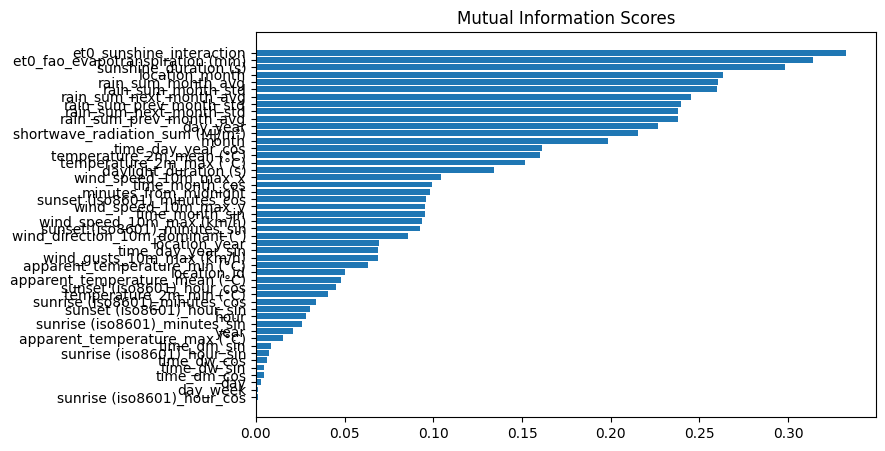

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
print(mi_scores)

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

### Feature Extraction Detail Lokasi dengan Data Lokasi

Setiap observasi cuaca berada di suatu lokasi yang data detail mengenai lokasi dan ketinggiannya ada di variabel location. Data itu akan kita join dengan data harian untuk menambah fitur lokasi.

In [ ]:
location_prefixed = location.add_prefix("location_")
location_prefixed = location_prefixed.rename(columns={"location_location_id": "location_id"})

daily_train = pd.merge(daily_train, location_prefixed, on='location_id', how='left')
daily_test = pd.merge(daily_test, location_prefixed, on='location_id', how='left')

* Mutual Information

et0_sunshine_interaction           0.332943
et0_fao_evapotranspiration (mm)    0.310473
sunshine_duration (s)              0.296705
location_month                     0.269092
rain_sum_month_avg                 0.266035
rain_sum_month_std                 0.253123
rain_sum_next_month_avg            0.248912
rain_sum_prev_month_std            0.243599
rain_sum_next_month_std            0.241805
rain_sum_prev_month_avg            0.241785
day_year                           0.220974
shortwave_radiation_sum (MJ/m²)    0.215470
month                              0.198077
temperature_2m_mean (°C)           0.160320
time_day_year_cos                  0.158188
temperature_2m_max (°C)            0.156254
daylight_duration (s)              0.134981
wind_speed_10m_max_x               0.106022
time_month_cos                     0.099342
wind_speed_10m_max (km/h)          0.096596
wind_speed_10m_max_y               0.095167
sunset (iso8601)_minutes_cos       0.094879
minutes_from_midnight           

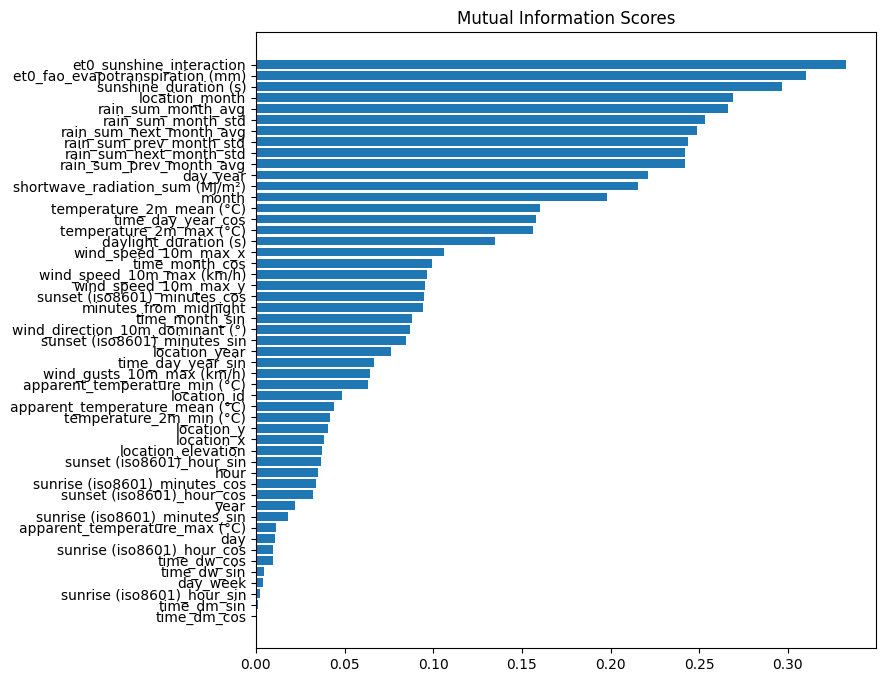

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
print(mi_scores)

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

plt.figure(dpi=100, figsize=(8, 8))
plot_mi_scores(mi_scores)

### hourly_train (lebih lanjut)

In [ ]:
hourly_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 472896 entries, 0 to 472895
Data columns (total 36 columns):
 #   Column                                   Non-Null Count   Dtype         
---  ------                                   --------------   -----         
 0   location_id                              472896 non-null  object        
 1   time                                     472896 non-null  datetime64[ns]
 2   temperature_2m (°C)                      472896 non-null  float64       
 3   relative_humidity_2m (%)                 472896 non-null  float64       
 4   dew_point_2m (°C)                        472896 non-null  float64       
 5   apparent_temperature (°C)                472896 non-null  float64       
 6   pressure_msl (hPa)                       472896 non-null  float64       
 7   surface_pressure (hPa)                   472896 non-null  float64       
 8   cloud_cover (%)                          472896 non-null  float64       
 9   cloud_cover_low (%)       

In [ ]:
hourly_train.describe()

,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),et0_fao_evapotranspiration (mm),vapour_pressure_deficit (kPa),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),soil_temperature_0_to_7cm (°C),soil_temperature_7_to_28cm (°C),soil_temperature_28_to_100cm (°C),soil_temperature_100_to_255cm (°C),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³),shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²),wind_speed_10m_x,wind_speed_10m_y,wind_speed_100m_x,wind_speed_100m_y
count,472896,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.00000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000,472896.000000
mean,2021-03-31 23:30:00.000001536,26.125369,80.197050,22.120930,30.288149,1010.239667,994.886063,76.288474,18.701072,23.328210,69.191165,0.166938,0.748719,7.466341,11.306078,187.29192,183.756968,18.136865,27.594788,27.510791,27.417522,27.431949,0.296058,0.283255,0.274918,0.319550,216.370004,145.336219,71.033739,204.303172,414.543402,-1.638956,-0.358872,-2.779550,-0.523503
min,2019-01-01 00:00:00,13.800000,12.000000,-3.000000,13.800000,1002.600000,927.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,1.000000,1.100000,16.900000,20.600000,22.000000,22.600000,0.000000,0.000000,0.000000,0.115000,0.000000,0.000000,0.000000,0.000000,0.000000,-36.742006,-34.154174,-56.583859,-48.034313
25%,2020-02-15 11:45:00,24.200000,73.000000,20.900000,28.200000,1008.900000,997.700000,58.000000,2.000000,3.000000,39.000000,0.000000,0.260000,3.900000,5.700000,112.00000,109.000000,9.700000,25.300000,26.100000,26.200000,26.200000,0.211000,0.186000,0.188000,0.253000,0.000000,0.000000,0.000000,0.000000,0.000000,-4.658019,-4.292346,-7.149743,-6.524416
50%,2021-03-31 23:30:00,25.800000,84.000000,22.700000,30.400000,1010.200000,1002.500000,94.000000,9.000000,13.000000,90.000000,0.040000,0.530000,6.100000,9.700000,192.00000,189.000000,16.600000,27.100000,27.500000,27.600000,27.700000,0.309000,0.298000,0.285000,0.322000,0.000000,0.000000,0.000000,0.000000,7.200000,-1.417192,-0.697246,-1.864920,-0.710739
75%,2022-05-16 11:15:00,28.000000,91.000000,23.700000,32.500000,1011.600000,1008.600000,100.000000,24.000000,32.000000,100.000000,0.310000,1.010000,10.100000,15.500000,262.00000,258.000000,24.500000,29.500000,28.900000,28.600000,28.800000,0.400000,0.393000,0.376000,0.384000,429.800000,240.700000,127.200000,420.800000,909.000000,1.823168,3.564026,2.504202,5.412017
max,2023-06-30 23:00:00,39.900000,100.000000,27.100000,43.100000,1018.200000,1015.900000,100.000000,100.000000,100.000000,100.000000,0.960000,6.010000,38.000000,56.800000,360.00000,360.000000,74.500000,45.500000,35.800000,33.400000,32.000000,0.520000,0.520000,0.520000,0.520000,1101.900000,1019.000000,493.600000,1021.400000,1397.000000,28.045517,28.817783,39.902609,42.143312
std,NaN,2.988995,14.045442,2.232395,3.512537,1.951204,22.866247,31.522674,25.067215,27.321911,37.430436,0.215084,0.676704,4.872953,7.325375,91.22342,89.838020,10.217621,3.507689,2.283365,1.995520,1.880864,0.124259,0.129549,0.119791,0.083452,295.071554,228.097132,94.680770,281.490249,504.052914,5.793076,6.566379,8.682559,9.904645


#### Plot Kolom pada Dataframe hourly_train

* Contoh: untuk location_id = 1. Plot 1 hari setiap tahun di mana memiliki rain paling BESAR dan SEDIKIT.

In [ ]:
filtered_data = daily_train[daily_train['location_id'] == 1]

top_rain = (
    filtered_data.loc[filtered_data.groupby('year')['rain_sum (mm)'].idxmax()]
)

lowest_rain = (
    filtered_data.loc[filtered_data.groupby('year')['rain_sum (mm)'].idxmin()]
)

top_rain_dates = top_rain['time'].dt.normalize()
lowest_rain_dates = lowest_rain['time'].dt.normalize()


hourly_filtered_top = hourly_train[
    (hourly_train['location_id'] == 1) &
    (hourly_train['time'].dt.floor('D').isin(top_rain_dates))
]

hourly_filtered_low = hourly_train[
    (hourly_train['location_id'] == 1) &
    (hourly_train['time'].dt.floor('D').isin(lowest_rain_dates))
]

numeric_columns = hourly_filtered_top.select_dtypes(include='float64').columns

num_cols = len(numeric_columns)
num_rows = (num_cols + 1) // 2
fig, axes = plt.subplots(num_rows, 4, figsize=(24, 4 * num_rows), sharex=True)

axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    for date in top_rain_dates:
        day_data = hourly_filtered_top[hourly_filtered_top['time'].dt.floor('D') == date]
        if not day_data.empty:
            axes[i * 2].plot(day_data['time'].dt.hour, day_data[col], label=str(date))

    axes[i * 2].set_title(f'Top Rain: {col} \n(Location 1)', fontsize=14, pad=15)
    axes[i * 2].set_ylabel(col, fontsize=12)
    axes[i * 2].legend(loc='upper left', bbox_to_anchor=(1, 1), title="Date", fontsize=10)
    axes[i * 2].set_xticks(range(24))

    for date in lowest_rain_dates:
        day_data = hourly_filtered_low[hourly_filtered_low['time'].dt.floor('D') == date]
        if not day_data.empty:
            axes[i * 2 + 1].plot(day_data['time'].dt.hour, day_data[col], label=str(date))

    axes[i * 2 + 1].set_title(f'Lowest Rain: {col} \n(Location 1)', fontsize=14, pad=15)
    axes[i * 2 + 1].set_ylabel(col, fontsize=12)
    axes[i * 2 + 1].legend(loc='upper left', bbox_to_anchor=(1, 1), title="Date", fontsize=10)
    axes[i * 2 + 1].set_xticks(range(24))

axes[-1].set_xlabel('Hour', fontsize=12)
plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

* location_id = 8

In [ ]:
import matplotlib.pyplot as plt

filtered_data = daily_train[daily_train['location_id'] == 8]

top_rain = (
    filtered_data.loc[filtered_data.groupby('year')['rain_sum (mm)'].idxmax()]
)

lowest_rain = (
    filtered_data.loc[filtered_data.groupby('year')['rain_sum (mm)'].idxmin()]
)

top_rain_dates = top_rain['time'].dt.normalize()
lowest_rain_dates = lowest_rain['time'].dt.normalize()

hourly_filtered_top = hourly_train[
    (hourly_train['location_id'] == 1) &
    (hourly_train['time'].dt.floor('D').isin(top_rain_dates))
]

hourly_filtered_low = hourly_train[
    (hourly_train['location_id'] == 1) &
    (hourly_train['time'].dt.floor('D').isin(lowest_rain_dates))
]

numeric_columns = hourly_filtered_top.select_dtypes(include='float64').columns

num_cols = len(numeric_columns)
num_rows = (num_cols + 1) // 2
fig, axes = plt.subplots(num_rows, 4, figsize=(24, 4 * num_rows), sharex=True)

axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    for date in top_rain_dates:
        day_data = hourly_filtered_top[hourly_filtered_top['time'].dt.floor('D') == date]
        if not day_data.empty:
            axes[i * 2].plot(day_data['time'].dt.hour, day_data[col], label=str(date))

    axes[i * 2].set_title(f'Top Rain: {col} \n(Location 1)', fontsize=14, pad=15)
    axes[i * 2].set_ylabel(col, fontsize=12)
    axes[i * 2].legend(loc='upper left', bbox_to_anchor=(1, 1), title="Date", fontsize=10)
    axes[i * 2].set_xticks(range(24))

    for date in lowest_rain_dates:
        day_data = hourly_filtered_low[hourly_filtered_low['time'].dt.floor('D') == date]
        if not day_data.empty:
            axes[i * 2 + 1].plot(day_data['time'].dt.hour, day_data[col], label=str(date))

    axes[i * 2 + 1].set_title(f'Lowest Rain: {col} \n(Location 1)', fontsize=14, pad=15)
    axes[i * 2 + 1].set_ylabel(col, fontsize=12)
    axes[i * 2 + 1].legend(loc='upper left', bbox_to_anchor=(1, 1), title="Date", fontsize=10)
    axes[i * 2 + 1].set_xticks(range(24))

axes[-1].set_xlabel('Hour', fontsize=12)

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

#### Drop Kolom Dataframe Daily yang Serupa dengan Dataframe Hourly

In [ ]:
related_columns = [
    "temperature_2m_max (°C)",
    "temperature_2m_min (°C)",
    "temperature_2m_mean (°C)",
    "apparent_temperature_max (°C)",
    "apparent_temperature_min (°C)",
    "apparent_temperature_mean (°C)",
    "wind_speed_10m_max (km/h)",
    "wind_gusts_10m_max (km/h)",
    "shortwave_radiation_sum (MJ/m²)"
]

# et0_fao_evapotranspiration tidak dihapus

In [ ]:
daily_train = daily_train.drop(columns=related_columns)
daily_test = daily_test.drop(columns=related_columns)

#### Feature Aggregation Persentase Tutupan Awan > 75%

Tutupan awan yang besar menjadi indikasi kuat terjadi hujan.

In [ ]:
def add_cloud_cover_to_daily(daily_df, hourly_df, cloud_columns):
    """
    Menambahkan kolom persentase cloud cover > 75% ke DataFrame daily berdasarkan data hourly.
    Tidak membuat kolom tambahan pada DataFrame input.

    Parameters:
        daily_df (pd.DataFrame): DataFrame daily (daily_train atau daily_test).
        hourly_df (pd.DataFrame): DataFrame hourly (hourly_train atau hourly_test).
        cloud_columns (list): Daftar kolom cloud cover yang akan dihitung persentasenya.

    Returns:
        pd.DataFrame: DataFrame baru dengan kolom tambahan untuk persentase cloud cover > 75%.
    """
    # Konversi kolom 'time' menjadi datetime di kedua DataFrame
    hourly_df_time = pd.to_datetime(hourly_df['time'])
    daily_df_time = pd.to_datetime(daily_df['time'])

    # Ekstrak tanggal dari kolom 'time' tanpa mengubah DataFrame asli
    hourly_dates = hourly_df_time.dt.date
    daily_dates = daily_df_time.dt.date

    # DataFrame untuk menyimpan hasil perhitungan persentase cloud cover > 75%
    cloud_percentages = pd.DataFrame({'date': hourly_dates.unique()})

    for col in cloud_columns:
        col_name = f"{col.split(' ')[0]}_percent_above_75"
        percentage = (
            hourly_df.loc[hourly_df[col] > 75]
            .groupby(hourly_dates)[col]
            .count()
            / hourly_df.groupby(hourly_dates)[col].count()
        ).reset_index(name=col_name)
        percentage.rename(columns={'time': 'date'}, inplace=True)
        # Gabungkan hasil perhitungan ke cloud_percentages
        cloud_percentages = cloud_percentages.merge(percentage, on='date', how='left')

    # Isi nilai NaN dengan 0 untuk hari tanpa data cloud cover > 75%
    cloud_percentages.fillna(0, inplace=True)

    # Gabungkan dengan daily_df menggunakan tanggal
    result_df = daily_df.copy()
    result_df = result_df.merge(cloud_percentages, left_on=daily_dates, right_on='date', how='left')

    # Hapus kolom 'date' sebelum mengembalikan DataFrame baru
    result_df.drop(columns=['date'], inplace=True)

    return result_df

In [ ]:
cloud_columns = ["cloud_cover (%)", "cloud_cover_low (%)", "cloud_cover_mid (%)", "cloud_cover_high (%)"]

daily_train_new = add_cloud_cover_to_daily(daily_train, hourly_train, cloud_columns)
daily_test_new = add_cloud_cover_to_daily(daily_test, hourly_test, cloud_columns)

et0_sunshine_interaction             0.332369
et0_fao_evapotranspiration (mm)      0.305465
sunshine_duration (s)                0.296448
location_month                       0.267338
rain_sum_month_avg                   0.259817
rain_sum_next_month_avg              0.253475
rain_sum_month_std                   0.252514
rain_sum_prev_month_std              0.245449
rain_sum_prev_month_avg              0.240307
rain_sum_next_month_std              0.236295
day_year                             0.226264
cloud_cover_high_percent_above_75    0.217408
cloud_cover_percent_above_75         0.210988
month                                0.200454
cloud_cover_mid_percent_above_75     0.184552
time_day_year_cos                    0.160725
daylight_duration (s)                0.131289
time_month_cos                       0.106913
wind_speed_10m_max_x                 0.105231
time_month_sin                       0.103642
sunset (iso8601)_minutes_cos         0.102467
minutes_from_midnight             

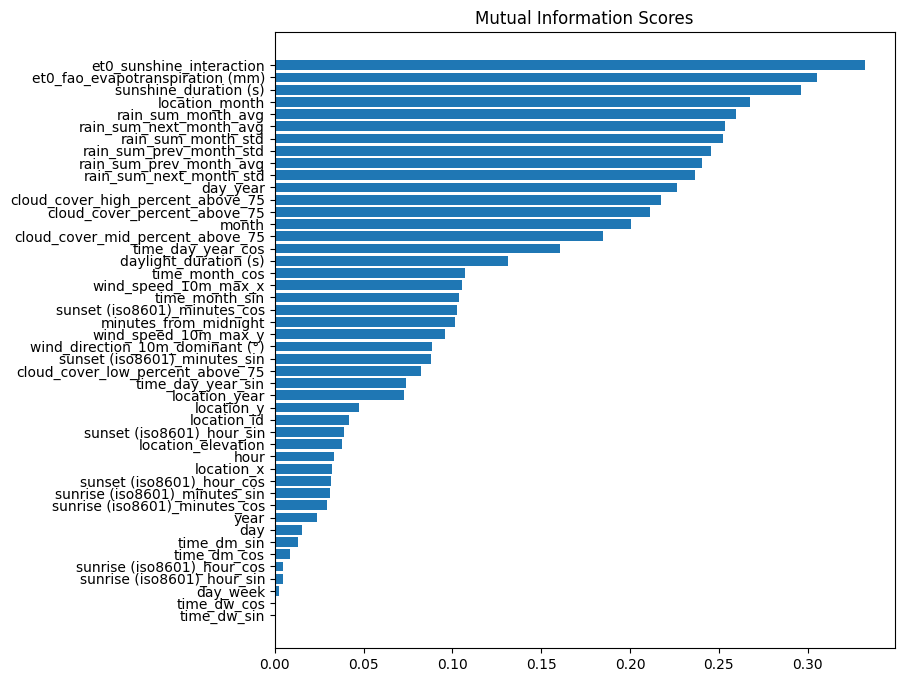

In [ ]:
# Mutual Information
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = daily_train_new.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
print(mi_scores)

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

plt.figure(dpi=100, figsize=(8, 8))
plot_mi_scores(mi_scores)

#### Feature Aggregation dari Data Fitur Per Jam

Data per jam dapat menjadi informasi tambahan untuk data harian yang sudah ada.

In [ ]:
def min_max_diff(series):
    return series.max() - series.min()

def aggregate_hourly_merge(df_hourly, df_daily):
    df_hourly['date'] = pd.to_datetime(df_hourly['time']).dt.date
    df_daily['date'] = pd.to_datetime(df_daily['time']).dt.date

    agg_functions = {
        'temperature_2m (°C)': ['min', 'max', 'mean', 'std'],
        'relative_humidity_2m (%)': ['mean', 'max', 'min', 'std'],
        'dew_point_2m (°C)': ['mean', 'min', 'max', 'std'],
        'apparent_temperature (°C)': ['mean', 'min', 'max', 'std'],
        'pressure_msl (hPa)': ['mean', 'min', 'max', 'std'],
        'surface_pressure (hPa)': ['mean', 'min', 'max', 'std'],
        'cloud_cover (%)': ['mean', 'max', 'min', 'std'],
        'cloud_cover_low (%)': ['mean', 'max', 'min', 'std'],
        'cloud_cover_mid (%)': ['mean', 'max', 'min', 'std'],
        'cloud_cover_high (%)': ['mean', 'max', 'min', 'std'],
        'et0_fao_evapotranspiration (mm)': ['mean', 'min', 'max', 'std'],
        'vapour_pressure_deficit (kPa)': ['mean', 'min', 'max', 'std'],
        'wind_speed_10m (km/h)': ['mean', 'max', 'min', 'std'],
        'wind_speed_100m (km/h)': ['mean', 'max', 'min', 'std'],
        'wind_direction_10m (°)': ['mean', 'max', 'min'],
        'wind_direction_100m (°)': ['mean', 'max', 'min'],
        'wind_gusts_10m (km/h)': ['max', 'mean'],
        'soil_temperature_0_to_7cm (°C)': ['mean', 'min', 'max', 'std'],
        'soil_temperature_7_to_28cm (°C)': ['mean', 'min', 'max', 'std'],
        'soil_temperature_28_to_100cm (°C)': ['mean', 'min', 'max', 'std'],
        'soil_temperature_100_to_255cm (°C)': ['mean', 'min', 'max', 'std'],
        'soil_moisture_0_to_7cm (m³/m³)': ['mean', 'min', 'max', 'std'],
        'soil_moisture_7_to_28cm (m³/m³)': ['mean', 'min', 'max', 'std'],
        'soil_moisture_28_to_100cm (m³/m³)': ['mean', 'min', 'max', 'std'],
        'soil_moisture_100_to_255cm (m³/m³)': ['mean', 'min', 'max', 'std'],
        'shortwave_radiation_instant (W/m²)': ['mean', 'max', 'min', 'std'],
        'direct_radiation_instant (W/m²)': ['mean', 'max', 'min', 'std', 'sum'],
        'diffuse_radiation_instant (W/m²)': ['mean', 'max', 'min', 'std', 'sum'],
        'direct_normal_irradiance_instant (W/m²)': ['mean', 'max', 'min', 'std', 'sum'],
        'terrestrial_radiation_instant (W/m²)': ['mean', 'max', 'min', 'std', 'sum'],
        'wind_speed_10m_x': ['mean', 'max', 'min', 'std'],
        'wind_speed_10m_y': ['mean', 'max', 'min', 'std'],
        'wind_speed_100m_x': ['mean', 'max', 'min', 'std'],
        'wind_speed_100m_y': ['mean', 'max', 'min', 'std'],
    }

    hourly_aggregated = df_hourly.groupby(['location_id', 'date']).agg(agg_functions)
    hourly_aggregated.columns = ['_'.join(col).strip() for col in hourly_aggregated.columns]
    hourly_aggregated.reset_index(inplace=True)

    final_df = df_daily.merge(hourly_aggregated, how='left', on=['location_id', 'date'])
    final_df.drop(columns=['date'], inplace=True)

    return final_df

In [ ]:
# Menggunakan fungsi untuk menghasilkan dataset akhir
final_train = aggregate_hourly_merge(hourly_train, daily_train_new)
final_test = aggregate_hourly_merge(hourly_test, daily_test_new)

* Mutual Information

In [ ]:
columns_to_exclude = ['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)']
X = final_train.drop(columns=columns_to_exclude)
y = X.pop('rain_sum (mm)')

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
pd.set_option('display.max_rows', None)
mi_scores

,MI Scores
relative_humidity_2m (%)_mean,0.530357
soil_moisture_0_to_7cm (m³/m³)_max,0.475502
vapour_pressure_deficit (kPa)_mean,0.467898
relative_humidity_2m (%)_min,0.385502
direct_normal_irradiance_instant (W/m²)_mean,0.377452
direct_normal_irradiance_instant (W/m²)_sum,0.377382
cloud_cover_mid (%)_mean,0.368730
vapour_pressure_deficit (kPa)_max,0.346093
et0_sunshine_interaction,0.334013
direct_normal_irradiance_instant (W/m²)_std,0.323391


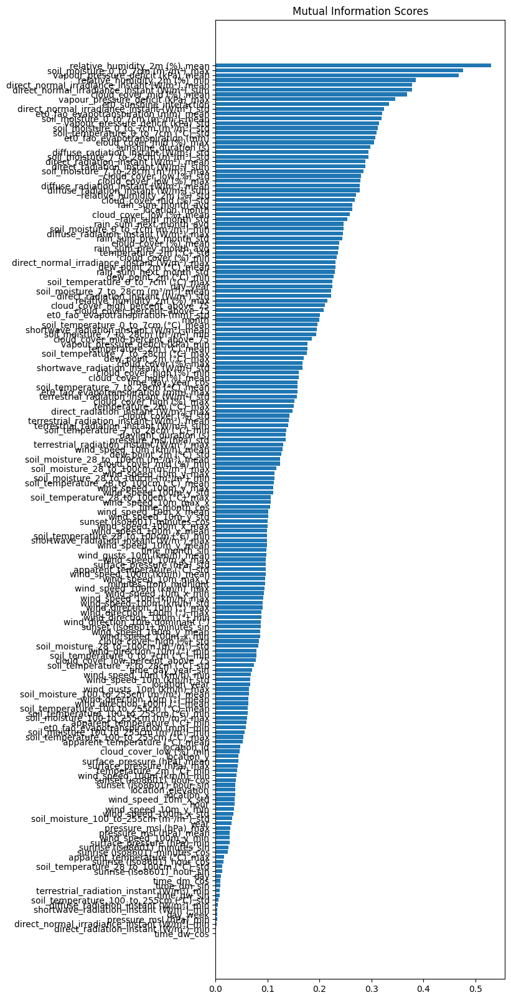

In [ ]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")
plt.figure(dpi=100, figsize=(6, 20))
plot_mi_scores(mi_scores)

# Modelling

## Final Preparation Dataset

* Distribusi setiap kolom

In [ ]:
# final_train
df = final_train.copy()
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

cols_per_row = 3
num_cols = len(numeric_columns)
num_rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(18, 5 * num_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    ax = axes[i]
    ax.hist(df[col].dropna(), bins=30, color='skyblue', alpha=0.7, edgecolor='black')
    ax.set_title(f"Histogram of {col}", fontsize=14)
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)

for j in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# final_test
df = final_test.copy()

numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

cols_per_row = 3
num_cols = len(numeric_columns)
num_rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(18, 5 * num_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    ax = axes[i]
    ax.hist(df[col].dropna(), bins=30, color='skyblue', alpha=0.7, edgecolor='black')
    ax.set_title(f"Histogram of {col}", fontsize=14)
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)

for j in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Transformasi Fitur/Prediktor

Pada visualisasi, terlihat banyak sekali fitur yang skew

In [ ]:
# Gabungkan final_train dan final_test untuk fitur (tanpa target)
all_features = pd.concat([final_train.drop(columns=['rain_sum (mm)']), final_test], axis=0)

numeric_dtypes = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric_features = all_features.select_dtypes(include=numeric_dtypes).columns
skew_features = all_features[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)

# Ambil fitur dengan skewness > 0.5
high_skew = skew_features[skew_features > 0.5]
skew_index = high_skew.index

print(f"There are {high_skew.shape[0]} numerical features with Skew > 0.5:")
print(high_skew)

There are 69 numerical features with Skew > 0.5:
diffuse_radiation_instant (W/m²)_max           142.574194
shortwave_radiation_instant (W/m²)_max         126.915890
diffuse_radiation_instant (W/m²)_std           100.560642
direct_normal_irradiance_instant (W/m²)_max     97.489514
direct_normal_irradiance_instant (W/m²)_std     71.373223
                                                  ...    
surface_pressure (hPa)_std                       0.595283
rain_sum_next_month_avg                          0.569673
rain_sum_month_avg                               0.554407
relative_humidity_2m (%)_std                     0.550879
rain_sum_prev_month_avg                          0.503253
Length: 69, dtype: float64


In [ ]:
# Normalisasi fitur yang skewed menggunakan Box-Cox, kecuali jika ada nilai negatif (Dari EDA diketahui kalau yang negatif itu hasil dari sin/cos)
for i in skew_index:
    # Periksa apakah ada nilai negatif
    min_value = all_features[i].min()
    if min_value < 0:
        print(f"Skipping Box-Cox transform for {i} due to negative values.")
        continue  # Lewati transformasi jika ada nilai negatif

    # Terapkan transformasi Box-Cox (0 tetap dihitung)
    all_features[i] = boxcox1p(all_features[i], boxcox_normmax(all_features[i] + 1))

final_train_normalized = all_features.iloc[:len(final_train), :]
final_test_normalized = all_features.iloc[len(final_train):, :]

final_train_normalized['rain_sum (mm)'] = final_train['rain_sum (mm)']

# Hasil
print("Normalization completed.")

Skipping Box-Cox transform for sunset (iso8601)_hour_cos due to negative values.
Skipping Box-Cox transform for sunset (iso8601)_minutes_sin due to negative values.
Normalization completed.


<ipython-input-161-30dad511c2d3>:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  final_train_normalized['rain_sum (mm)'] = final_train['rain_sum (mm)']
<ipython-input-161-30dad511c2d3>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_train_normalized['rain_sum (mm)'] = final_train['rain_sum (mm)']


In [ ]:
final_train_new = final_train_normalized.copy()
final_test_new = final_test_normalized.copy()

In [ ]:
# Diketahui pada EDA, distribusi dari curah hujan sangatlah skew. Akan dilakukan transformasi log

# Feature has 0.0 values, use np.log1p (log(1+x)) instead of np.log
final_train_new["LogRainSum"] = final_train_new["rain_sum (mm)"].apply(np.log1p)

In [ ]:
final_train_new.drop(columns=['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)'], inplace=True)
final_test_new.drop(columns=['ID', 'time', 'sunrise (iso8601)', 'sunset (iso8601)'], inplace=True)

In [ ]:
X = final_train_new.drop(columns=[LABEL, "LogRainSum"])
y = final_train_new["LogRainSum"]

In [ ]:
# Identifikasi kolom bertipe object atau category
categorical_columns = X.select_dtypes(include=['object', 'category']).columns

# Iterasi untuk setiap kolom kategori
for col in categorical_columns:
    # Lakukan Label Encoding
    final_test_new[col] = final_test_new[col].astype('category').cat.codes
    X[col] = X[col].astype('category').cat.codes

print("Encoding selesai untuk kolom kategori:", categorical_columns.tolist())

Encoding selesai untuk kolom kategori: ['location_id', 'location_month', 'location_year']


### Save Dataset

In [ ]:
# Simpan Dataset

X_csv = X.copy()
X_csv["LogRainSum"] = y
X_csv.to_csv('train_wichu.csv', index=False)

final_test_new.to_csv('test_wichu.csv', index=False)

## Model Selection

Kita akan mencoba model mana yang cocok dengan dataset yang sudah kita proses

In [ ]:
# Definisikan dictionary untuk regresor
regressors = {
    'LinearRegression': linear_model.LinearRegression(),
    'Ridge': linear_model.Ridge(random_state=SEED),
    'Lasso': linear_model.Lasso(random_state=SEED),
    'ElasticNet': linear_model.ElasticNet(random_state=SEED),
    'CatBoostRegressor': cb.CatBoostRegressor(random_state=SEED, verbose=0),
    'LGBMRegressor': lgbm.LGBMRegressor(random_state=SEED, verbose=-1),
    'XGBRegressor': xgb.XGBRegressor(random_state=SEED, verbosity=0),
    'ExtraTreesRegressor': ensemble.ExtraTreesRegressor(random_state=SEED, n_jobs=-1),
    'RandomForestRegressor': ensemble.RandomForestRegressor(random_state=SEED, n_jobs=-1),
    'GradientBoosting': ensemble.GradientBoostingRegressor(random_state=SEED)
}

Cross Validation yang akan digunakan adalah dengan KFold

In [ ]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

def evaluate_model(model, X, y):
    mse_scores = -cvs(model, X, y, cv=kf, scoring='neg_mean_squared_error')
    return mse_scores

mse_results = {}
perf_results = {}

for name, model in regressors.items():
    start = time.perf_counter()
    mse_results[name] = evaluate_model(model, X, y)
    end = time.perf_counter()
    perf_results[name] = end - start

for name, mse in mse_results.items():
    print(f"{name} MSE: {np.mean(mse):.4f} ± {np.std(mse):.4f}")
    print(f"{name} Max MSE: {np.max(mse):.4f}, Min MSE: {np.min(mse):.4f}")
    print(f"{name} Time: {perf_results[name]} secs")

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.062e+02, tolerance: 1.944e+02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.429e+02, tolerance: 1.857e+02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.839e+02, tolerance: 1.861e

LinearRegression MSE: 46.4990 ± 12.7454
LinearRegression Max MSE: 64.4987, Min MSE: 34.1690
LinearRegression Time: 4.2485310080010095 secs
Ridge MSE: 55.3306 ± 13.1059
Ridge Max MSE: 71.4305, Min MSE: 41.0116
Ridge Time: 0.4108966550011246 secs
Lasso MSE: 71.0918 ± 14.7081
Lasso Max MSE: 88.0430, Min MSE: 54.0306
Lasso Time: 8.166184955998688 secs
ElasticNet MSE: 69.8742 ± 14.6298
ElasticNet Max MSE: 87.0502, Min MSE: 53.1449
ElasticNet Time: 11.528043734000676 secs
CatBoostRegressor MSE: 30.0271 ± 10.1323
CatBoostRegressor Max MSE: 43.3550, Min MSE: 18.2948
CatBoostRegressor Time: 153.0548792539994 secs
LGBMRegressor MSE: 30.3041 ± 9.1682
LGBMRegressor Max MSE: 42.4928, Min MSE: 21.2580
LGBMRegressor Time: 11.30597526299971 secs
XGBRegressor MSE: 35.6833 ± 12.2379
XGBRegressor Max MSE: 55.2904, Min MSE: 23.2464
XGBRegressor Time: 20.54217871199944 secs
ExtraTreesRegressor MSE: 41.8428 ± 11.7624
ExtraTreesRegressor Max MSE: 60.0913, Min MSE: 28.7122
ExtraTreesRegressor Time: 199.979650

Akan digunakan CatBoost sebagai model yang dipilih.

## Feature Importance Best Model (Currently)

In [ ]:
best_estimator = cb.CatBoostRegressor(random_state=SEED, verbose=0)
best_estimator.fit(X, y)

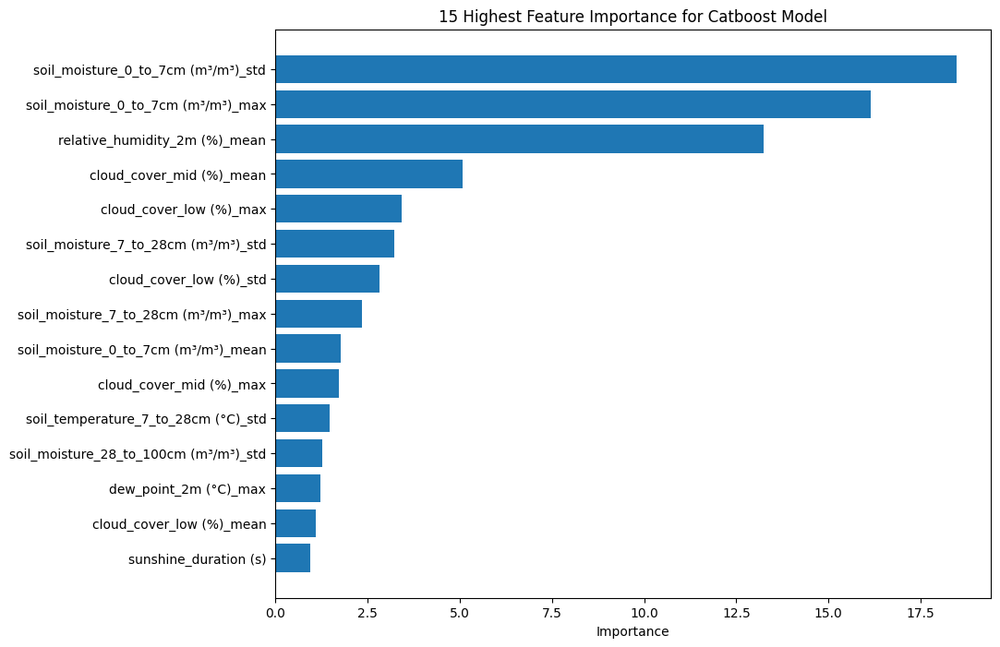

In [ ]:
feat_importance = best_estimator.get_feature_importance()
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feat_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
feature_importance_df1 = feature_importance_df[:15]

plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df1['Feature'], feature_importance_df1['Importance'])
plt.xlabel('Importance')
plt.title('15 Highest Feature Importance for Catboost Model')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
feature_importance_df

,Feature,Importance
129,soil_moisture_0_to_7cm (m³/m³)_std,18.478562
128,soil_moisture_0_to_7cm (m³/m³)_max,16.139646
50,relative_humidity_2m (%)_mean,13.243023
78,cloud_cover_mid (%)_mean,5.075011
75,cloud_cover_low (%)_max,3.437613
133,soil_moisture_7_to_28cm (m³/m³)_std,3.227572
77,cloud_cover_low (%)_std,2.821986
132,soil_moisture_7_to_28cm (m³/m³)_max,2.343517
126,soil_moisture_0_to_7cm (m³/m³)_mean,1.773914
79,cloud_cover_mid (%)_max,1.736283


## SHAP Best Model (Currently)

In [ ]:
shap.initjs()

explainer = shap.TreeExplainer(best_estimator)
shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.force(shap_values[0, ...])

In [ ]:
# visualize the training set predictions
shap.plots.force(shap_values)

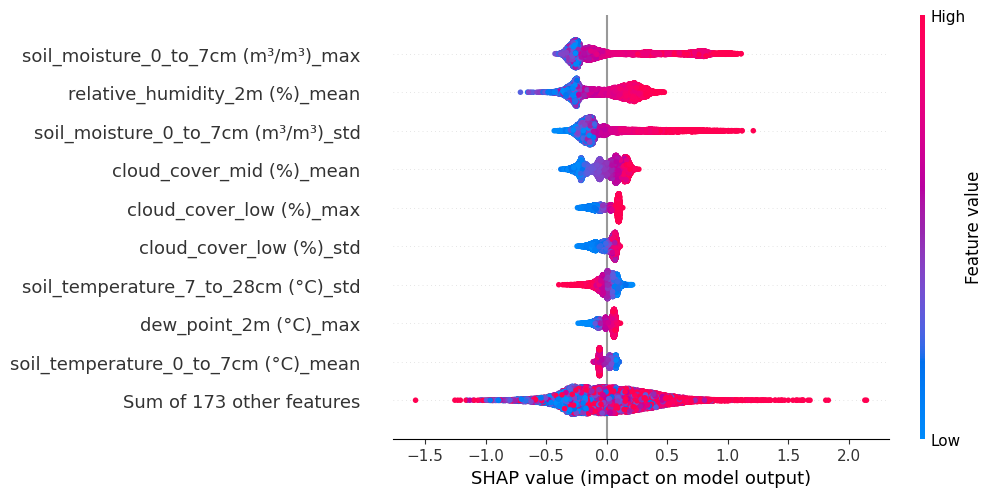

In [ ]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values)

## Cek Overfitting Best Model (Currently)

In [ ]:
# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=SEED)

In [ ]:
# Create CatBoost Pools
train_data = Pool(data=X_train, label=y_train)
eval_data = Pool(data=X_val, label=y_val)

In [ ]:
# CARA LAIN
val_pool = Pool(X_val, y_val)

# Initialize CatBoostRegressor
model2 = cb.CatBoostRegressor(
    od_type="Iter",           # Overfitting detector type
    od_wait=20,                # Number of iterations to wait before stopping
    loss_function='RMSE',
    random_state = SEED
)

# Train the model
model2.fit(X_train, y_train, eval_set=val_pool, verbose=False)

In [ ]:
# Evaluate model
rmse = np.sqrt(((model2.predict(X_val) - y_val) ** 2).mean())
print(f'Validation RMSE: {rmse:.2f}')

Validation RMSE: 0.33


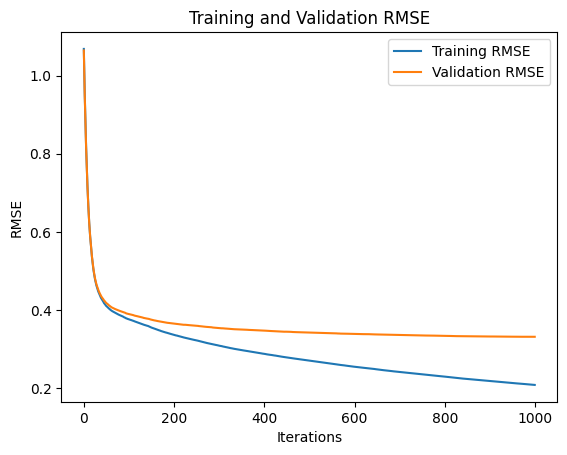

In [ ]:
# Plot training and validation error
plt.plot(model2.get_evals_result()['learn']['RMSE'], label='Training RMSE')
plt.plot(model2.get_evals_result()['validation']['RMSE'], label='Validation RMSE')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('Training and Validation RMSE')
plt.legend()
plt.show()

## Final Training, Save Model, Prediction, Postprocessing, and Submission

In [ ]:
final_model = cb.CatBoostRegressor(loss_function='RMSE', random_state=SEED, verbose=100)
final_model.fit(X, y)

Learning rate set to 0.065572
0:	learn: 1.0779424	total: 160ms	remaining: 2m 40s
100:	learn: 0.3848413	total: 9.45s	remaining: 1m 24s
200:	learn: 0.3491650	total: 21.7s	remaining: 1m 26s
300:	learn: 0.3231286	total: 33.9s	remaining: 1m 18s
400:	learn: 0.3053683	total: 44.2s	remaining: 1m 6s
500:	learn: 0.2899120	total: 56.8s	remaining: 56.5s
600:	learn: 0.2767193	total: 1m 7s	remaining: 44.9s
700:	learn: 0.2651847	total: 1m 16s	remaining: 32.6s
800:	learn: 0.2549440	total: 1m 29s	remaining: 22.1s
900:	learn: 0.2458006	total: 1m 41s	remaining: 11.1s
999:	learn: 0.2367454	total: 1m 49s	remaining: 0us


In [ ]:
with open("akhirandahcapek.pkl", "wb") as file:
    pickle.dump(final_model, file)

In [ ]:
with open("akhirandahcapek.pkl", "rb") as file:
    final_cb_model = pickle.load(file)

In [ ]:
pred = final_cb_model.predict(final_test_new)

In [ ]:
pred1 = np.exp(pred) - 1

In [ ]:
submission = pd.read_csv(f'{directory}/sample_submission.csv')
submission['rain_sum (mm)'] = np.maximum(0, pred1) # Sedikit postprocessing karena curah hujan tidak mungkin negatif
submission.to_csv('akhirandahcapek.csv', index=False)

# [HASIL AKHIR] Disubmit ke Kaggle: Hasil Hyperparameter Tuning

## Hyperparameter Tuning

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=SEED)

In [ ]:
def objective(trial):
    params = {
        "iterations": 1000,
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "depth": trial.suggest_int("depth", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.05, 1.0),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
    }

    model = cb.CatBoostRegressor(**params, silent=True, random_state=SEED)
    model.fit(X_train, y_train)
    predictions = model.predict(X_val)
    rmse = mean_squared_error(y_val, predictions, squared=False)
    return rmse

In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=30)

[I 2024-11-26 21:01:35,156] A new study created in memory with name: no-name-8544954f-9db1-42ff-a7e2-1ef854322cd7
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
[I 2024-11-26 21:04:25,603] Trial 0 finished with value: 0.3504680610136416 and parameters: {'learning_rate': 0.01713394968698957, 'depth': 8, 'subsample': 0.9364272168733775, 'colsample_bylevel': 0.35789401028774503, 'min_data_in_leaf': 48}. Best is trial 0 with value: 0.3504680610136416.
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
[I 2024-11-26 21:04:59,108] Trial 1 finished with value: 0.3428692358483372

In [ ]:
print('Best hyperparameters:', study.best_params)
print('Best RMSE:', study.best_value)

Best hyperparameters: {'learning_rate': 0.09493323664366395, 'depth': 4, 'subsample': 0.5351568536704181, 'colsample_bylevel': 0.7256431104865017, 'min_data_in_leaf': 37}
Best RMSE: 0.33668817656734407


In [ ]:
# Best hyperparameters
best_params = {
    'learning_rate': 0.09493323664366395,
    'depth': 4,
    'subsample': 0.5351568536704181,
    'colsample_bylevel': 0.7256431104865017,
    'min_data_in_leaf': 37
}

In [ ]:
# Membuat model CatBoost dengan hyperparameters terbaik
hyperparameter_model = cb.CatBoostRegressor(
    **best_params,  # Menggunakan hyperparameters yang telah ditemukan
    random_state=SEED,  # Set random state untuk reproduksibilitas
    verbose=100
)

hyperparameter_model.fit(X, y)

0:	learn: 1.0557587	total: 64.4ms	remaining: 1m 4s
100:	learn: 0.3939775	total: 4s	remaining: 35.6s
200:	learn: 0.3603325	total: 7.19s	remaining: 28.6s
300:	learn: 0.3408639	total: 10.2s	remaining: 23.8s
400:	learn: 0.3276254	total: 13.9s	remaining: 20.8s
500:	learn: 0.3163663	total: 18.5s	remaining: 18.5s
600:	learn: 0.3063955	total: 21.9s	remaining: 14.5s
700:	learn: 0.2976460	total: 24.9s	remaining: 10.6s
800:	learn: 0.2899356	total: 27.8s	remaining: 6.92s
900:	learn: 0.2830450	total: 31.5s	remaining: 3.46s
999:	learn: 0.2769295	total: 36.2s	remaining: 0us


## Cek Overfitting Model Hyperparameter Tuning

In [ ]:
# Create CatBoost Pools
train_data = Pool(data=X_train, label=y_train)
eval_data = Pool(data=X_val, label=y_val)

In [ ]:
val_pool = Pool(X_val, y_val)

# Initialize CatBoostRegressor
model2 = cb.CatBoostRegressor(
    **best_params,
    od_type="Iter",           # Overfitting detector type
    od_wait=20,                # Number of iterations to wait before stopping
    loss_function='RMSE',
    random_state = SEED
)

# Train the model
model2.fit(X_train, y_train, eval_set=val_pool, verbose=False)

In [ ]:
# Evaluate model
rmse = np.sqrt(((model2.predict(X_val) - y_val) ** 2).mean())
print(f'Validation RMSE: {rmse:.2f}')

Validation RMSE: 0.34


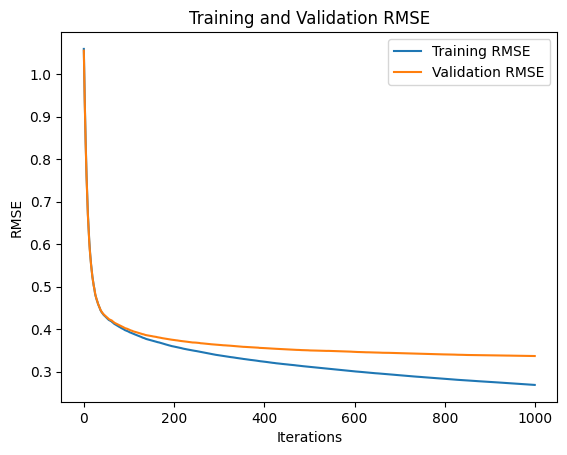

In [ ]:
# Plot training and validation error
plt.plot(model2.get_evals_result()['learn']['RMSE'], label='Training RMSE')
plt.plot(model2.get_evals_result()['validation']['RMSE'], label='Validation RMSE')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('Training and Validation RMSE')
plt.legend()
plt.show()

## Final Training, Save Model, Prediction, Postprocessing, and Submission

In [ ]:
final_model = hyperparameter_model

In [ ]:
with open("model_wichu.pkl", "wb") as file:
    pickle.dump(final_model, file)

In [ ]:
with open("model_wichu.pkl", "rb") as file:
    final_cb_model = pickle.load(file)

In [ ]:
pred = final_cb_model.predict(final_test_new)

In [ ]:
pred1 = np.exp(pred) - 1

In [ ]:
submission = pd.read_csv(f'{directory}/sample_submission.csv')
submission['rain_sum (mm)'] = np.maximum(0, pred1) # Sedikit postprocessing karena curah hujan tidak mungkin negatif
submission.to_csv('hyper.csv', index=False)

### Hasil Hyperparameter Tuning

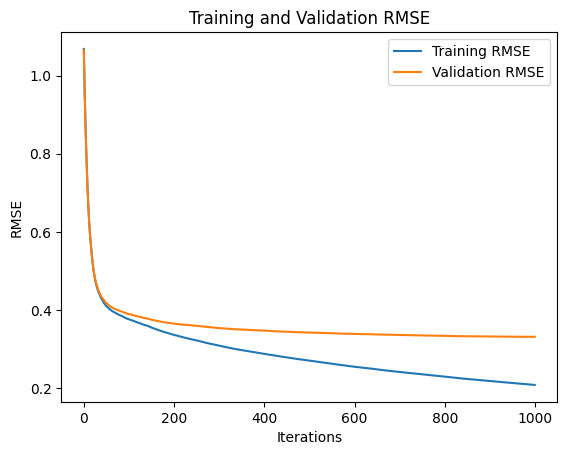

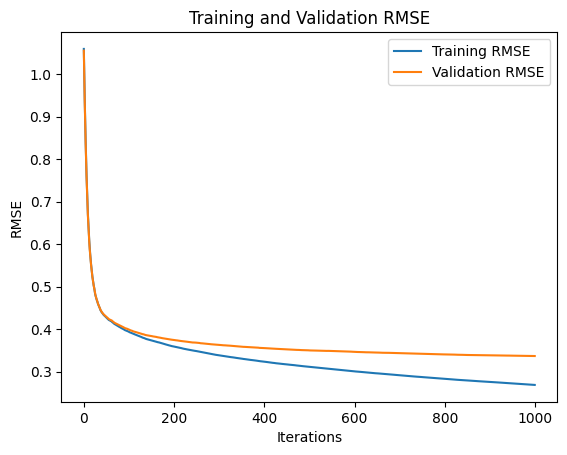

Atas adalah sebelum hyperparameter tuning. Bawah adalah setelah hyperparameter tuning. Dapat dilihat bahwa hasil sebelum hyperparameter tuning lebih riskan untuk mengalami overfit

# +++

In [ ]:
import pathlib
import pkg_resources

installed_packages = {pkg.key for pkg in pkg_resources.working_set}

# Menyimpan nama library beserta versi yang digunakan ke file requirements.txt
with open('requirements.txt', 'w') as f:
    for package in sorted(installed_packages):
        version = pkg_resources.get_distribution(package).version
        f.write(f"{package}=={version}\n")

<ipython-input-178-d95482ead8d4>:2: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources


In [ ]:
from google.colab import files
# Mendownload file requirements.txt
files.download('requirements.txt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>